In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import warnings, functools
warnings.filterwarnings('ignore')
import functools
from decimal import Decimal
import openpyxl
import numpy as np
import pandas as pd
import scipy.stats as sps
import matplotlib.pyplot as plt
import seaborn as sns

from src.parse import parse_data
from src.utils import conf_iterval, norm_pdf
from src.model import Cyton2Model

rc = {
	'font.size': 16, 'axes.titlesize': 16, 'axes.labelsize': 16,
	'xtick.labelsize': 16, 'ytick.labelsize': 16,
	'figure.figsize': (8, 6),
	'axes.grid': False, 'grid.linestyle': ':', 'axes.grid.which': 'both',
	'axes.axisbelow': True, 'axes.titlepad': 0,
	'axes.spines.top': False, 'axes.spines.right': False,
	'axes.spines.left': True, 'axes.spines.bottom': True,
	'ytick.left': True, 'xtick.bottom': True,
	'lines.markersize': 4.5, 'lines.linewidth': 1.0,
	'errorbar.capsize': 2.5
}
sns.set_theme(context='paper', style='white', rc=rc)

# Functions

## Replacment of timers

In [2]:
# Define a function to perform signal addition by replacement of timers
# 1. Handles point estimates
# 2. Generate curves for CIs

def signalAddReplace(ctrlPars, ctrlBoot, sig1Pars, sig1Boot, sig2Pars, sig2Boot):
	"""Function to perform replacing of the timers with appropriate fitted parameters.
	ctrlPars, ctrlBoot refer to the control in which we believe has no contribution to the prediction, i.e. mDD, sDD, 1-pl
	sig1 : Reserved for the signal that affects division parameters, i.e. mDiv0, sDiv0, b
	sig2 : Reserved for the signal that affects death parameters, i.e. mDie, sDie
	"""
	# Construct predicted parameter from point estimates
	predPars = {
		'mDD': ctrlPars['mDD'], 'sDD': ctrlPars['sDD'], '1-pl': ctrlPars['1-pl'],	# Time to div. destiny & (1 - proportion lost) not changed w.r.t control
		'mDiv0': sig1Pars['mDiv0'], 'sDiv0': sig1Pars['sDiv0'], 'b': sig1Pars['b'], # Time to first div. and sub. div. time replaced by Signal 1
		'mDie': sig2Pars['mDie'], 'sDie': sig2Pars['sDie']							# Time to death replaced by Signal 2
	}

	predBoot = {f'{par}': [] for par in predPars.keys()}
	for (_, ctrl), (_, sig1), (_, sig2) in zip(ctrlBoot.iterrows(), sig1Boot.iterrows(), sig2Boot.iterrows()):
		predBoot['mDD'].append(ctrl['mDD']); predBoot['sDD'].append(ctrl['sDD']); predBoot['1-pl'].append(ctrl['1-pl'])
		predBoot['mDiv0'].append(sig1['mDiv0']); predBoot['sDiv0'].append(sig1['sDiv0']); predBoot['b'].append(sig1['b'])
		predBoot['mDie'].append(sig2['mDie']); predBoot['sDie'].append(sig2['sDie'])
	return pd.DataFrame([predPars]), pd.DataFrame(predBoot)

def predict(df, icnd, predPars, predBoot, combBoot):
	hts = df['reader'].harvested_times[icnd]
	mgens = df['reader'].generation_per_condition[icnd]
	t0, tf, dt = 0, max(hts)+5, 0.1
	times = np.linspace(t0, tf, num=int(tf/dt)+1)

	N0 = df['cells']['avg'][icnd][0]  # Average total cell numbers at 0h
	N1 = N0 * predPars['1-pl']
	model = Cyton2Model(hts, N1, mgens, dt, [], logn=False)
	ext = model.extrapolate(times, predPars)

	_ext_cells_gen = []
	_hts_cells_gen = []
	curvesCI = {
		'f_tdiv0': [], 'f_tdd': [], 'f_tdie': [],
		'tdiv0': [], 'tdd': [], 'tdie': [],
		'ext_total_cells': [], 'ext_cells_gen': [],
		'hts_total_cells': [], 'hts_cells_gen': [],
		'mDiv0': [], 'sDiv0': [],
		'mDD': [], 'sDD': [],
		'mDie': [], 'sDie': [],
		'b': []
	}
	for (_, pPars), (_, comb) in zip(predBoot.iterrows(), combBoot.iterrows()):
		b_N1 = comb['N0'] * pPars['1-pl']  # N1 is measured cell numbers * actv. frac. of the control
		b_model = Cyton2Model(hts, b_N1, mgens, dt, [], logn=False)
		b_ext = b_model.extrapolate(times, pPars)

		f_tdiv0 = norm_pdf(times, comb['mDiv0'], comb['sDiv0'])
		f_tdd = norm_pdf(times, comb['mDD'], comb['sDD'])
		f_tdie = norm_pdf(times, comb['mDie'], comb['sDie'])
		curvesCI['f_tdiv0'].append(f_tdiv0)
		curvesCI['f_tdd'].append(f_tdd)
		curvesCI['f_tdie'].append(f_tdie)

		curvesCI['mDiv0'].append(pPars['mDiv0']); curvesCI['sDiv0'].append(pPars['sDiv0'])
		curvesCI['mDD'].append(pPars['mDD']); curvesCI['sDD'].append(pPars['sDD'])
		curvesCI['mDie'].append(pPars['mDie']); curvesCI['sDie'].append(pPars['sDie'])
		
		b_tdiv0 = norm_pdf(times, pPars['mDiv0'], pPars['sDiv0'])
		b_tdd = norm_pdf(times, pPars['mDD'], pPars['sDD'])
		b_tdie = norm_pdf(times, pPars['mDie'], pPars['sDie'])
		curvesCI['tdiv0'].append(b_tdiv0)
		curvesCI['tdd'].append(b_tdd)
		curvesCI['tdie'].append(b_tdie)

		curvesCI['ext_total_cells'].append(b_ext['ext']['total_live_cells'])
		_ext_cells_gen.append(b_ext['ext']['cells_gen'])
		curvesCI['ext_cells_gen'].append(_ext_cells_gen)
		curvesCI['hts_total_cells'].append(b_ext['hts']['total_live_cells'])
		_hts_cells_gen.append(b_ext['hts']['cells_gen'])
		curvesCI['hts_cells_gen'].append(_hts_cells_gen)
		curvesCI['b'].append(pPars['b'])
	# Calculate 95% confidence bands
	for obj in curvesCI:
		stack = np.vstack(curvesCI[obj])
		curvesCI[obj] = conf_iterval(stack, rgs=95)
	return times, ext, curvesCI

# Example: Dex 1 + MPA 50
# predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsMPA50, bootMPA50, parsDEX1, bootDEX1)
# ext, curvesCI = predict(dfDEX_MPA, 5, predPars, predBoot, bootDEX1MPA50)

## Check predictions

In [3]:
def check_prediction(df, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path):
	## PDFs (Fitted vs Predicted)
	fig1, ax1 = plt.subplots(tight_layout=True)
	# ax1.plot([], [], 'k--', label="Fitted")
	# ax1.plot(times, norm_pdf(times, fittedPars['mDiv0'], fittedPars['sDiv0']), 'b--')
	# ax1.fill_between(times, curvesCI['f_tdiv0'][0], curvesCI['f_tdiv0'][1], color='darkblue', alpha=0.3)
	# ax1.plot(times, norm_pdf(times, fittedPars['mDD'], fittedPars['sDD']), 'g--')
	# ax1.fill_between(times, curvesCI['f_tdd'][0], curvesCI['f_tdd'][1], color='darkgreen', alpha=0.3)
	# ax1.plot(times, -norm_pdf(times, fittedPars['mDie'], fittedPars['sDie']), 'r--')
	# ax1.fill_between(times, -curvesCI['f_tdie'][0], -curvesCI['f_tdie'][1], color='darkred', alpha=0.3)

	mDiv0, mDiv0_low, mDiv0_upp = predPars['mDiv0'].values[0], curvesCI['mDiv0'][0][0], curvesCI['mDiv0'][1][0]
	sDiv0, sDiv0_low, sDiv0_upp = predPars['sDiv0'].values[0], curvesCI['sDiv0'][0][0], curvesCI['sDiv0'][1][0]
	label_Tdiv0 = f"$T_{{div}}^0 \sim \mathcal{{N}}({mDiv0:.2f}\pm_{{{mDiv0-mDiv0_low:.2f}}}^{{{mDiv0_upp-mDiv0:.2f}}}, {sDiv0:.3f} \pm_{{{sDiv0-sDiv0_low:.3f}}}^{{{sDiv0_upp-sDiv0:.3f}}})$"
	tdiv0 = norm_pdf(times, mDiv0, sDiv0)
	mDD, mDD_low, mDD_upp = predPars['mDD'].values[0], curvesCI['mDD'][0][0], curvesCI['mDD'][1][0]
	sDD, sDD_low, sDD_upp = predPars['sDD'].values[0], curvesCI['sDD'][0][0], curvesCI['sDD'][1][0]
	label_Tdd = f"$T_{{dd}} \sim \mathcal{{N}}({mDD:.2f}\pm_{{{mDD-mDD_low:.2f}}}^{{{mDD_upp-mDD:.2f}}}, {sDD:.3f}\pm_{{{sDD-sDD_low:.3f}}}^{{{sDD_upp-sDD:.3f}}})$"
	tdd = norm_pdf(times, mDD, sDD)
	mDie, mDie_low, mDie_upp = predPars['mDie'].values[0], curvesCI['mDie'][0][0], curvesCI['mDie'][1][0]
	sDie, sDie_low, sDie_upp = predPars['sDie'].values[0], curvesCI['sDie'][0][0], curvesCI['sDie'][1][0]
	label_Tdie = f"$T_{{die}} \sim \mathcal{{N}}({mDie:.2f}\pm_{{{mDie-mDie_low:.2f}}}^{{{mDie_upp-mDie:.2f}}}, {sDie:.3f}\pm_{{{sDie-sDie_low:.3f}}}^{{{sDie_upp-sDie:.3f}}})$"
	tdie = norm_pdf(times, mDie, sDie)
	# ax1.plot([], [], 'k-', label="Predicted")
	b, b_low, b_upp = predPars['b'].values[0], curvesCI['b'][0][0], curvesCI['b'][1][0]
	ax1.annotate(f"$b = {b:.2f}\pm_{{{b-b_low:.2f}}}^{{{b_upp-b:.2f}}}h$", xy=(0.01, 0.95), xycoords='axes fraction', color='navy')
	ax1.plot(times, tdiv0, 'b-', label=label_Tdiv0)
	ax1.fill_between(times, curvesCI['tdiv0'][0], curvesCI['tdiv0'][1], fc='b', ec=None, alpha=0.3)
	ax1.plot(times, tdd, 'g-', label=label_Tdd)
	ax1.fill_between(times, curvesCI['tdd'][0], curvesCI['tdd'][1], fc='g', ec=None, alpha=0.3)
	ax1.plot(times, -tdie, 'r-', label=label_Tdie)
	ax1.fill_between(times, -curvesCI['tdie'][0], -curvesCI['tdie'][1], fc='r', ec=None, alpha=0.3)
	ax1.set(xlim=[0,max(times)], xlabel="Time (hour)", ylabel="Density")
	ax1.legend(fontsize=12)
	ax1.set_yticks(ax1.get_yticks())
	ax1.set_yticklabels(np.round(np.abs(ax1.get_yticks()), 5))  # remove negative y-tick labels

	## Total cells (incl. cells per generation vs time)
	fig2, ax2 = plt.subplots(tight_layout=True)
	hts = df['reader'].harvested_times[icnd]
	mgens = df['reader'].generation_per_condition[icnd]
	cells = df['cells']['avg'][icnd]
	cells_sem = df['cells']['sem'][icnd]
	ax2.errorbar(hts, cells, yerr=cells_sem, fmt='ko', mfc='none', mec='k', label="Total")
	ax2.plot(times, ext['ext']['total_live_cells'], 'k-', label="Model")
	ax2.fill_between(times, curvesCI['ext_total_cells'][0], curvesCI['ext_total_cells'][1], fc='k', ec=None, alpha=0.3)
	cp = sns.hls_palette(mgens+1, l=0.4, s=0.5)
	for igen in range(0, mgens+1):
		ax2.errorbar(hts, np.transpose(df['cgens']['avg'][icnd])[igen], yerr=np.transpose(df['cgens']['sem'][icnd])[igen], c=cp[igen], fmt='o', ms=5, label=f"Gen {igen}")
		ax2.plot(times, ext['ext']['cells_gen'][igen], c=cp[igen])
		ax2.fill_between(times, curvesCI['ext_cells_gen'][0][igen], curvesCI['ext_cells_gen'][1][igen], fc=cp[igen], ec=None, alpha=0.3)
	ax2.legend(fontsize=12)
	ax2.set(xlim=[0,max(times)], ylim=[0,None], xlabel="Time (hour)", ylabel="Cell number")
	ax2.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
	ax2.yaxis.major.formatter._useMathText = True

	## Cells per generation
	fig3 = plt.figure(figsize=(8,7))
	gens = np.array([i for i in range(mgens+1)])
	fig3.text(0.5, 0.04, "Generations", ha='center', va='center')
	fig3.text(0.02, 0.5, "Cell number", ha='center', va='center', rotation=90)
	axes = []  # store axis
	for itpt, ht in enumerate(hts):
		ax3 = plt.subplot(3, 3, itpt+1)
		ax3.set_axisbelow(True)
		ax3.errorbar(gens, df['cgens']['avg'][icnd][itpt], yerr=df['cgens']['sem'][icnd][itpt], fmt='ro', label='Data')
		ax3.plot(gens, ext['hts']['cells_gen'][itpt], 'o-', c='k', ms=5, label='Model')
		ax3.fill_between(gens, curvesCI['hts_cells_gen'][0][itpt], curvesCI['hts_cells_gen'][1][itpt], fc='k', ec=None, alpha=0.3)
		ax3.set_xticks(gens)
		ax3.annotate(f"{ht}h", xy=(0.75, 0.85), xycoords='axes fraction')
		ax3.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
		ax3.yaxis.major.formatter._useMathText = True
		if itpt not in [len(hts)-3, len(hts)-2, len(hts)-1]:
			ax3.set_xticklabels([])
		if itpt not in [0, 3, 6, 9, 12]:
			ax3.set_yticklabels([])
		ax3.spines['right'].set_visible(True)
		ax3.spines['top'].set_visible(True)
		ax3.grid(True, ls='--')
		axes.append(ax3)
	max_ylim = 0
	for ax in axes:
		_, ymax = ax.get_ylim()
		if max_ylim < ymax:
			max_ylim = ymax
	for ax in axes:
		ax.set_ylim(top=max_ylim)
	handles, labels = [], []
	for ax in fig3.axes:
		hs, ls = ax.get_legend_handles_labels()
		for h, l in zip(hs, ls):
			if l not in labels:
				handles.append(h)
				labels.append(l)
	fig3.legend(handles=handles, labels=labels, fontsize=12, ncol=3, bbox_to_anchor=(1,1))
	fig3.tight_layout(rect=(0.02, 0.03, 1, 1))
	fig3.subplots_adjust(wspace=0.05, hspace=0.2)

	## Quantifying predictive power
	# Data vs Model (linear relation b/w data and predicted total cell numbers)
	x1 = np.array(df['cells']['avg'][icnd])
	x1_sem = np.array(df['cells']['sem'][icnd])
	y1 = np.array(ext['hts']['total_live_cells'])
	tcell_max = max(np.concatenate([x1, y1]))
	y_eq_x = np.linspace(0, tcell_max, num=10000)

	fig4, ax4 = plt.subplots(tight_layout=True)
	ax4.plot(y_eq_x, y_eq_x, 'k--')
	ax4.quiver(x1[:-1], y1[:-1], x1[1:]-x1[:-1], y1[1:]-y1[:-1], scale_units='xy', angles='xy', scale=1, width=0.004)
	for i, (x, y) in enumerate(zip(x1, y1)):
		ylow95 = y - curvesCI['hts_total_cells'][0][i]
		yupp95 = curvesCI['hts_total_cells'][1][i] - y
		if ylow95 < 0:
			ylow95 = 0
		if yupp95 < 0:
			yupp95 = 0
		ax4.errorbar(x, y, xerr=x1_sem[i], yerr=[[ylow95], [yupp95]], fmt='o', ms=6, mec='k', label=f"{hts[i]}h", zorder=10, clip_on=False)
	ax4.legend(fontsize=12, handletextpad=0.1)
	ax4.set(xlabel="Measured total cell number", ylabel="Predicted total cell number", xlim=[0,None], ylim=[0,None])
	ax4.ticklabel_format(style='sci', axis='both', scilimits=(0,0))
	ax4.xaxis.major.formatter._useMathText = True
	ax4.yaxis.major.formatter._useMathText = True

	rho = sps.pearsonr(x1, y1)
	ax4.annotate(r"Pearson's $r$", xy=(0.13, 0.95), xycoords='axes fraction', fontsize=14)
	ax4.annotate(rf"$r = {rho.statistic:.3f}$ ($p$ = {rho.pvalue:.5f})", xy=(0.13, 0.9), xycoords='axes fraction', fontsize=14)

	# Root-mean-squared-error
	def rmse(data, model):
		RSS = np.sum((data - model)**2)  # residual sum-of-squares
		MSE = RSS / len(data)			  # mean-squared-error
		RMSE = np.sqrt(MSE)			  # root-mean-squared-error
		return RMSE
	
	data = np.array(df['cgens']['rep'][icnd])
	data_flat = data.ravel()
	reps = [len(l) for l in data]

	# RMSE of fitted (+bootstrap)
	N0 = df['cells']['avg'][icnd][0]
	f_N1 = N0 * fittedPars['1-pl']
	f_model = Cyton2Model(hts, f_N1, mgens, 0.1, reps, logn=False)
	f_eval = f_model.evaluate(
		fittedPars['mDiv0'], fittedPars['sDiv0'],
		fittedPars['mDD'], fittedPars['sDD'],
		fittedPars['mDie'], fittedPars['sDie'],
		fittedPars['b']
	)
	f_rmse = rmse(data_flat, f_eval)
	fb_rmse = []
	for _, f_boot in fittedBoot.iterrows():
		f_pars = fittedPars.copy()
		f_pars['mDiv0'], f_pars['sDiv0'] = f_boot['mDiv0'], f_boot['sDiv0']
		f_pars['mDD'], f_pars['sDD'] = f_boot['mDD'], f_boot['sDD']
		f_pars['mDie'], f_pars['sDie'] = f_boot['mDie'], f_boot['sDie']
		f_pars['b'] = f_boot['b']
		
		fb_N1 = f_boot['N0'] * f_boot['1-pl']
		fb_model = Cyton2Model(hts, fb_N1, mgens, 0.1, reps, logn=False)
		fb_eval = fb_model.evaluate(
			f_pars['mDiv0'], f_pars['sDiv0'],
			f_pars['mDD'], f_pars['sDD'],
			f_pars['mDie'], f_pars['sDie'],
			f_pars['b']
		)
		fb_rmse.append(rmse(data_flat, fb_eval))
	
	# RMSE of predicted (+bootstrap)
	p_N1 = N0 * predPars['1-pl']
	p_model = Cyton2Model(hts, p_N1, mgens, 0.1, reps, logn=False)
	p_eval = p_model.evaluate(
		predPars['mDiv0'], predPars['sDiv0'],
		predPars['mDD'], predPars['sDD'],
		predPars['mDie'], predPars['sDie'],
		predPars['b']
	)
	p_rmse = rmse(data_flat, p_eval)
	pb_rmse = []
	for (_, p_boot), (_, f_boot) in zip(predBoot.iterrows(), fittedBoot.iterrows()):
		p_pars = predPars.copy()
		p_pars['mDiv0'], p_pars['sDiv0'] = p_boot['mDiv0'], p_boot['sDiv0']
		p_pars['mDD'], p_pars['sDD'] = p_boot['mDD'], p_boot['sDD']
		p_pars['mDie'], p_pars['sDie'] = p_boot['mDie'], p_boot['sDie']
		p_pars['b'] = p_boot['b']

		pb_N1 = f_boot['N0'] * p_boot['1-pl']
		pb_model = Cyton2Model(hts, pb_N1, mgens, 0.1, reps, logn=False)
		pb_eval = pb_model.evaluate(
			p_pars['mDiv0'], p_pars['sDiv0'],
			p_pars['mDD'], p_pars['sDD'],
			p_pars['mDie'], p_pars['sDie'],
			p_pars['b']
		)
		pb_rmse.append(rmse(data_flat, pb_eval))
	
	fig5, ax5 = plt.subplots(tight_layout=True)
	ax5.axhline(f_rmse, color='b', ls='--')
	ax5.axhline(p_rmse, color='r', ls='--')
	sns.violinplot([fb_rmse, pb_rmse], palette=['b', 'r'], ax=ax5)
	ax5.set_xticklabels(['Fitted', 'Predicted'])
	ax5.set(ylabel="RMSE", ylim=[0,None])

	save_to_excel(times, tdiv0, tdd, tdie, ext, curvesCI, hts, mgens, gens, x1, x1_sem, y1, f_rmse, fb_rmse, p_rmse, pb_rmse, path)

	return fig1, fig2, fig3, fig4, fig5


def save_to_excel(times, tdiv0, tdd, tdie, ext, CI, hts, mgen, gens, x, x_sem, y, f_rmse, fb_rmse, p_rmse, pb_rmse, path):
	def auto_adjust_xlsx_column_width(df, writer, sheet_name, margin=0, length_factor=1.0, decimals=3, index=False):
		def text_length(text):
			"""
			Get the effective text length in characters, taking into account newlines
			"""
			if not text:
				return 0
			lines = text.split("\n")
			return max(len(line) for line in lines)

		def _to_str_for_length(v, decimals=3):
			"""
			Like str() but rounds decimals to predefined length
			"""
			if isinstance(v, float):
				# Round to [decimal] places
				return str(Decimal(v).quantize(Decimal('1.' + '0' * decimals)).normalize())
			else:
				return str(v)
		
		sheet = writer.sheets[sheet_name]
		_to_str = functools.partial(_to_str_for_length, decimals=decimals)
		# Compute & set column width for each column
		for column_name in df.columns:
			# Convert the value of the columns to string and select the 
			column_length =  max(df[column_name].apply(_to_str).map(text_length).max(), text_length(column_name)) + 5
			# Get index of column in XLSX
			# Column index is +1 if we also export the index column
			col_idx = df.columns.get_loc(column_name)
			if index:
				col_idx += 1
			# Set width of column to (column_length + margin)
			sheet.column_dimensions[openpyxl.utils.cell.get_column_letter(col_idx+1)].width = column_length * length_factor + margin
		# Compute column width of index column (if enabled)
		if index: # If the index column is being exported
			index_length =  max(df.index.map(_to_str).map(text_length).max(), text_length(df.index.name))
			sheet.column_dimensions["A"].width = index_length * length_factor + margin
	
	predPDFs = pd.DataFrame({
		'Time (hour)': times,
		'Tdiv0': tdiv0,
		'Tdiv0 (low95)': CI['tdiv0'][0],
		'Tdiv0 (upp95)': CI['tdiv0'][1],
		'Tdd': tdd,
		'Tdd (low95)': CI['tdd'][0],
		'Tdd (upp95)': CI['tdd'][1],
		'Tdie': tdie,
		'Tdie (low95)': CI['tdie'][0],
		'Tdie (upp95)': CI['tdie'][1],
	})
	cellsVStime = pd.DataFrame({
		'Time (hour)': times,
		'Total cells': ext['ext']['total_live_cells'],
		'Total cells (low95)': CI['ext_total_cells'][0],
		'Total cells (upp95)': CI['ext_total_cells'][1],
	})
	for igen in range(mgen+1):
		cellsVStime[f'Gen{igen}'] = ext['ext']['cells_gen'][igen]
		cellsVStime[f'Gen{igen} (low95)'] = CI['ext_cells_gen'][0][igen]
		cellsVStime[f'Gen{igen} (upp95)'] = CI['ext_cells_gen'][1][igen]
	
	cellsVSgen = pd.DataFrame({
		'Gens': gens
	})
	for itpt, ht in enumerate(hts):
		cellsVSgen[f'{ht}h'] = ext['hts']['cells_gen'][itpt]
		cellsVSgen[f'{ht}h (low95)'] = CI['hts_cells_gen'][0][itpt]
		cellsVSgen[f'{ht}h (upp95)'] = CI['hts_cells_gen'][1][itpt]

	predVSdata = pd.DataFrame({
		'Time points (hour)': hts,
		'Measured total cells': x,
		'Measured total cells (low SEM)': x - x_sem,
		'Measured total cells (upp SEM)': x + x_sem,
		'Predicted total cells': y,
		'Predicted total cells (low95)': CI['hts_total_cells'][0],
		'Predicted total cells (upp95)': CI['hts_total_cells'][1]
	})

	RMSE = pd.DataFrame({
		'Fitted (point est.)': f_rmse,
		'Fitted (bootstrap)': fb_rmse,
		'Predicted (point est.)' : p_rmse,
		'Predicted (bootstrap)': pb_rmse
	})

	ex_path = f"{path}/Model prediction.xlsx"
	with pd.ExcelWriter(ex_path, engine='openpyxl', mode='w') as writer:
		predPDFs.to_excel(writer, index=False, sheet_name="PDFs")
		cellsVStime.to_excel(writer, index=False, sheet_name="Cyton2 (Cells)")
		cellsVSgen.to_excel(writer, index=False, sheet_name="Cyton2 (CellsPerGen)")
		predVSdata.to_excel(writer, index=False, sheet_name="Model vs Data")
		RMSE.to_excel(writer, index=False, sheet_name="RMSE")
		wsRMSE = writer.sheets['RMSE']
		wsRMSE.merge_cells(start_row=2, start_column=1, end_row=len(fb_rmse)+1, end_column=1)
		wsRMSE.merge_cells(start_row=2, start_column=3, end_row=len(pb_rmse)+1, end_column=3)
		wsRMSE.cell(2, 1).alignment = openpyxl.styles.Alignment(horizontal='center', vertical='center')
		wsRMSE.cell(2, 3).alignment = openpyxl.styles.Alignment(horizontal='center', vertical='center')

		auto_adjust_xlsx_column_width(predPDFs, writer, "PDFs")
		auto_adjust_xlsx_column_width(cellsVStime, writer, "Cyton2 (Cells)")
		auto_adjust_xlsx_column_width(cellsVSgen, writer, "Cyton2 (CellsPerGen)")
		auto_adjust_xlsx_column_width(predVSdata, writer, "Model vs Data")
		auto_adjust_xlsx_column_width(RMSE, writer, "RMSE")

# [DV23_007] Dex + Rapa

In [4]:
dfDEX_Rapa = parse_data('./data', ['Fig 2-3 DV23_007 OTI BimKO corrected.xlsx'])['Fig 2-3 DV23_007 OTI BimKO corrected']
dfDEX_Rapa['reader'].condition_names

['control',
 'Dex 1',
 'Dex 3.16',
 'Dex 10',
 'Rapa 158',
 'Rapa 158 Dex 1',
 'Rapa 158 Dex 3.16',
 'Rapa 158 Dex 10',
 'Rapa 500',
 'Rapa 500 Dex 1',
 'Rapa 500 Dex 3.16',
 'Rapa 500 Dex 10',
 'Rapa 1580',
 'Rapa 1580 Dex 1',
 'Rapa 1580 Dex 3.16',
 'Rapa 1580 Dex 10']

In [5]:
# Extract and define key variables
key = 'Fig 2-3 DV23_007 OTI BimKO corrected'
fitpath = './out/Best-fit Parameters/2. Different Timers/DV23_007 Dex + Rapa (Fixed Tdd)'

# Fixed Tdd
parsCTRL = pd.read_excel(f'{fitpath}/{key}_control_result.xlsx', sheet_name=f'pars_control', index_col=0)['best-fit'].to_dict()
bootCTRL = pd.read_excel(f'{fitpath}/{key}_control_result.xlsx', sheet_name=f'boot_control', index_col=0)

# Import Dex titrations
parsDEX1 = pd.read_excel(f'{fitpath}/{key}_Dex 1_result.xlsx', sheet_name=f'pars_Dex 1', index_col=0)['best-fit'].to_dict()
bootDEX1 = pd.read_excel(f'{fitpath}/{key}_Dex 1_result.xlsx', sheet_name=f'boot_Dex 1', index_col=0)

parsDEX3_16 = pd.read_excel(f'{fitpath}/{key}_Dex 3.16_result.xlsx', sheet_name=f'pars_Dex 3.16', index_col=0)['best-fit'].to_dict()
bootDEX3_16 = pd.read_excel(f'{fitpath}/{key}_Dex 3.16_result.xlsx', sheet_name=f'boot_Dex 3.16', index_col=0)

parsDEX10 = pd.read_excel(f'{fitpath}/{key}_Dex 10_result.xlsx', sheet_name=f'pars_Dex 10', index_col=0)['best-fit'].to_dict()
bootDEX10 = pd.read_excel(f'{fitpath}/{key}_Dex 10_result.xlsx', sheet_name=f'boot_Dex 10', index_col=0)

# Import Rapa titrations
parsRAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapa 158_result.xlsx', sheet_name=f'pars_Rapa 158', index_col=0)['best-fit'].to_dict()
bootRAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapa 158_result.xlsx', sheet_name=f'boot_Rapa 158', index_col=0)

parsRAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapa 500_result.xlsx', sheet_name=f'pars_Rapa 500', index_col=0)['best-fit'].to_dict()
bootRAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapa 500_result.xlsx', sheet_name=f'boot_Rapa 500', index_col=0)

parsRAPA1580 = pd.read_excel(f'{fitpath}/{key}_Rapa 1580_result.xlsx', sheet_name=f'pars_Rapa 1580', index_col=0)['best-fit'].to_dict()
bootRAPA1580 = pd.read_excel(f'{fitpath}/{key}_Rapa 1580_result.xlsx', sheet_name=f'boot_Rapa 1580', index_col=0)

## Dex 1 + Rapa 158

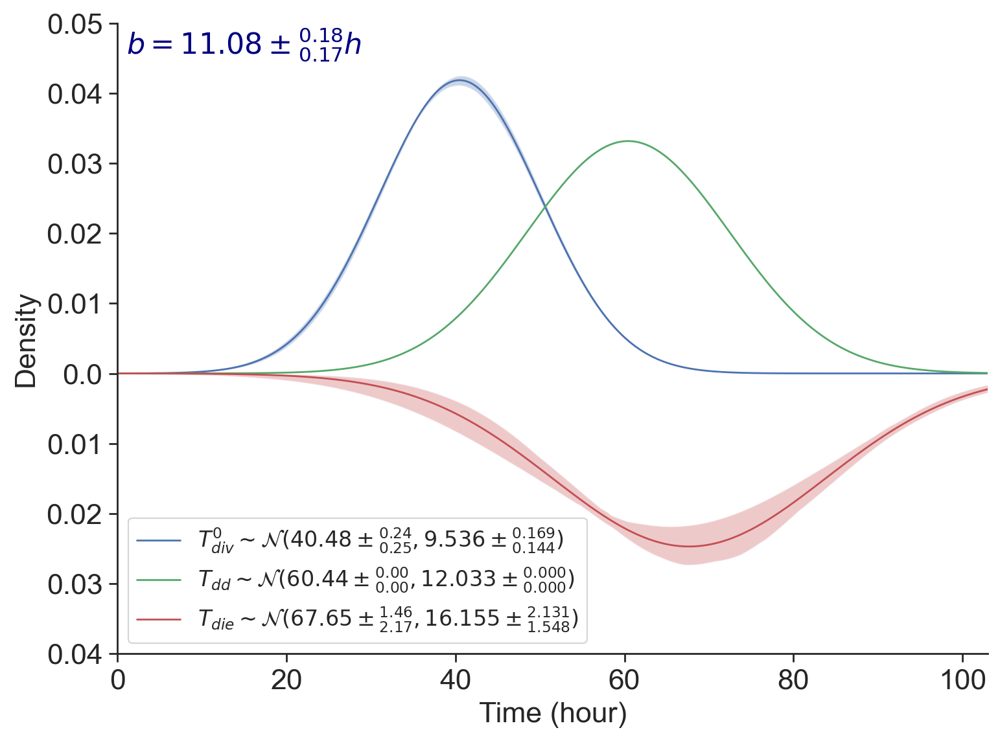

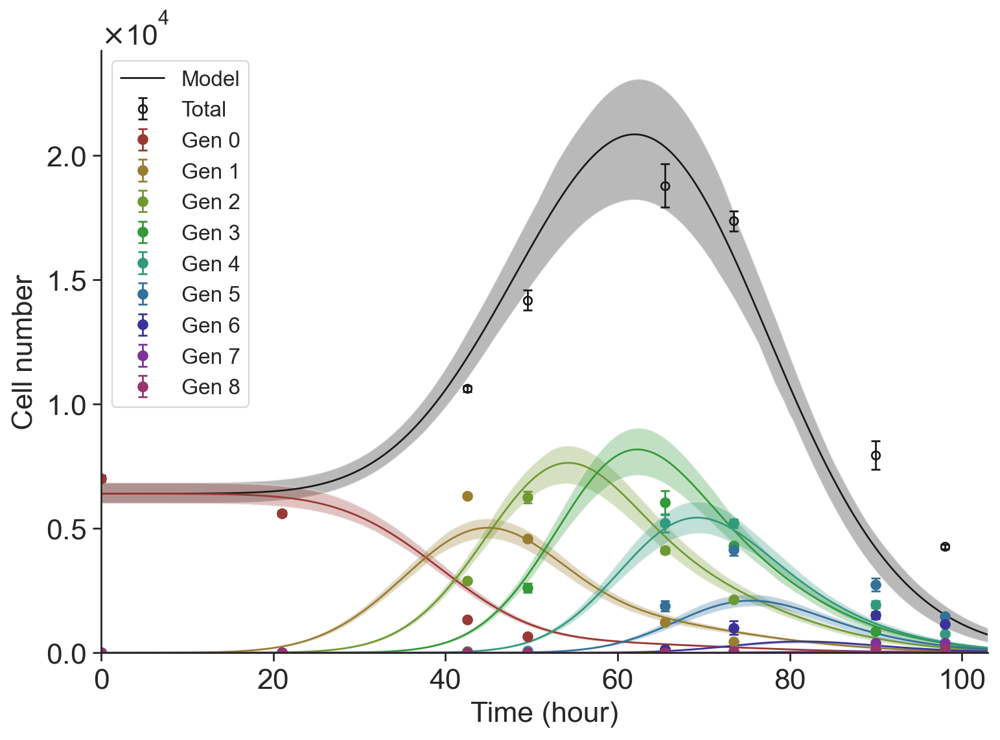

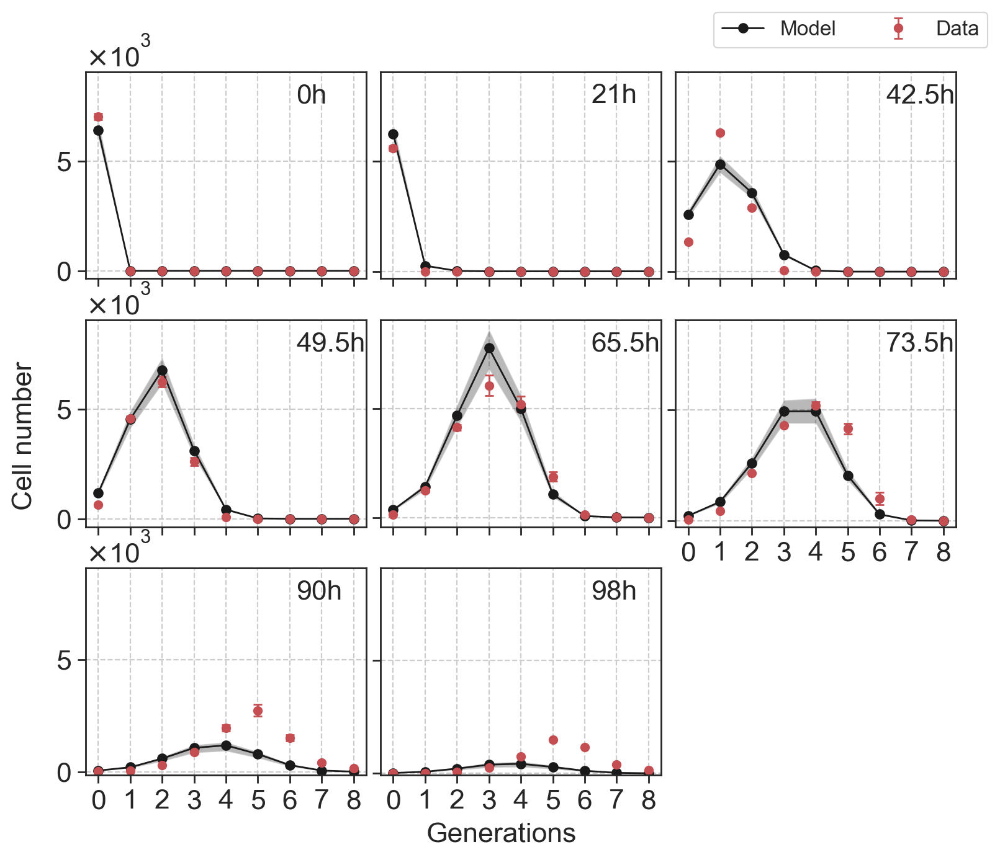

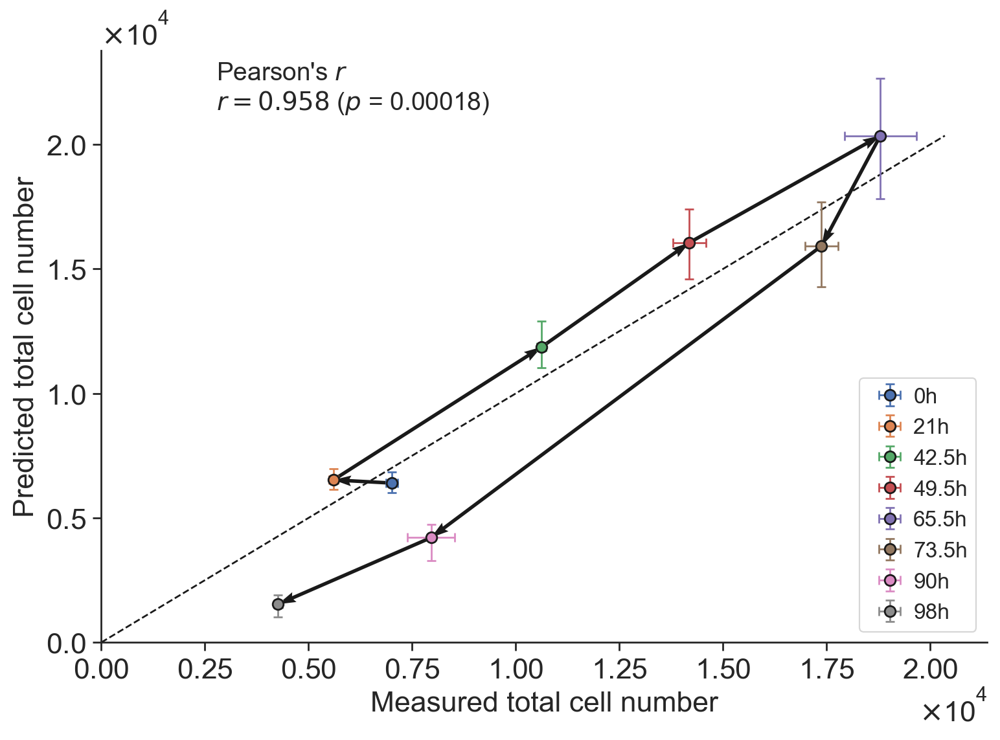

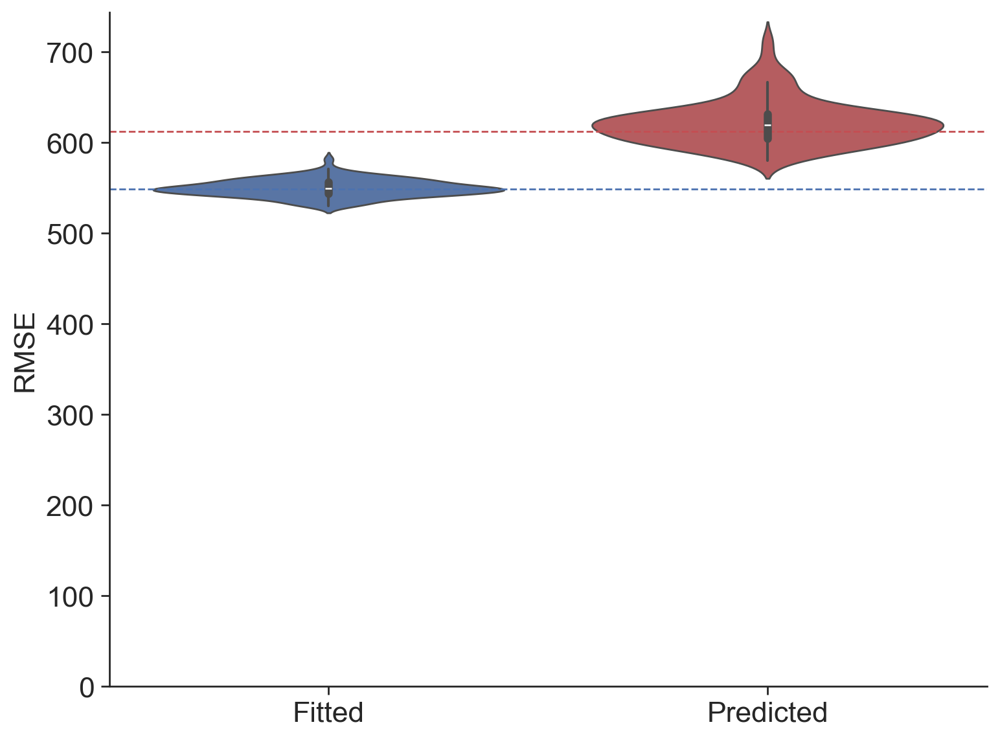

In [6]:
parsDEX1RAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapa 158 Dex 1_result.xlsx', sheet_name=f'pars_Rapa 158 Dex 1', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX1RAPA158.copy() 
bootDEX1RAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapa 158 Dex 1_result.xlsx', sheet_name=f'boot_Rapa 158 Dex 1', index_col=0)
fittedBoot = bootDEX1RAPA158.copy()

icnd = 5
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA158, bootRAPA158, parsDEX1, bootDEX1)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX1RAPA158)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV23_007/DEX 1 + RAPA 158"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 1 + Rapa 500

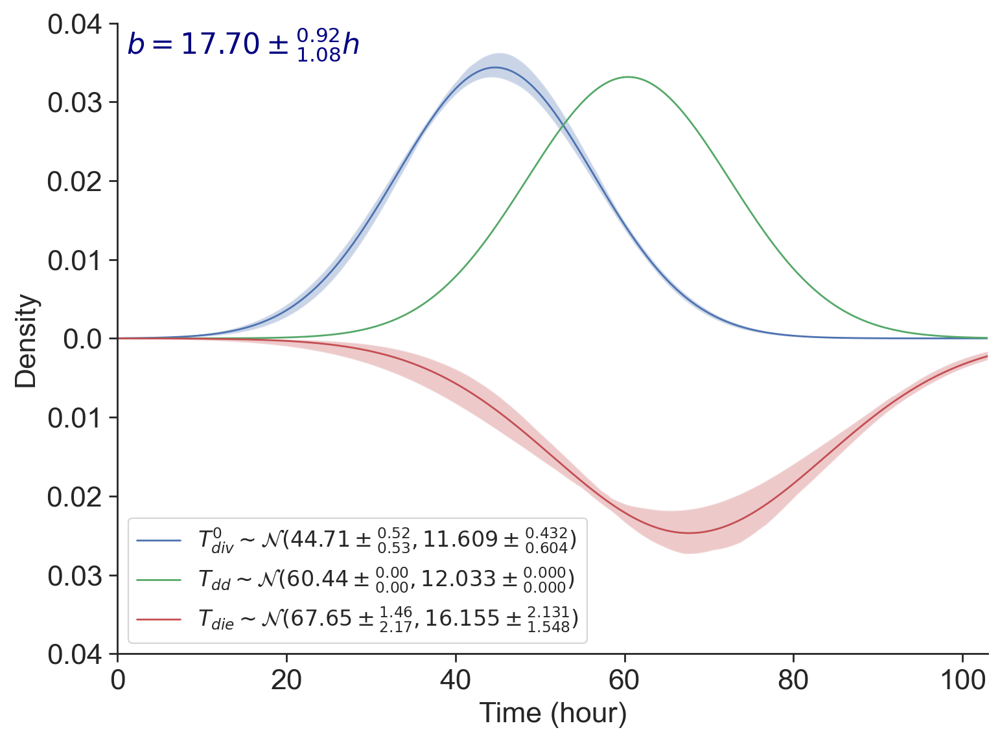

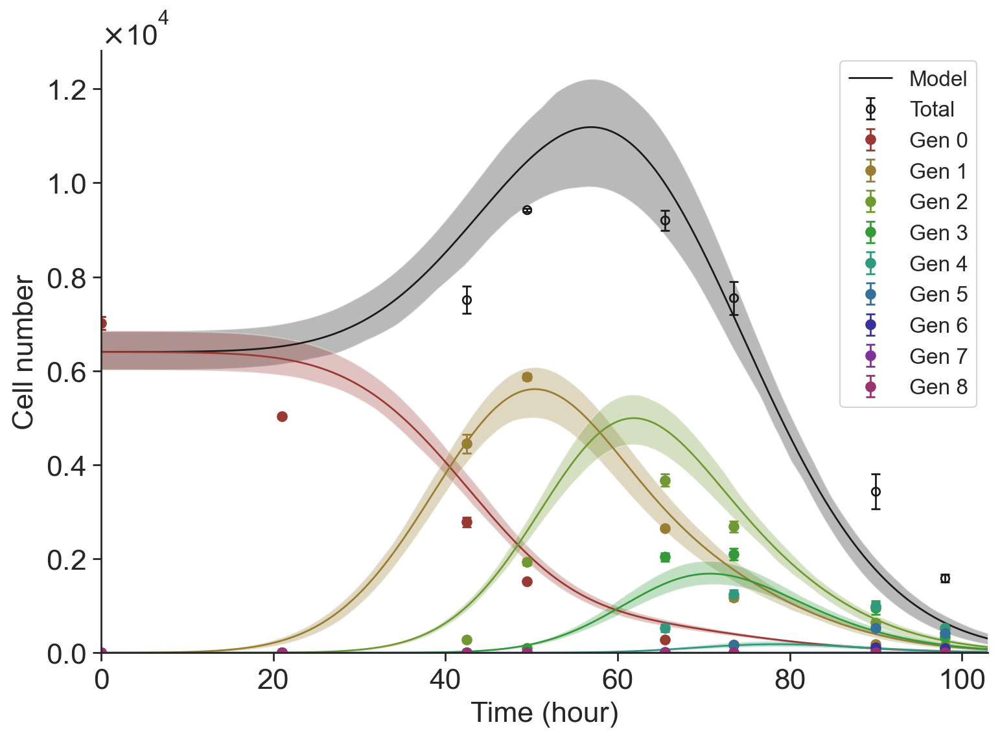

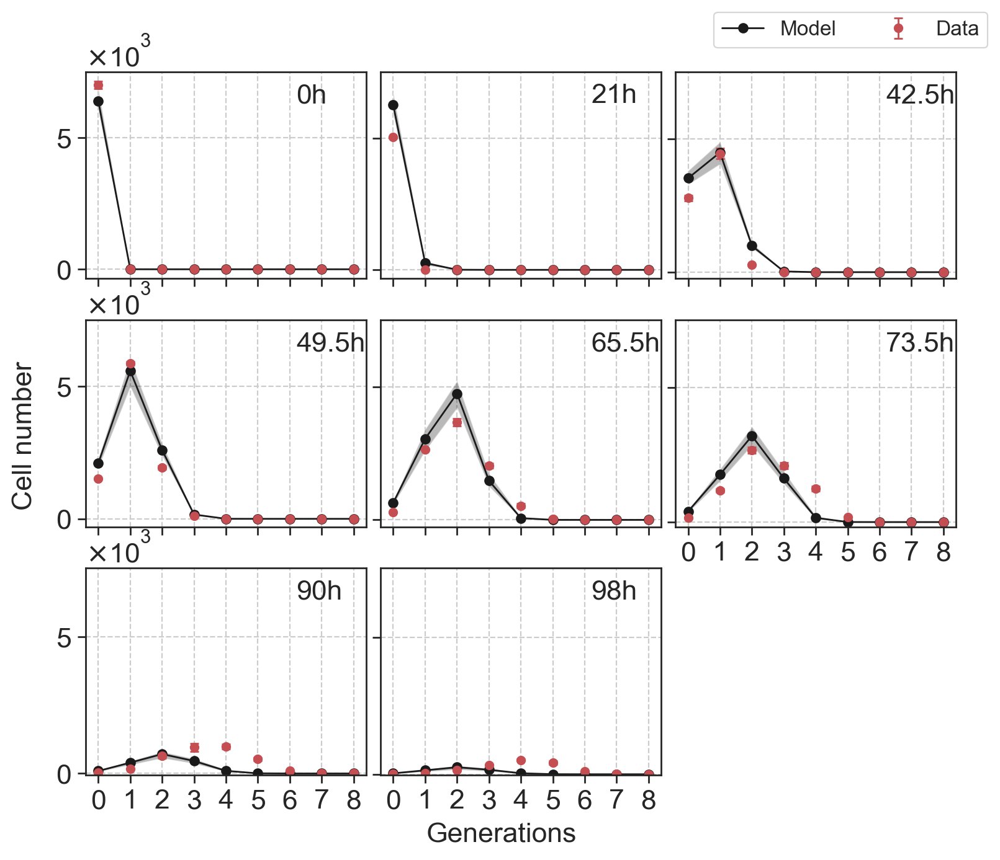

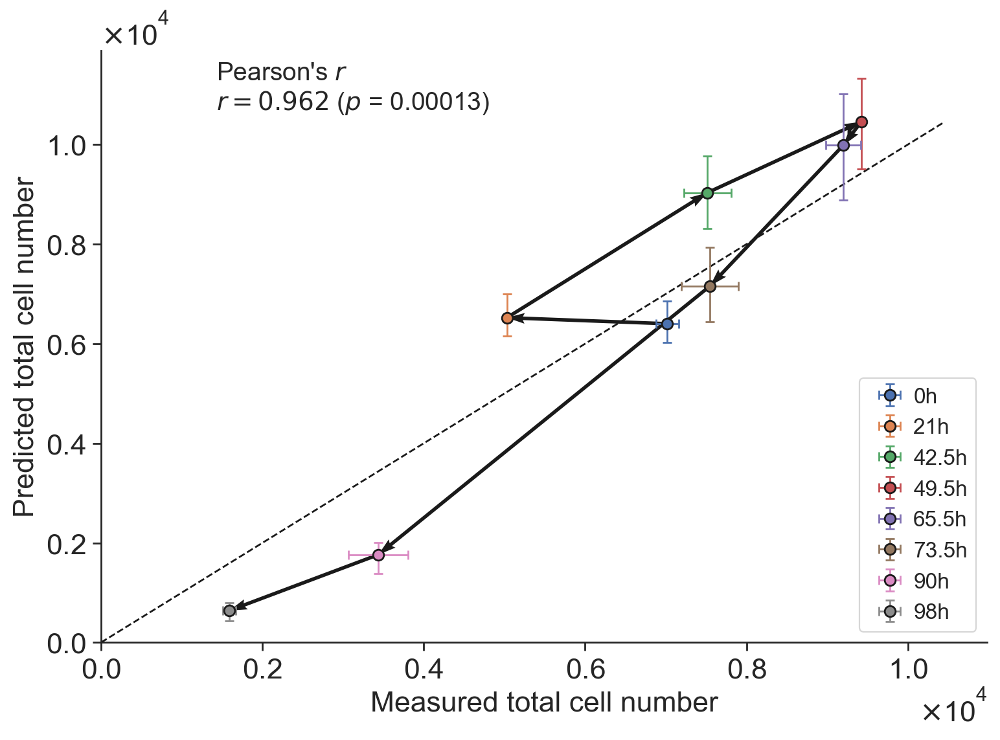

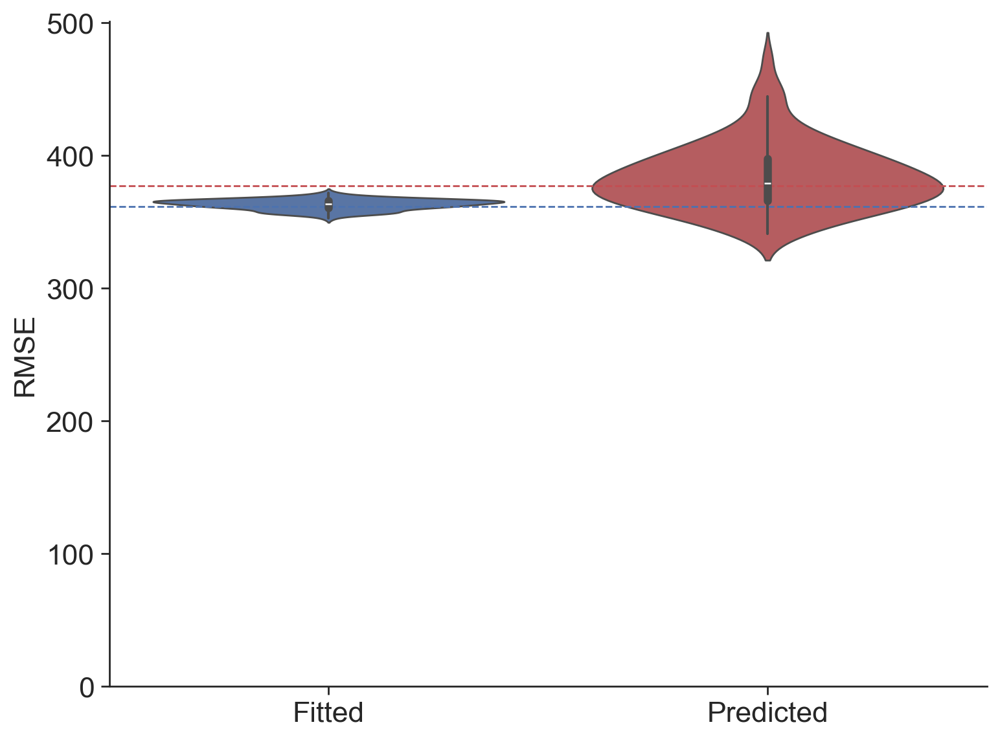

In [7]:
parsDEX1RAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapa 500 Dex 1_result.xlsx', sheet_name=f'pars_Rapa 500 Dex 1', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX1RAPA500.copy() 
bootDEX1RAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapa 500 Dex 1_result.xlsx', sheet_name=f'boot_Rapa 500 Dex 1', index_col=0)
fittedBoot = bootDEX1RAPA500.copy()

icnd = 9
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA500, bootRAPA500, parsDEX1, bootDEX1)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX1RAPA500)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV23_007/DEX 1 + RAPA 500"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 1 + Rapa 1580

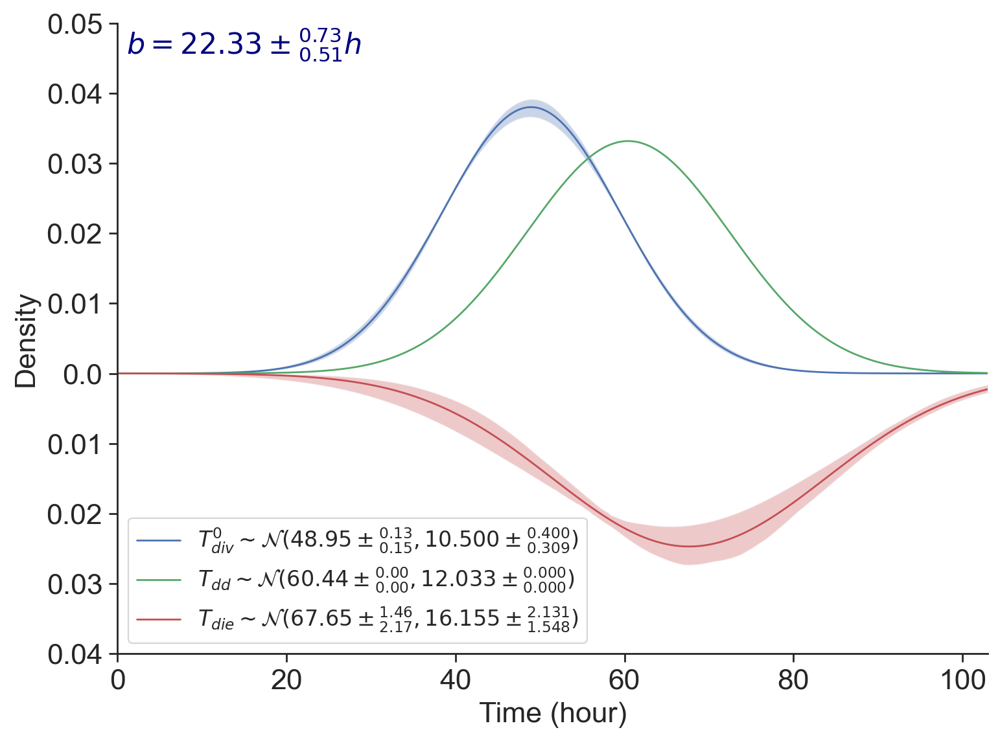

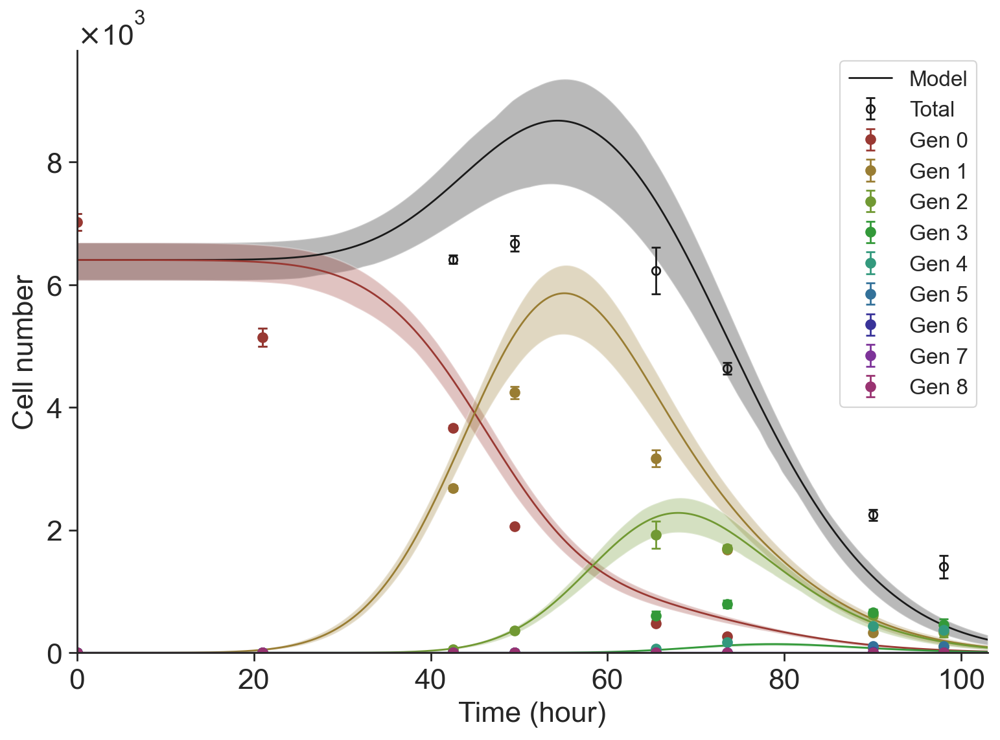

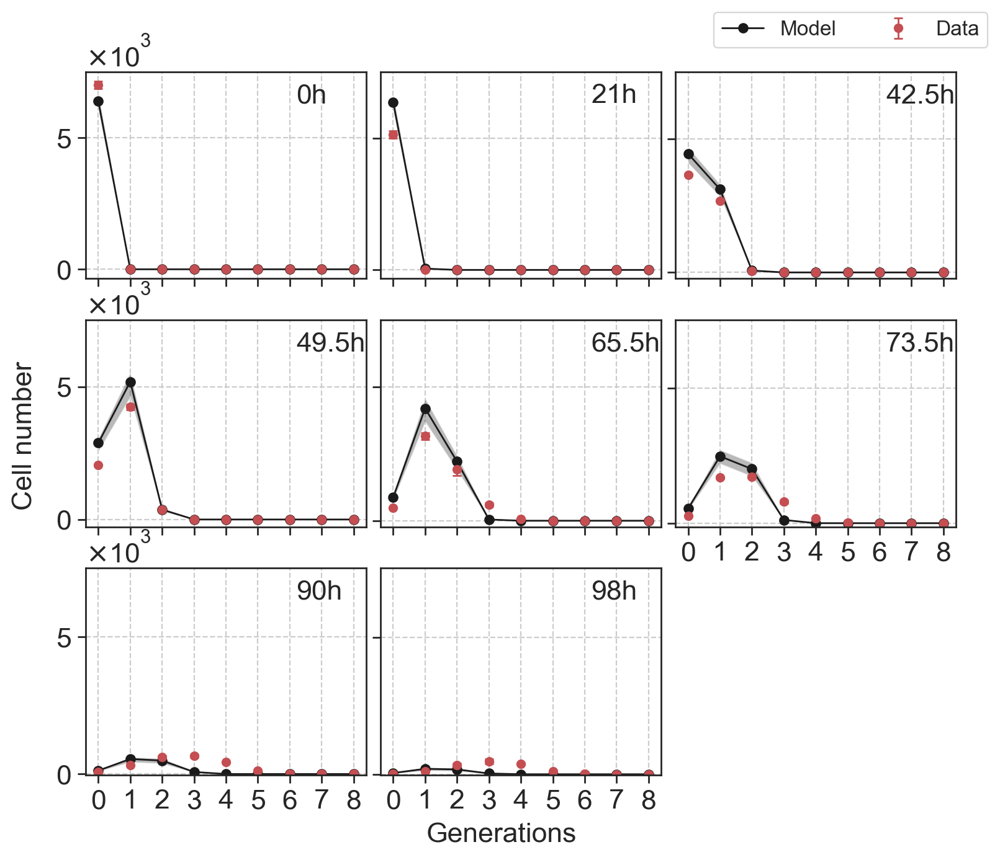

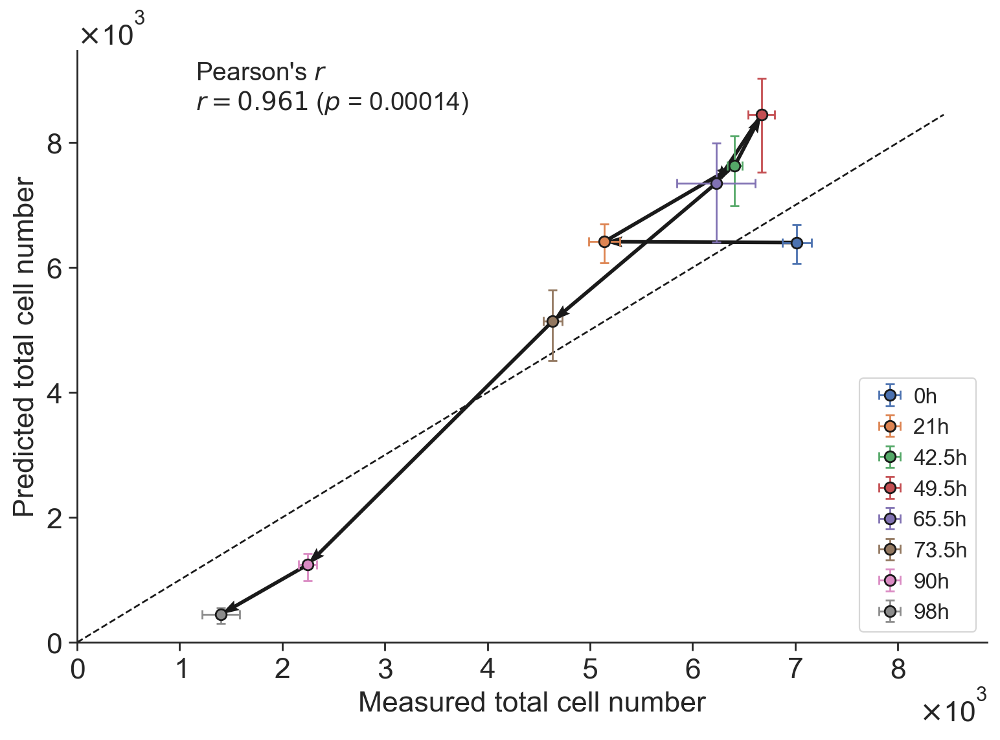

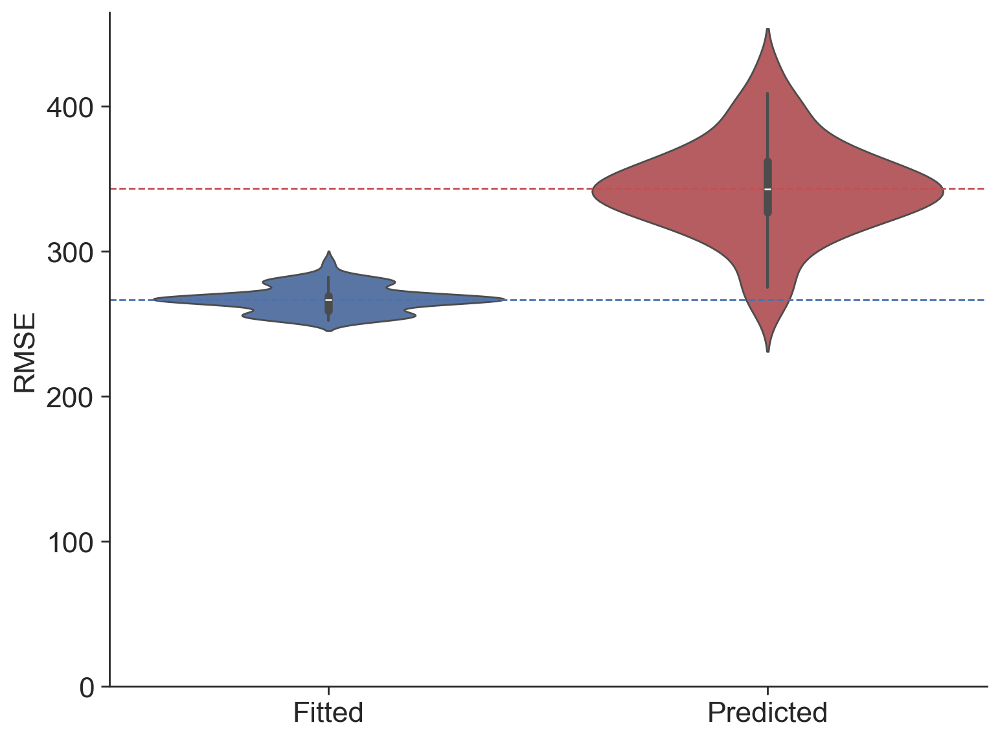

In [8]:
parsDEX1RAPA1580 = pd.read_excel(f'{fitpath}/{key}_Rapa 1580 Dex 1_result.xlsx', sheet_name=f'pars_Rapa 1580 Dex 1', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX1RAPA1580.copy() 
bootDEX1RAPA1580 = pd.read_excel(f'{fitpath}/{key}_Rapa 1580 Dex 1_result.xlsx', sheet_name=f'boot_Rapa 1580 Dex 1', index_col=0)
fittedBoot = bootDEX1RAPA1580.copy()

icnd = 13
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA1580, bootRAPA1580, parsDEX1, bootDEX1)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX1RAPA1580)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV23_007/DEX 1 + RAPA 1580"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 3.16 + Rapa 158

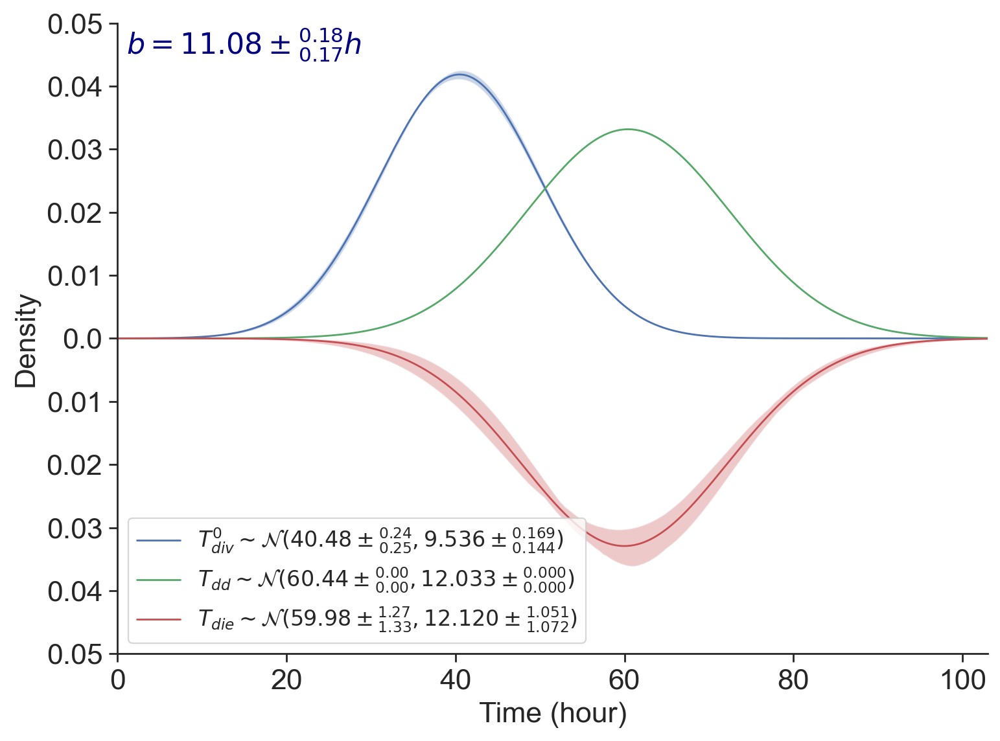

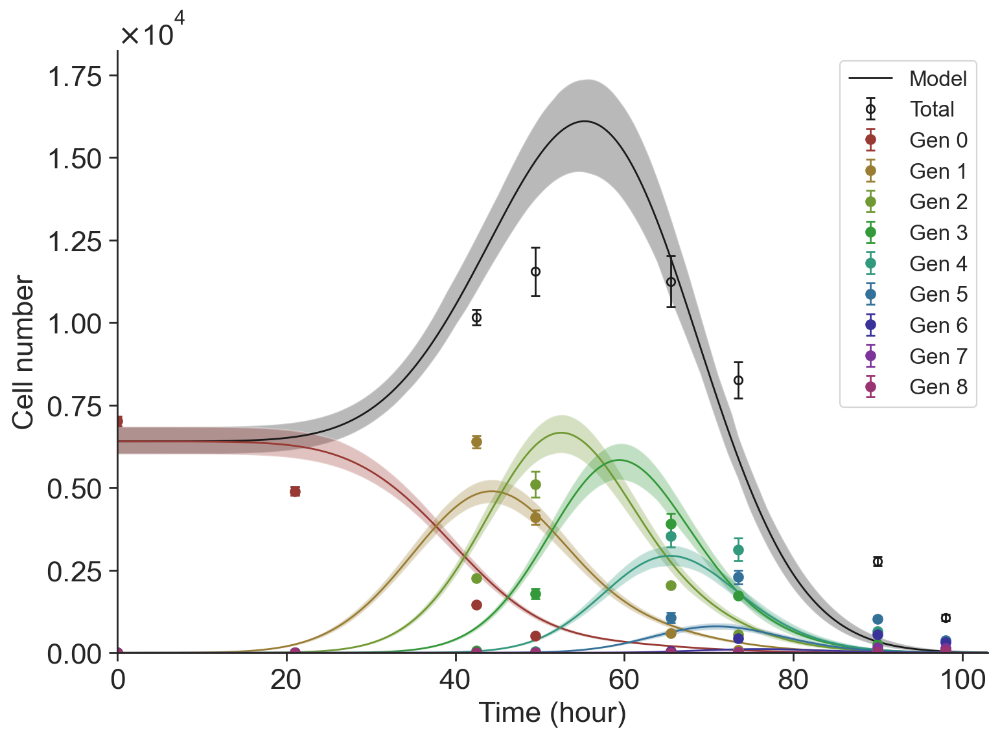

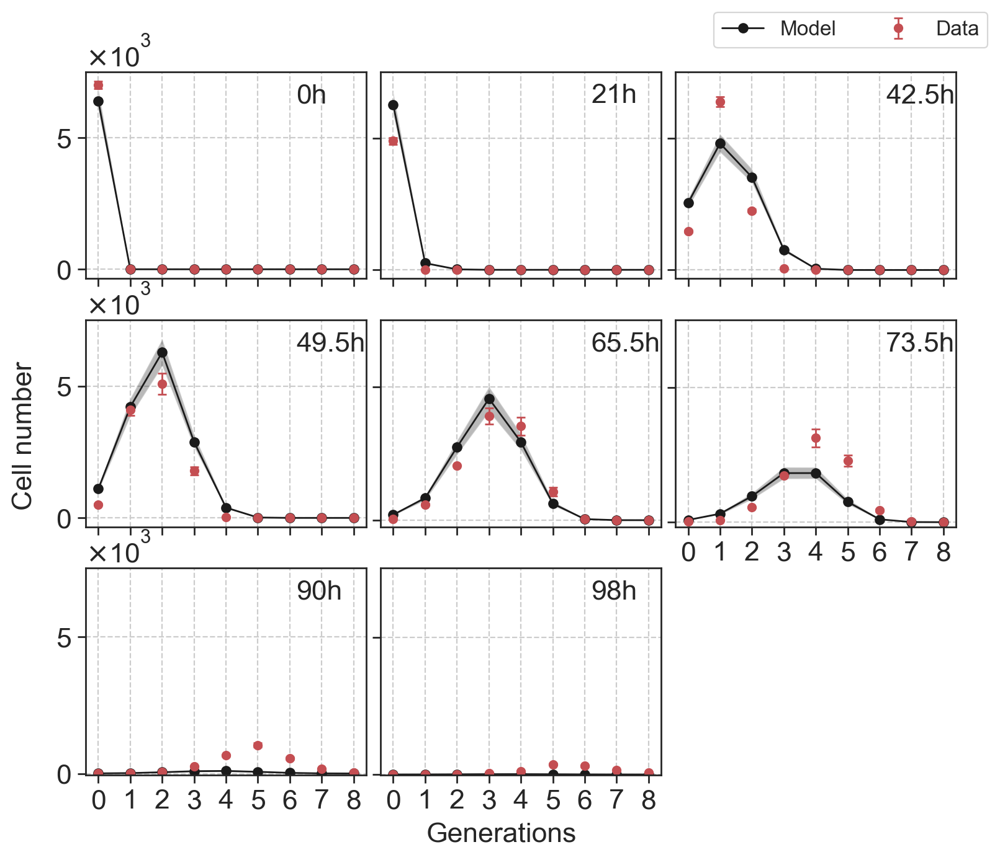

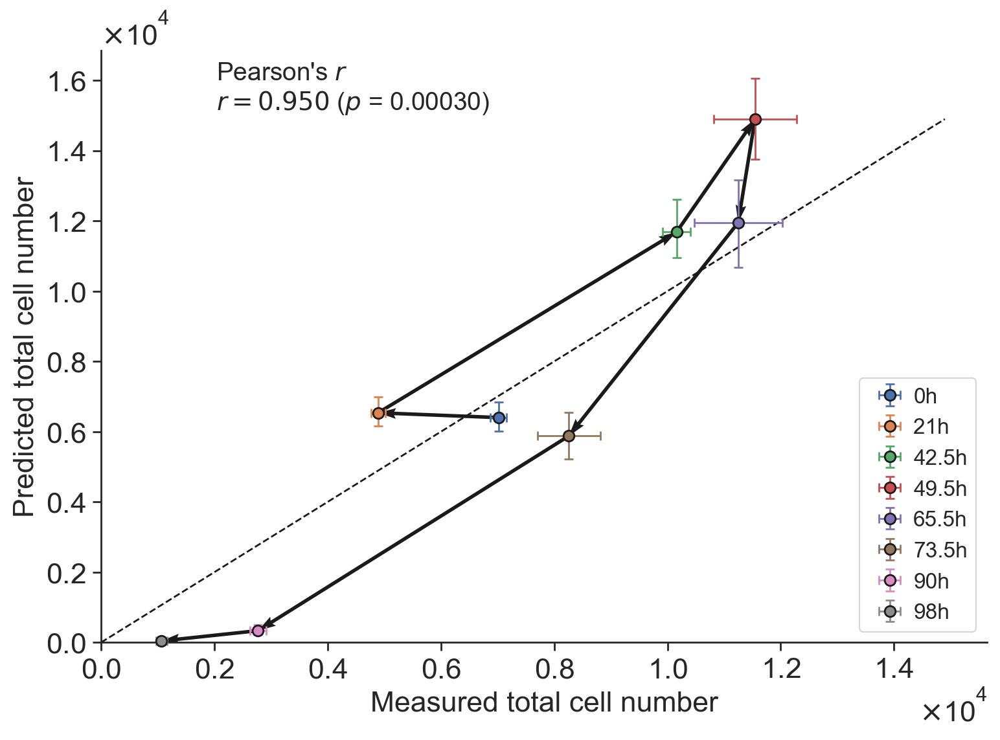

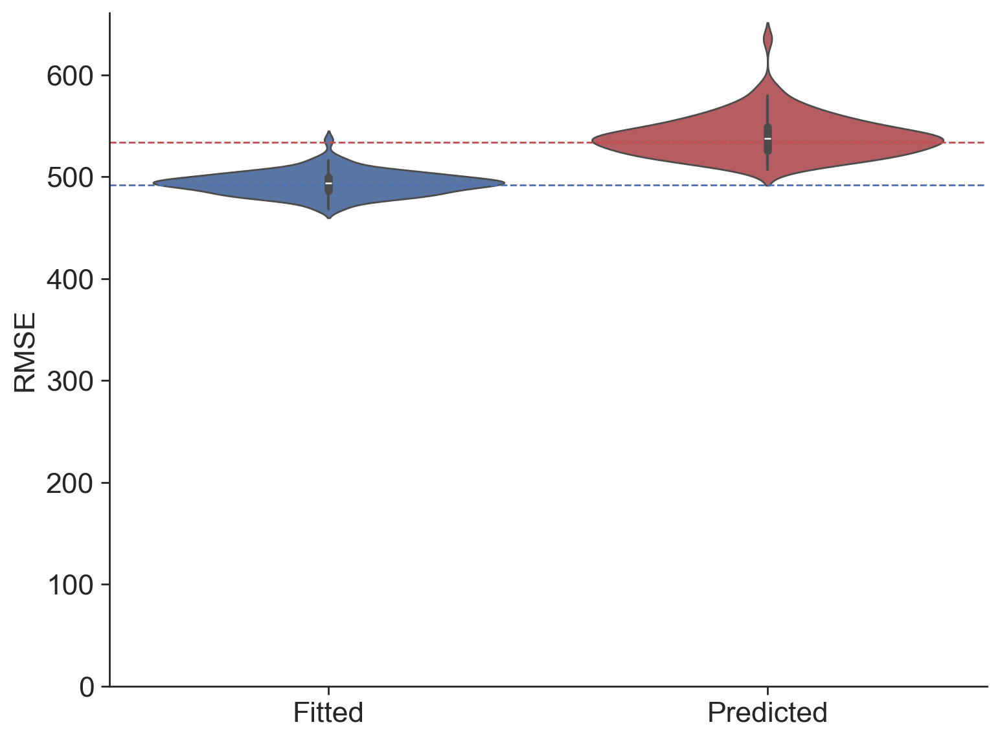

In [9]:
parsDEX3_16RAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapa 158 Dex 3.16_result.xlsx', sheet_name=f'pars_Rapa 158 Dex 3.16', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX3_16RAPA158.copy() 
bootDEX3_16RAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapa 158 Dex 3.16_result.xlsx', sheet_name=f'boot_Rapa 158 Dex 3.16', index_col=0)
fittedBoot = bootDEX3_16RAPA158.copy()

icnd = 6
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA158, bootRAPA158, parsDEX3_16, bootDEX3_16)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX3_16RAPA158)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV23_007/DEX 3.16 + RAPA 158"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 3.16 + Rapa 500

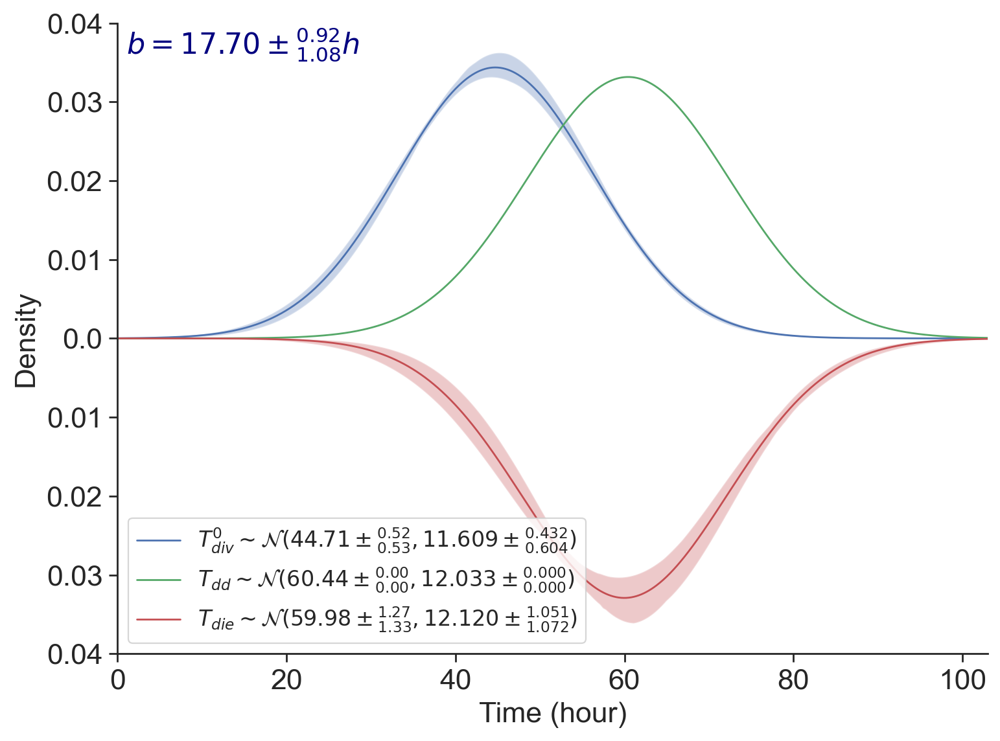

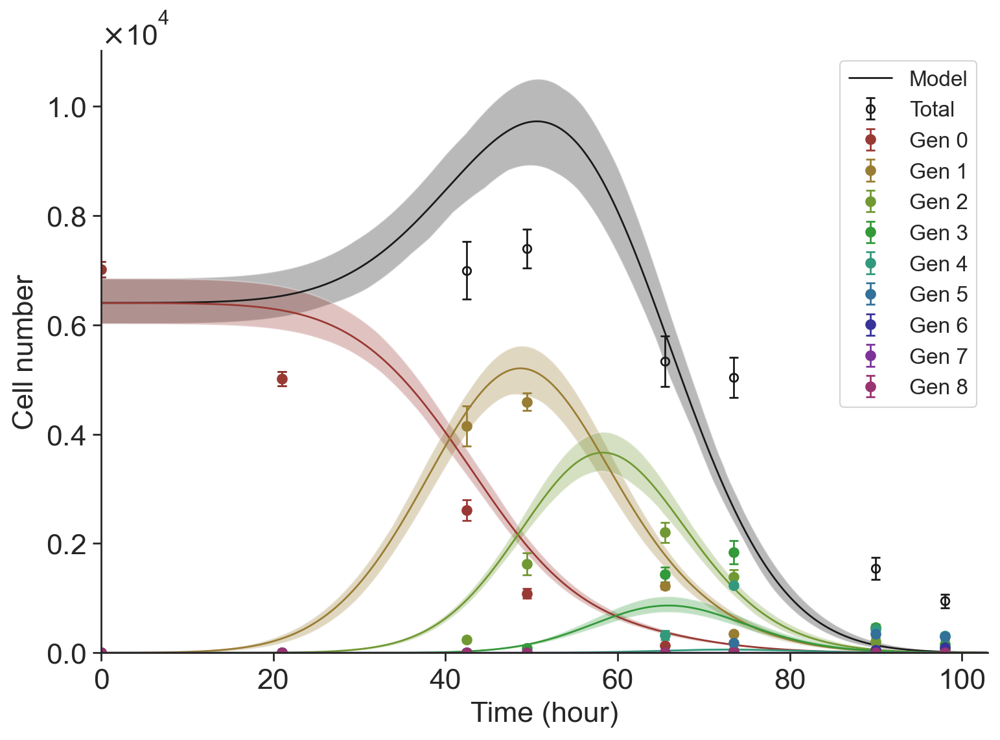

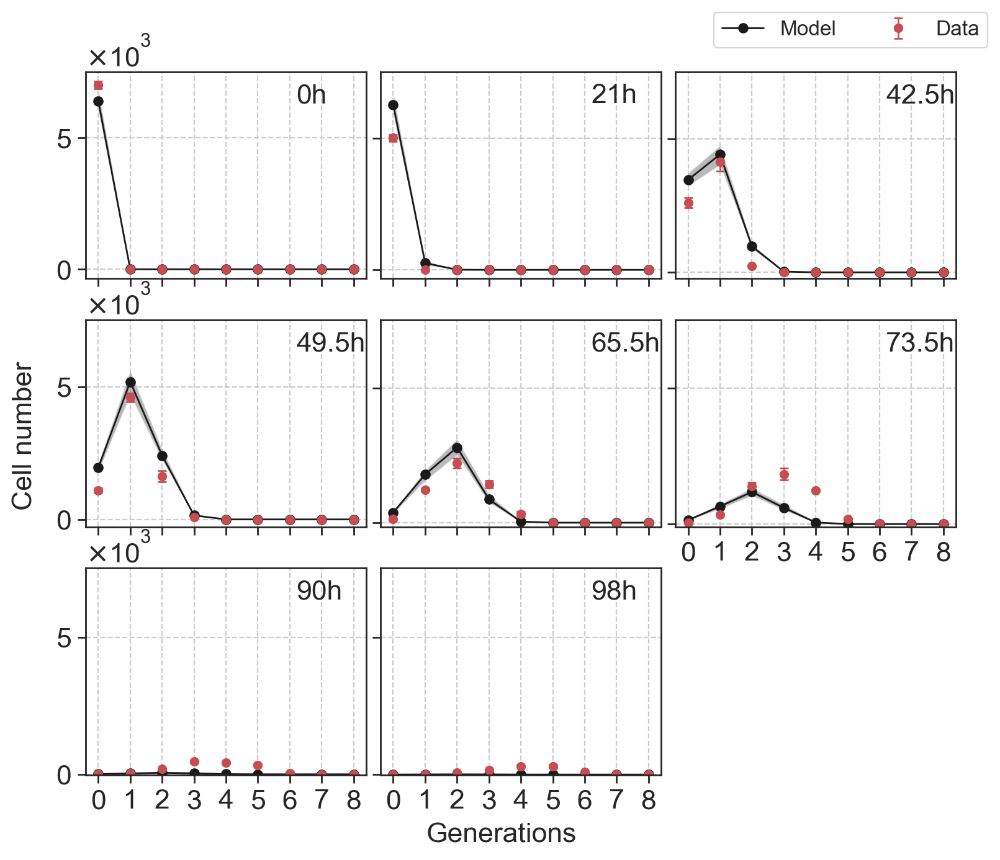

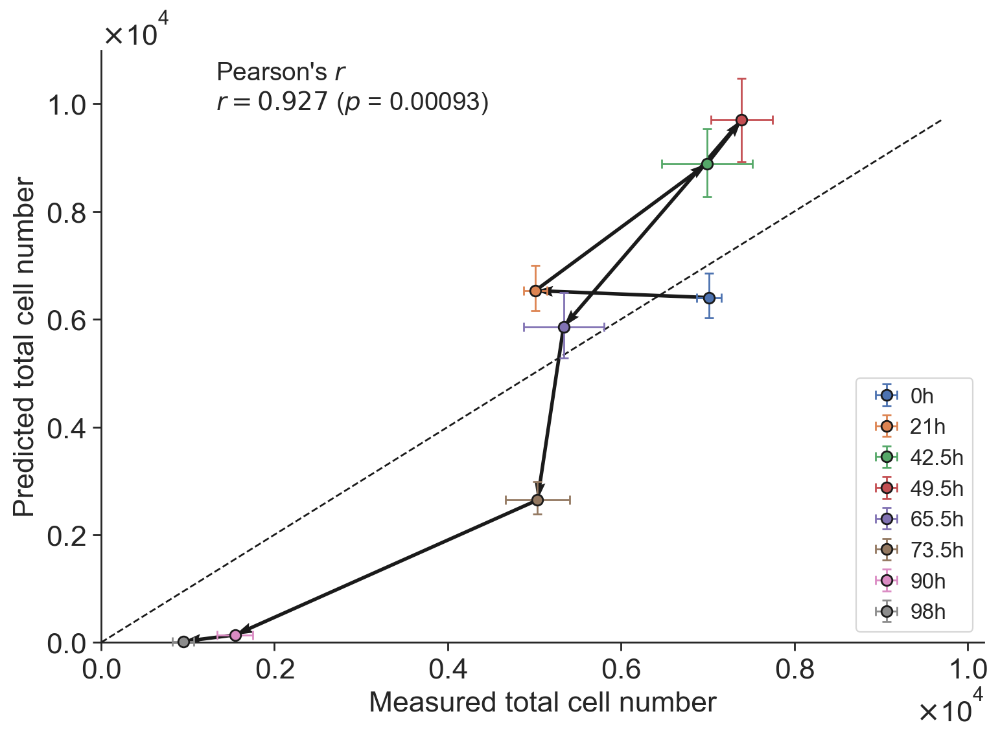

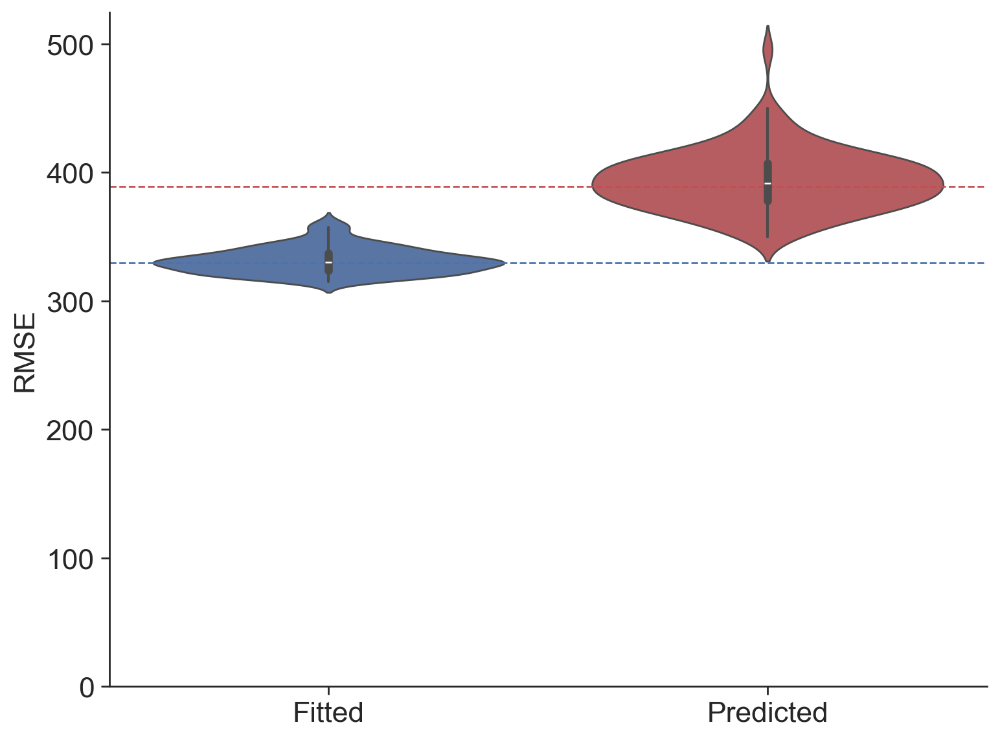

In [10]:
parsDEX3_16RAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapa 500 Dex 3.16_result.xlsx', sheet_name=f'pars_Rapa 500 Dex 3.16', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX3_16RAPA500.copy() 
bootDEX3_16RAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapa 500 Dex 3.16_result.xlsx', sheet_name=f'boot_Rapa 500 Dex 3.16', index_col=0)
fittedBoot = bootDEX3_16RAPA500.copy()

icnd = 10
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA500, bootRAPA500, parsDEX3_16, bootDEX3_16)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX3_16RAPA500)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV23_007/DEX 3.16 + RAPA 500"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 3.16 + Rapa 1580

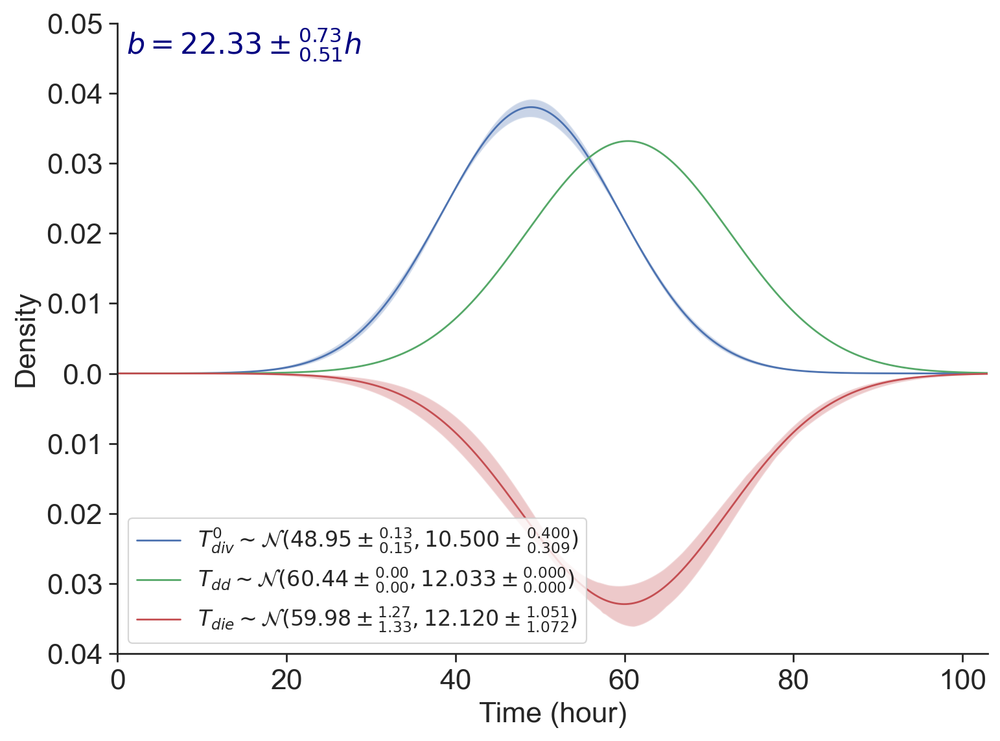

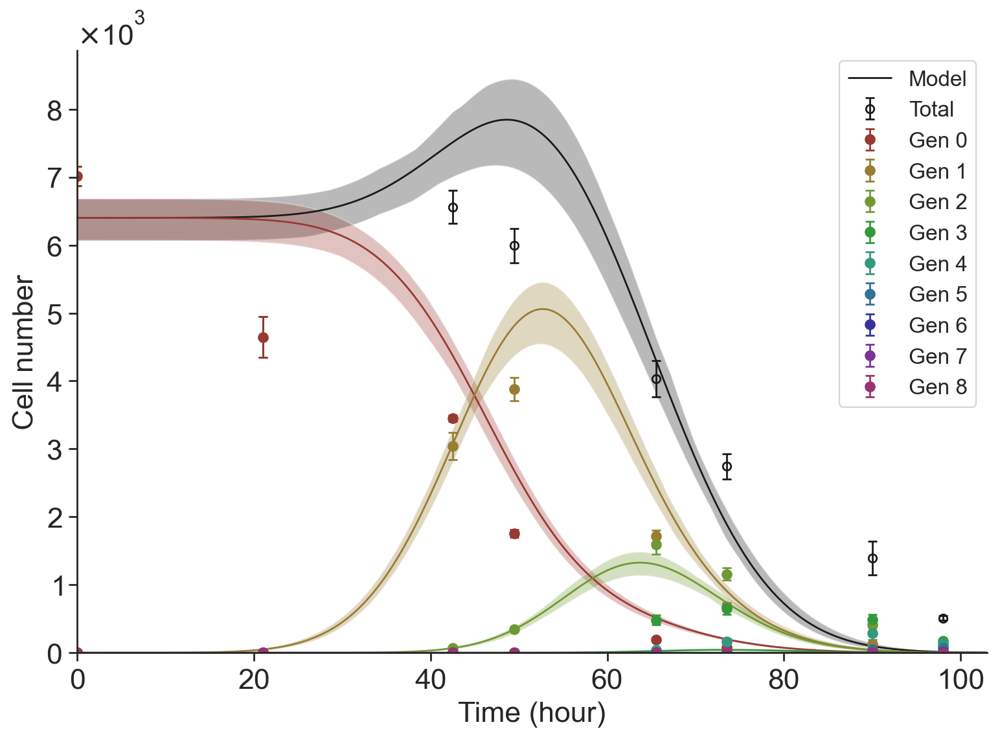

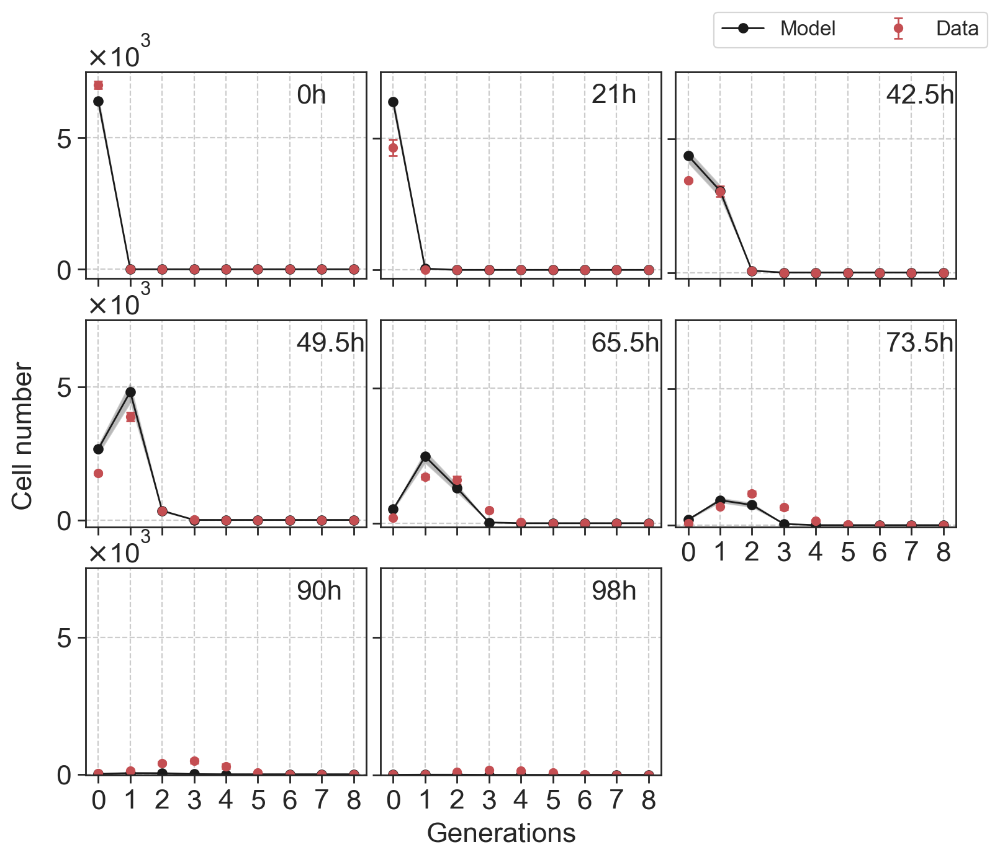

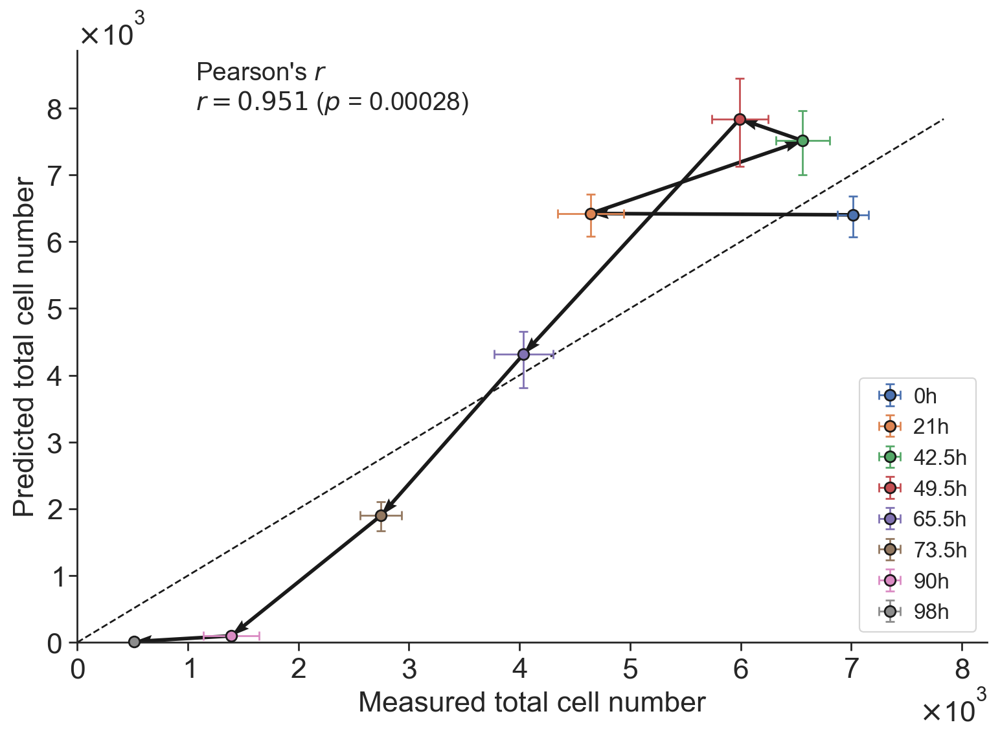

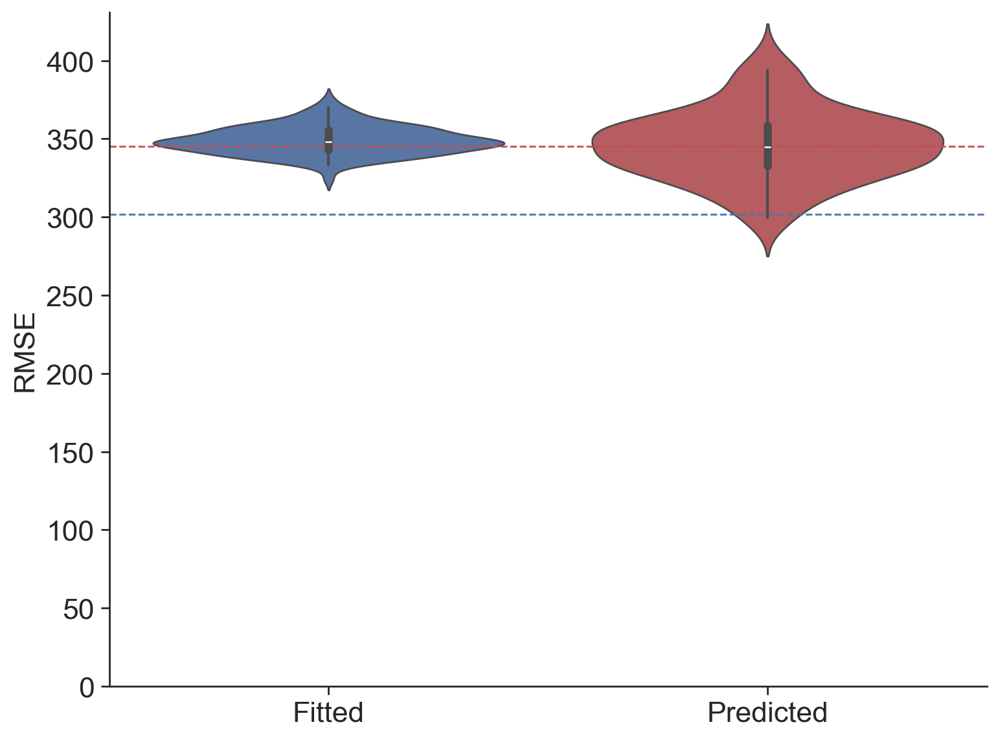

In [11]:
parsDEX3_16RAPA1580 = pd.read_excel(f'{fitpath}/{key}_Rapa 1580 Dex 3.16_result.xlsx', sheet_name=f'pars_Rapa 1580 Dex 3.16', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX3_16RAPA1580.copy() 
bootDEX3_16RAPA1580 = pd.read_excel(f'{fitpath}/{key}_Rapa 1580 Dex 3.16_result.xlsx', sheet_name=f'boot_Rapa 1580 Dex 3.16', index_col=0)
fittedBoot = bootDEX1RAPA1580.copy()

icnd = 14
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA1580, bootRAPA1580, parsDEX3_16, bootDEX3_16)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX3_16RAPA1580)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV23_007/DEX 3.16 + RAPA 1580"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 10 + Rapa 158

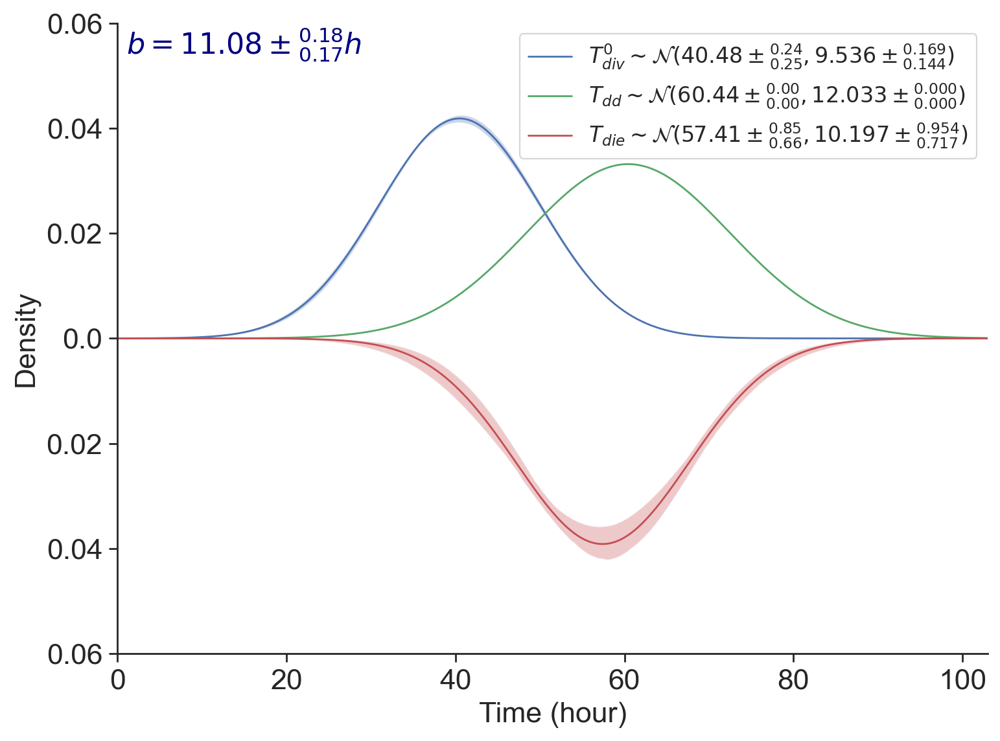

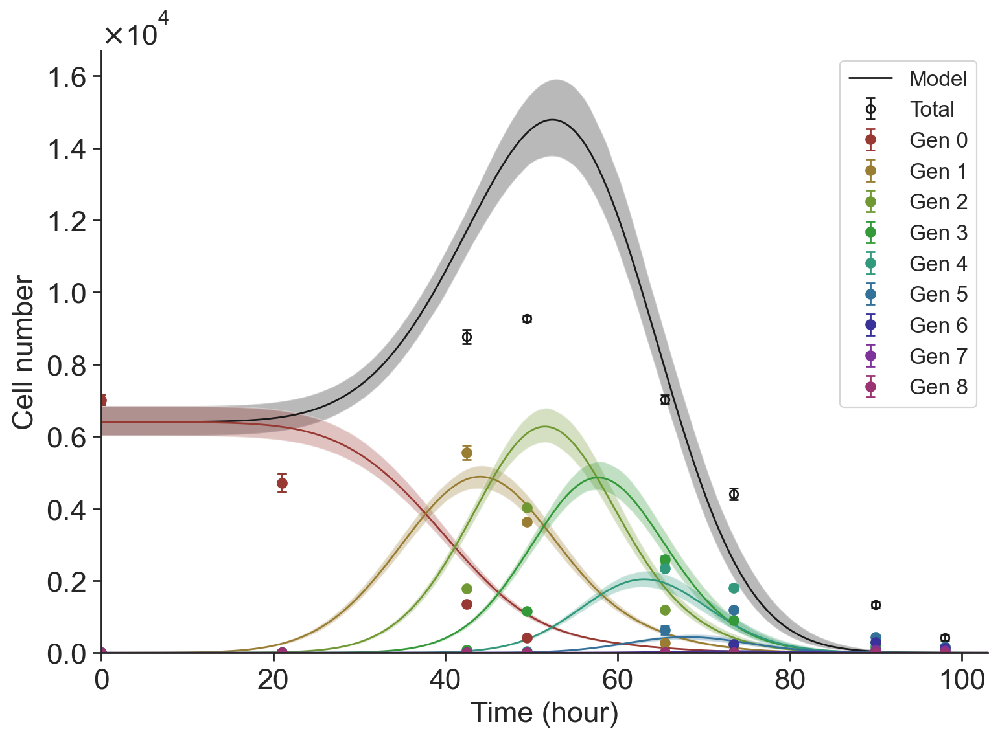

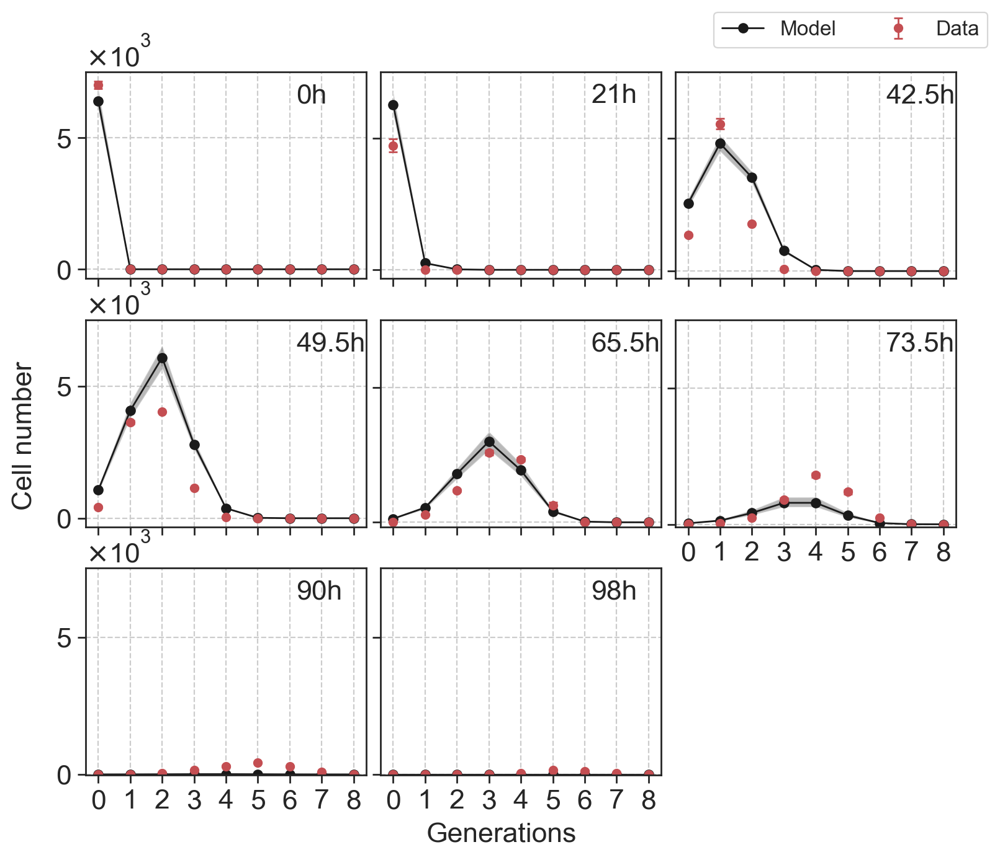

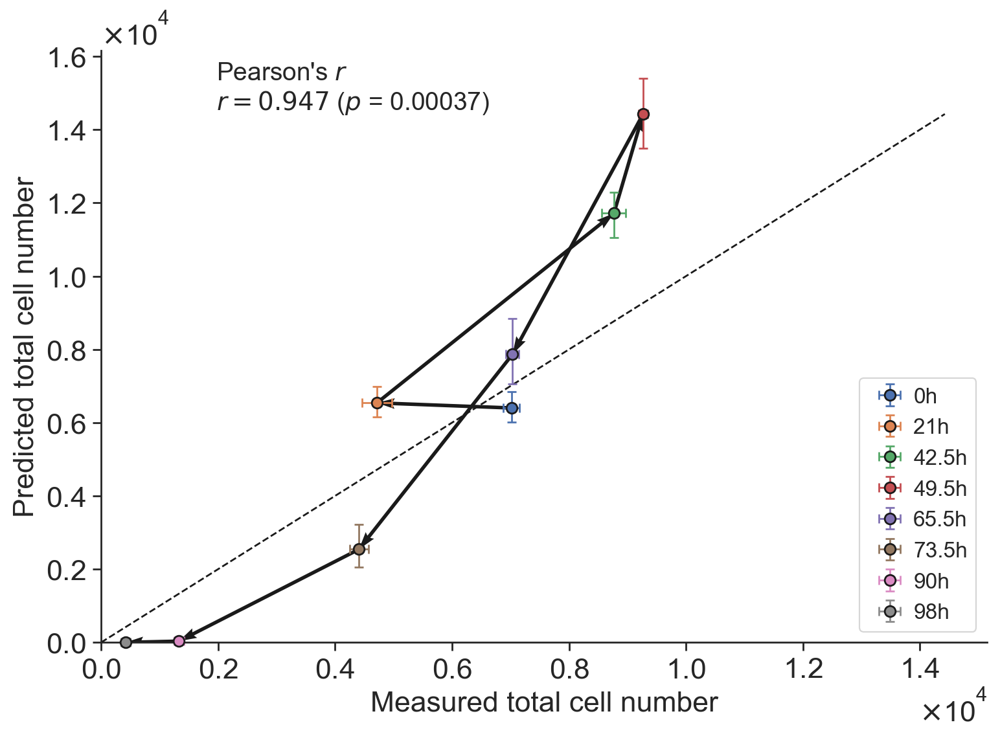

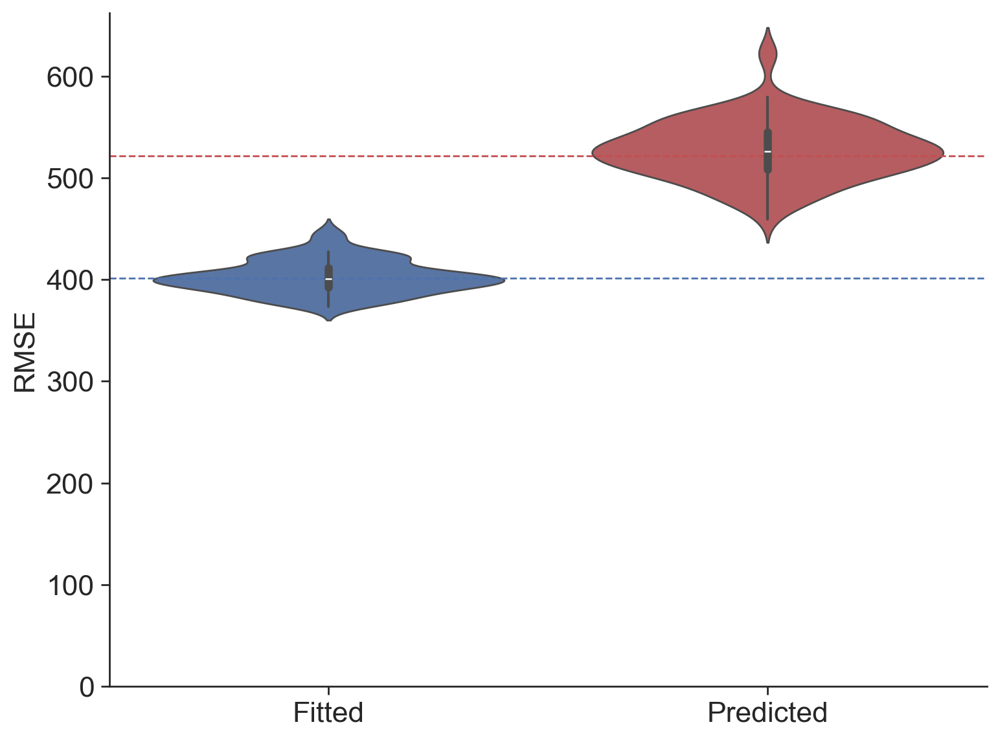

In [12]:
parsDEX10RAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapa 158 Dex 10_result.xlsx', sheet_name=f'pars_Rapa 158 Dex 10', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX10RAPA158.copy() 
bootDEX10RAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapa 158 Dex 10_result.xlsx', sheet_name=f'boot_Rapa 158 Dex 10', index_col=0)
fittedBoot = bootDEX10RAPA158.copy()

icnd = 7
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA158, bootRAPA158, parsDEX10, bootDEX10)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX10RAPA158)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV23_007/DEX 10 + RAPA 158"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 10 + Rapa 500

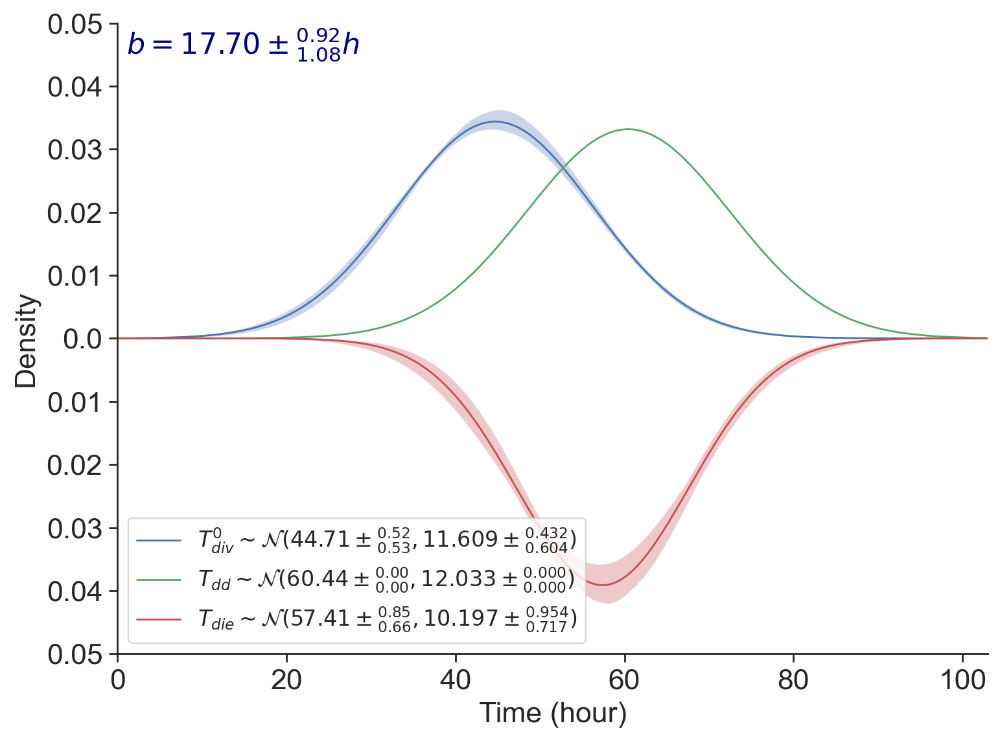

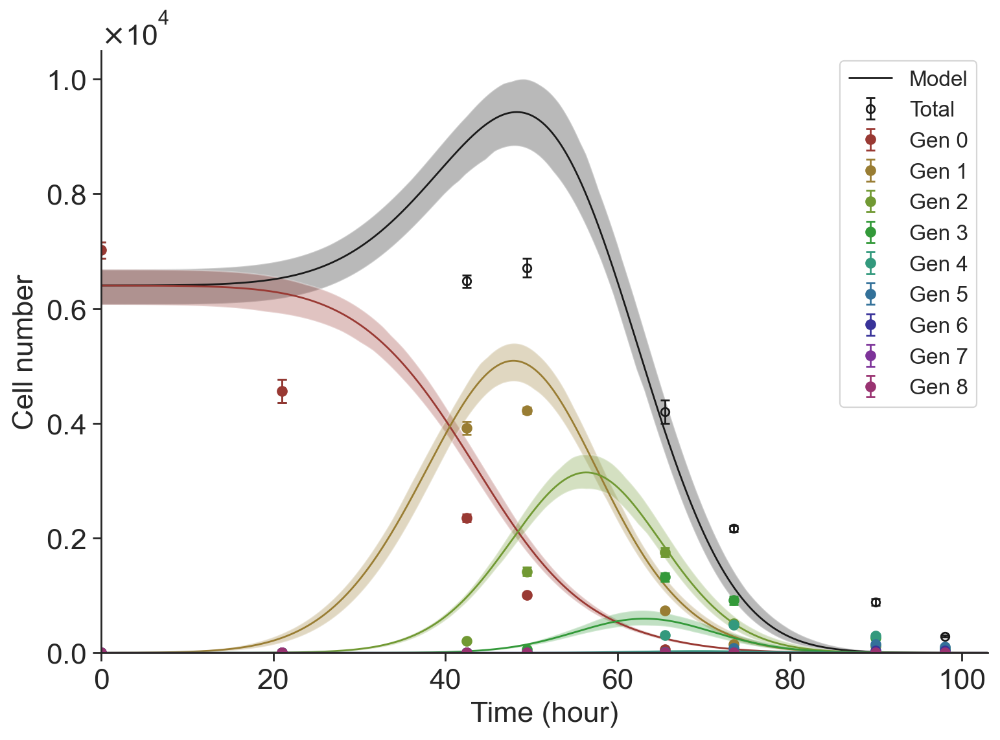

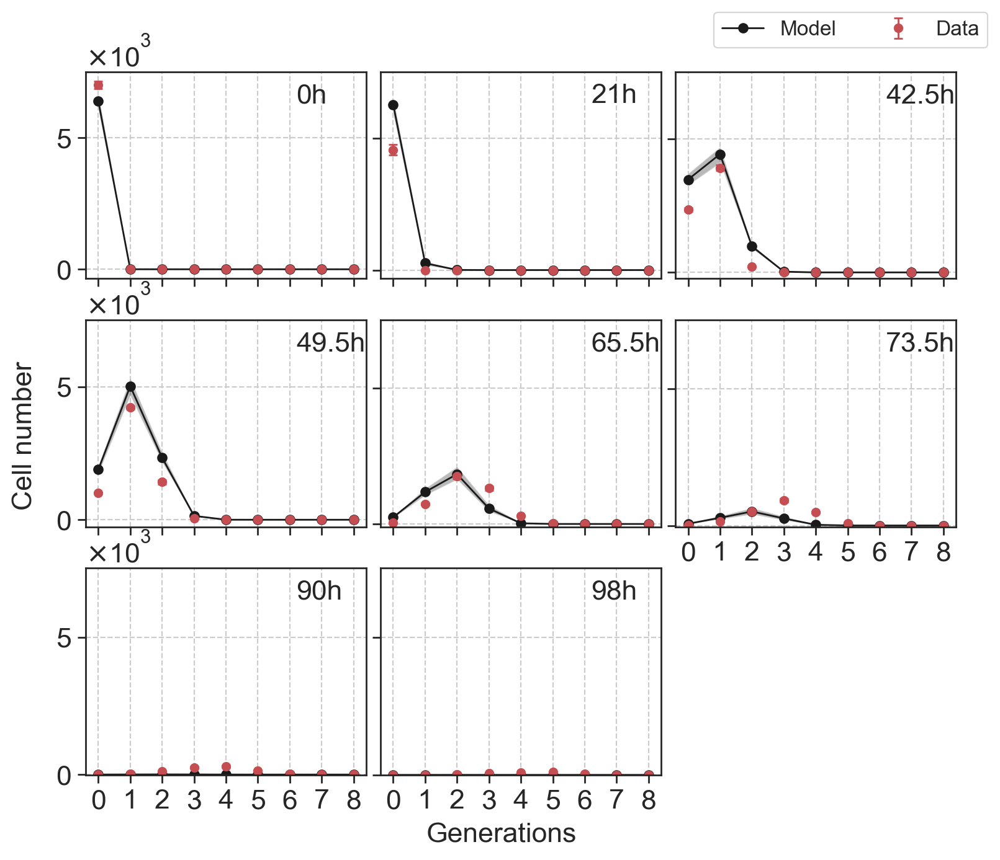

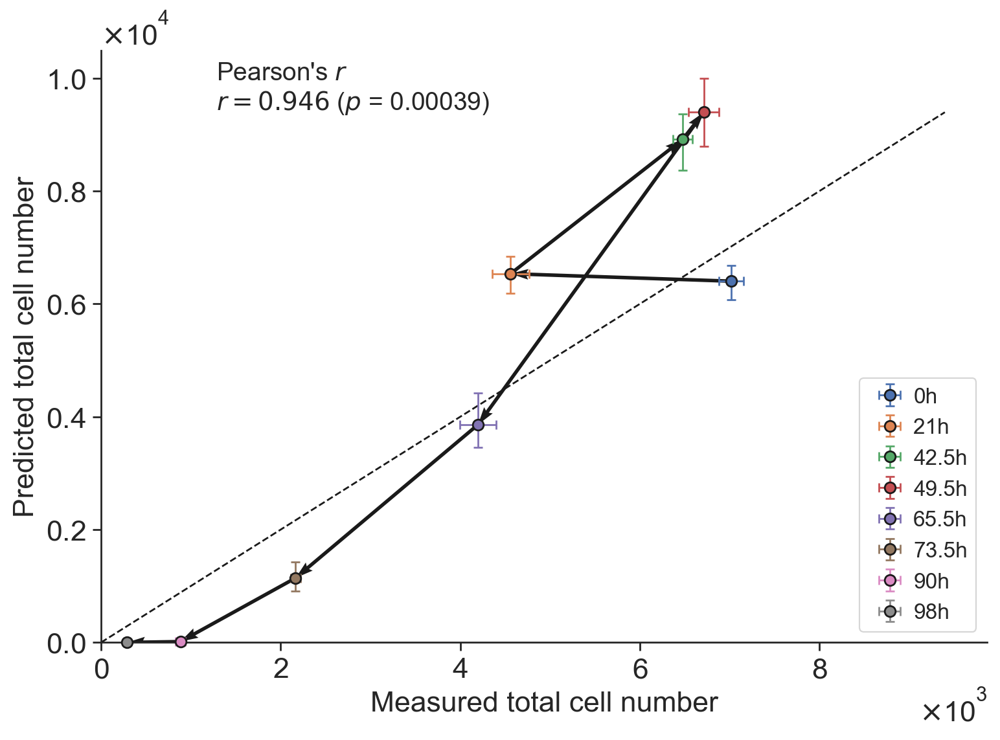

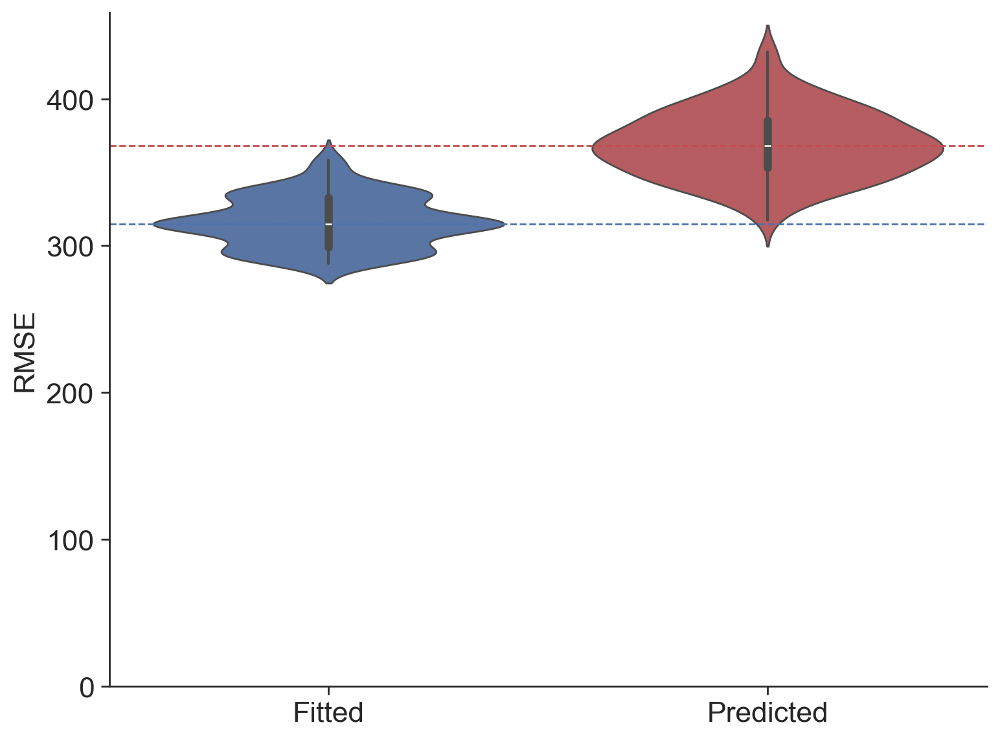

In [13]:
parsDEX10RAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapa 500 Dex 10_result.xlsx', sheet_name=f'pars_Rapa 500 Dex 10', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX10RAPA500.copy() 
bootDEX10RAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapa 500 Dex 10_result.xlsx', sheet_name=f'boot_Rapa 500 Dex 10', index_col=0)
fittedBoot = bootDEX10RAPA500.copy()

icnd = 11
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA500, bootRAPA500, parsDEX10, bootDEX10)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX10RAPA500)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV23_007/DEX 10 + RAPA 500"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 10 + Rapa 1580

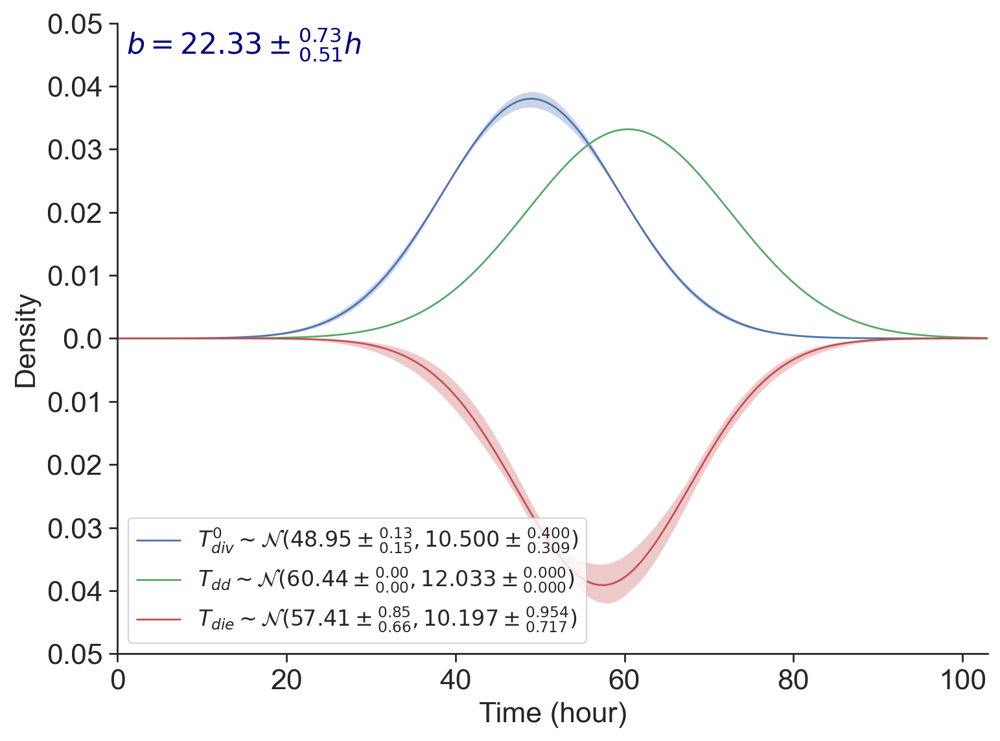

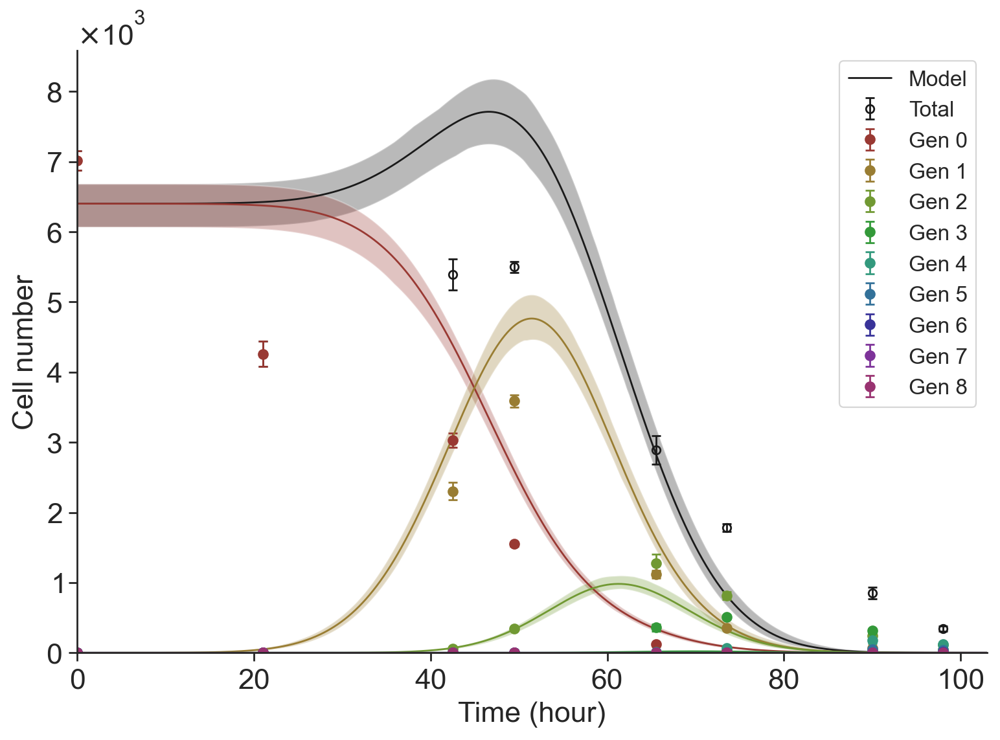

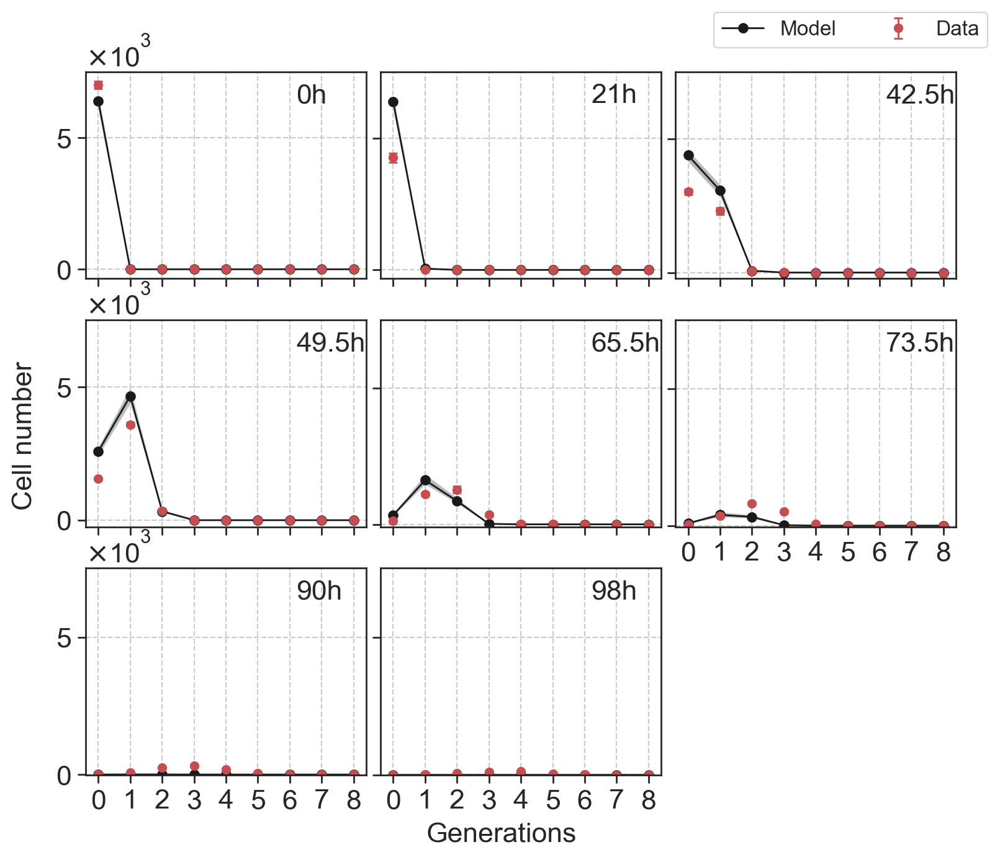

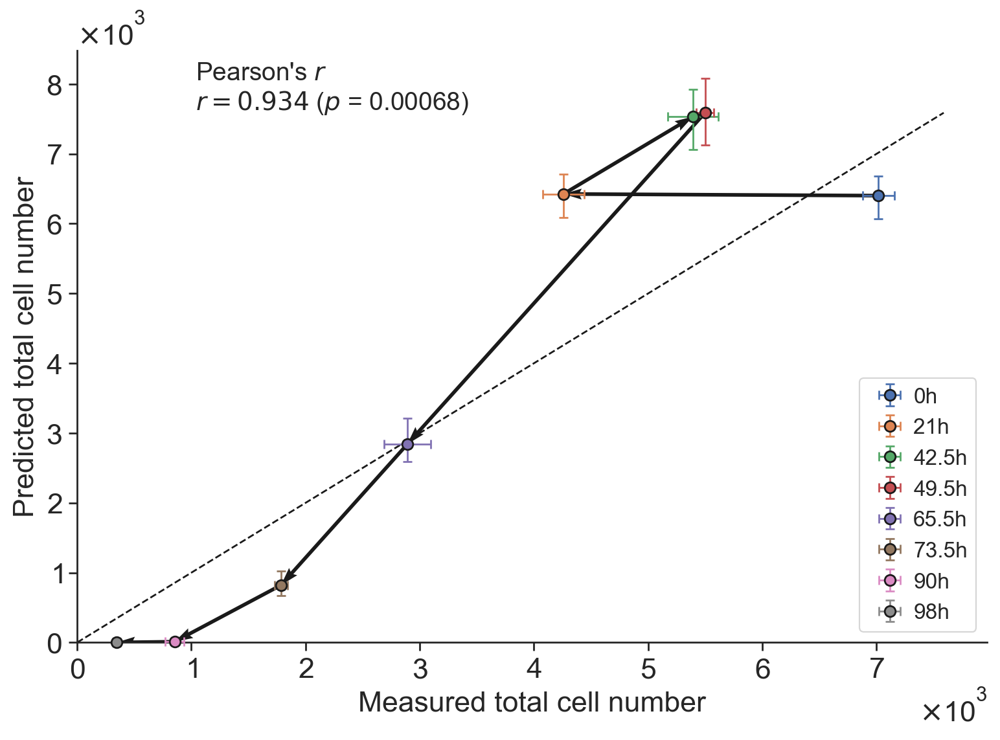

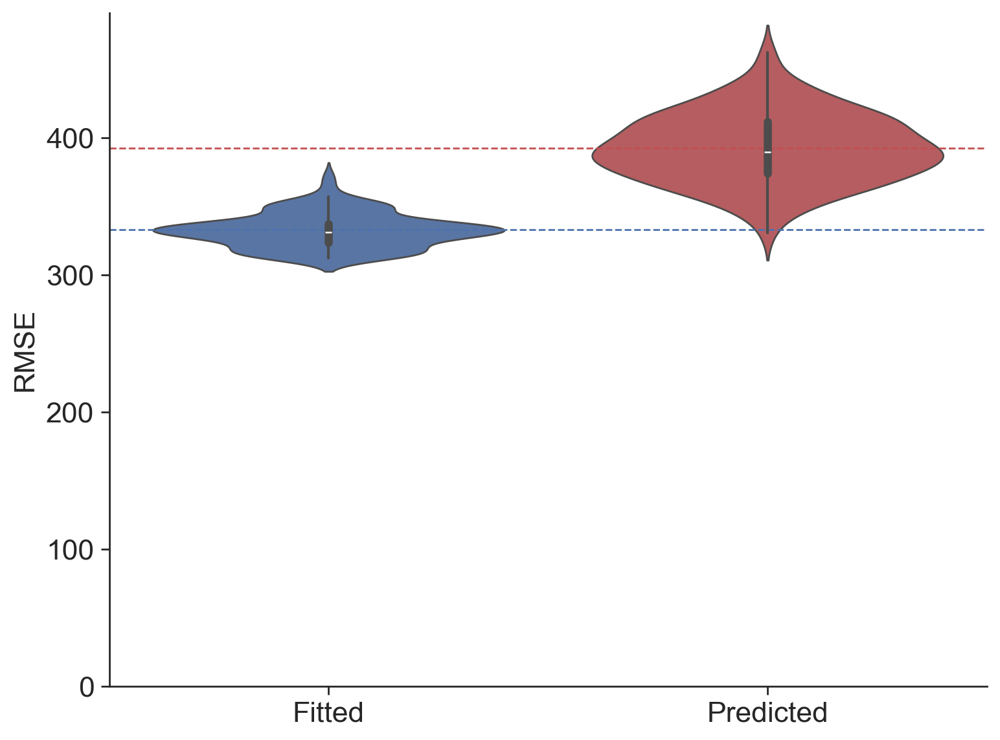

In [14]:
parsDEX10RAPA1580 = pd.read_excel(f'{fitpath}/{key}_Rapa 1580 Dex 10_result.xlsx', sheet_name=f'pars_Rapa 1580 Dex 10', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX10RAPA1580.copy() 
bootDEX10RAPA1580 = pd.read_excel(f'{fitpath}/{key}_Rapa 1580 Dex 10_result.xlsx', sheet_name=f'boot_Rapa 1580 Dex 10', index_col=0)
fittedBoot = bootDEX10RAPA1580.copy()

icnd = 15
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA1580, bootRAPA1580, parsDEX10, bootDEX10)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX10RAPA1580)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV23_007/DEX 10 + RAPA 1580"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

# [DV24_001] Dex + MPA (OTI, BimKO)

In [15]:
dfDEX_MPA = parse_data('./data', ['Fig 2-3 DV24_001 Dex MPA OTI BimKO.xlsx'])['Fig 2-3 DV24_001 Dex MPA OTI BimKO']
dfDEX_MPA['reader'].condition_names

['No drug',
 'DEX 1ngmL',
 'DEX 3.16ngmL',
 'DEX 10ngmL',
 'MPA 50ngmL',
 'MPA 50ngmL DEX 1ngmL',
 'MPA 50ngmL DEX 3.16ngmL',
 'MPA 50ngmL DEX 10ngmL',
 'MPA 100ngmL',
 'MPA 100ngmL DEX 1ngmL',
 'MPA 100ngmL DEX 3.16ngmL',
 'MPA 100ngmL DEX 10ngmL',
 'US']

In [16]:
# Extract and define key variables
key = 'Fig 2-3 DV24_001 Dex MPA OTI BimKO'
fitpath = './out/Best-fit Parameters/2. Different Timers/DV24_001 Dex + MPA (Fixed Tdd)'

# Import No drug parameters
parsCTRL = pd.read_excel(f'{fitpath}/{key}_No drug_result.xlsx', sheet_name=f'pars_No drug', index_col=0)['best-fit'].to_dict()
bootCTRL = pd.read_excel(f'{fitpath}/{key}_No drug_result.xlsx', sheet_name=f'boot_No drug', index_col=0)

# Import Dex titrations
parsDEX1 = pd.read_excel(f'{fitpath}/{key}_DEX 1ngmL_result.xlsx', sheet_name=f'pars_DEX 1ngmL', index_col=0)['best-fit'].to_dict()
bootDEX1 = pd.read_excel(f'{fitpath}/{key}_DEX 1ngmL_result.xlsx', sheet_name=f'boot_DEX 1ngmL', index_col=0)

parsDEX3_16 = pd.read_excel(f'{fitpath}/{key}_DEX 3.16ngmL_result.xlsx', sheet_name=f'pars_DEX 3.16ngmL', index_col=0)['best-fit'].to_dict()
bootDEX3_16 = pd.read_excel(f'{fitpath}/{key}_DEX 3.16ngmL_result.xlsx', sheet_name=f'boot_DEX 3.16ngmL', index_col=0)

parsDEX10 = pd.read_excel(f'{fitpath}/{key}_DEX 10ngmL_result.xlsx', sheet_name=f'pars_DEX 10ngmL', index_col=0)['best-fit'].to_dict()
bootDEX10 = pd.read_excel(f'{fitpath}/{key}_DEX 10ngmL_result.xlsx', sheet_name=f'boot_DEX 10ngmL', index_col=0)

# Import MPA titrations
parsMPA50 = pd.read_excel(f'{fitpath}/{key}_MPA 50ngmL_result.xlsx', sheet_name=f'pars_MPA 50ngmL', index_col=0)['best-fit'].to_dict()
bootMPA50 = pd.read_excel(f'{fitpath}/{key}_MPA 50ngmL_result.xlsx', sheet_name=f'boot_MPA 50ngmL', index_col=0)

parsMPA100 = pd.read_excel(f'{fitpath}/{key}_MPA 100ngmL_result.xlsx', sheet_name=f'pars_MPA 100ngmL', index_col=0)['best-fit'].to_dict()
bootMPA100 = pd.read_excel(f'{fitpath}/{key}_MPA 100ngmL_result.xlsx', sheet_name=f'boot_MPA 100ngmL', index_col=0)

## Dex 1 + MPA 50

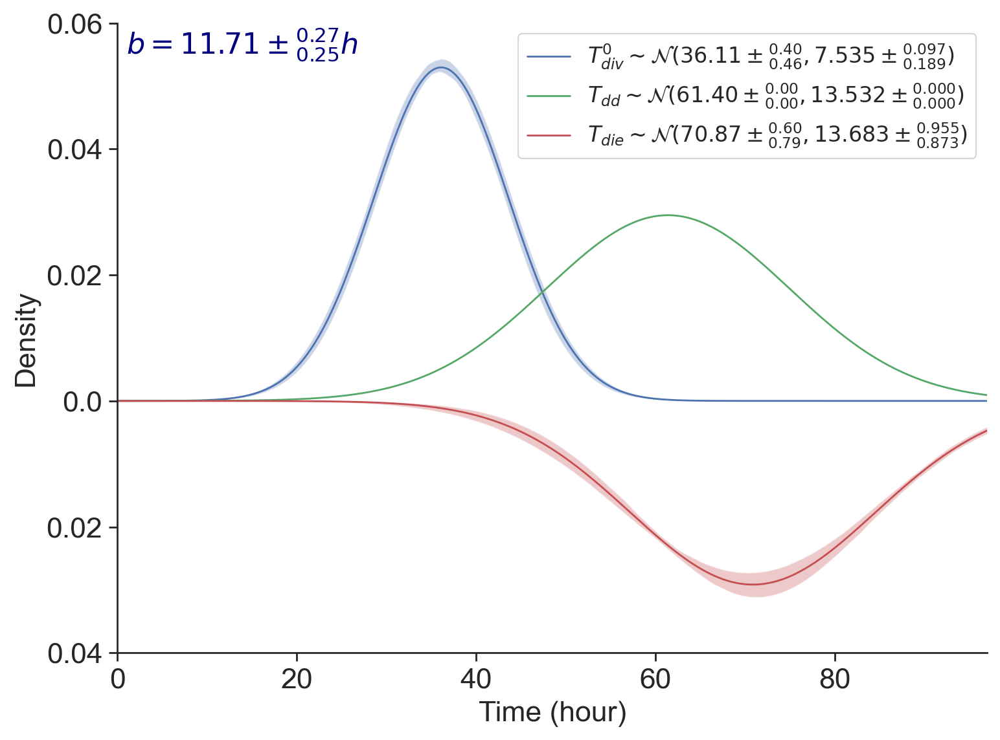

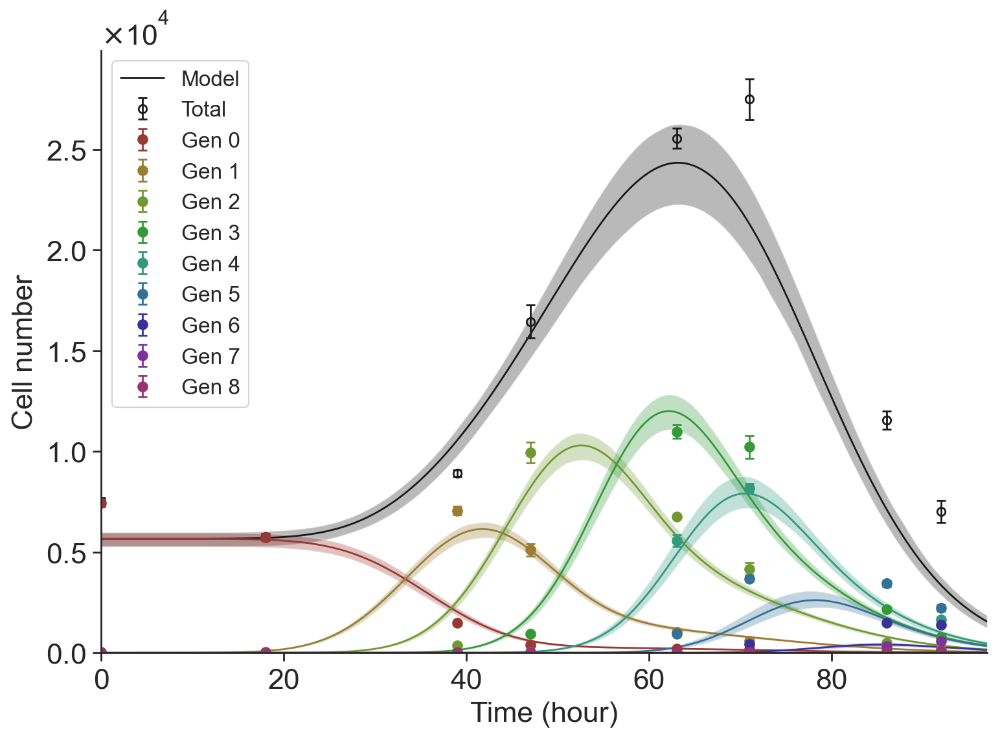

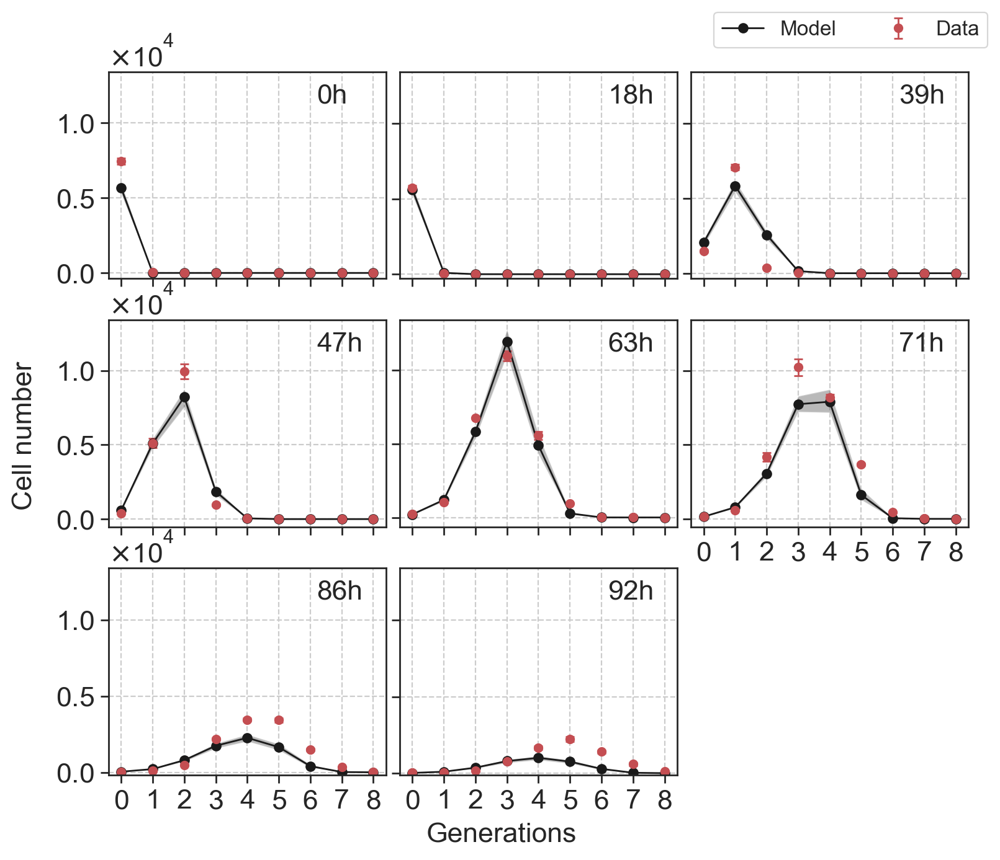

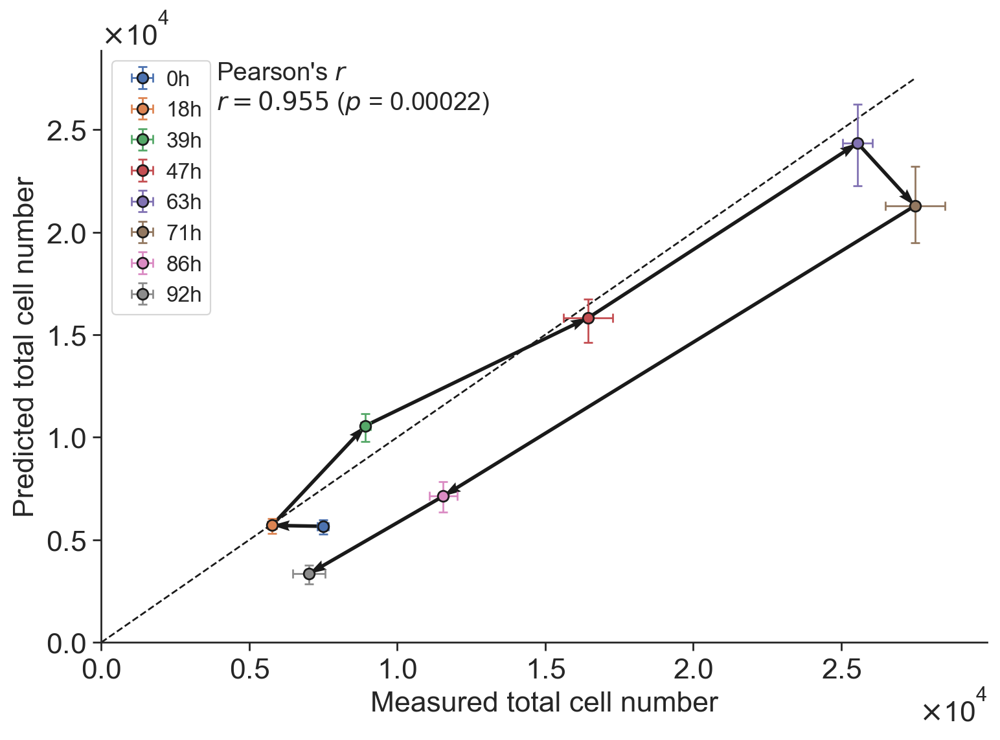

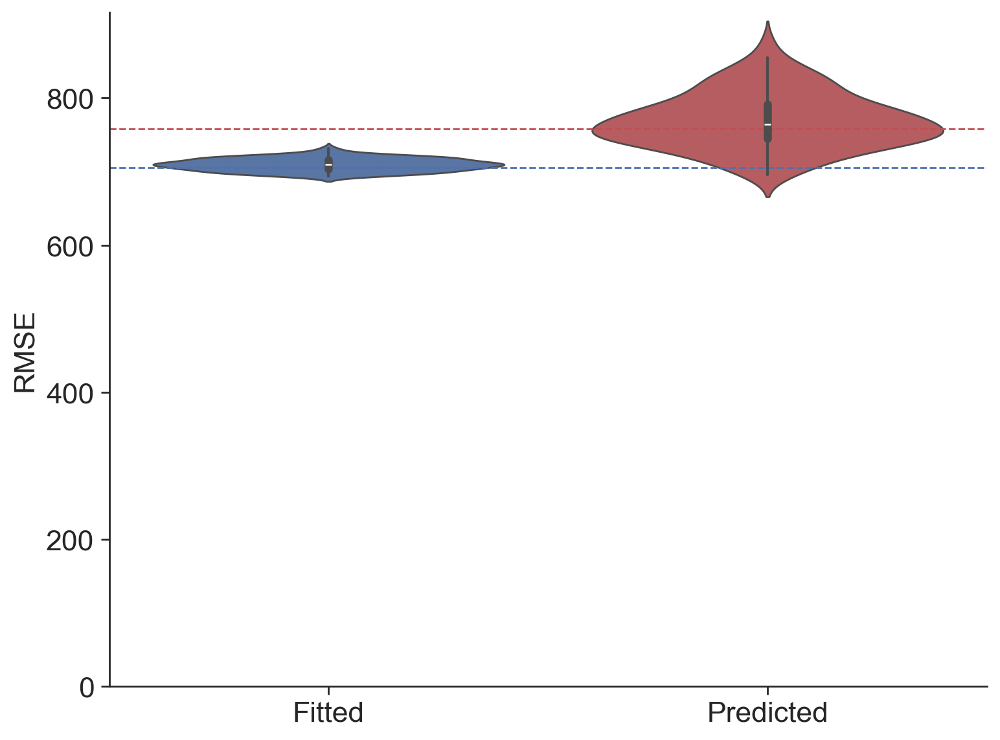

In [17]:
parsDEX1MPA50 = pd.read_excel(f'{fitpath}/{key}_MPA 50ngmL DEX 1ngmL_result.xlsx', sheet_name=f'pars_MPA 50ngmL DEX 1ngmL', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX1MPA50.copy() 
bootDEX1MPA50 = pd.read_excel(f'{fitpath}/{key}_MPA 50ngmL DEX 1ngmL_result.xlsx', sheet_name=f'boot_MPA 50ngmL DEX 1ngmL', index_col=0)
fittedBoot = bootDEX1MPA50.copy()

icnd = 5
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsMPA50, bootMPA50, parsDEX1, bootDEX1)
times, ext, curvesCI = predict(dfDEX_MPA, icnd, predPars, predBoot, bootDEX1MPA50)

path = "./out/Predictions/1. Different Timers/DEX + MPA/DV24_001/DEX 1 + MPA 50"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_MPA, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 1 + MPA 100

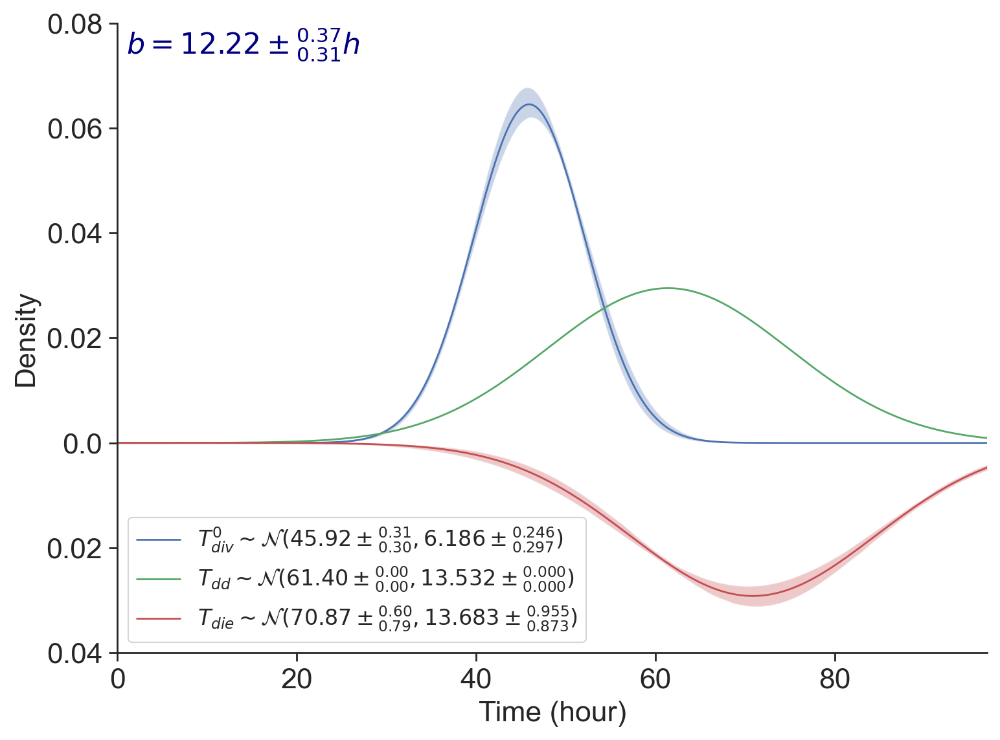

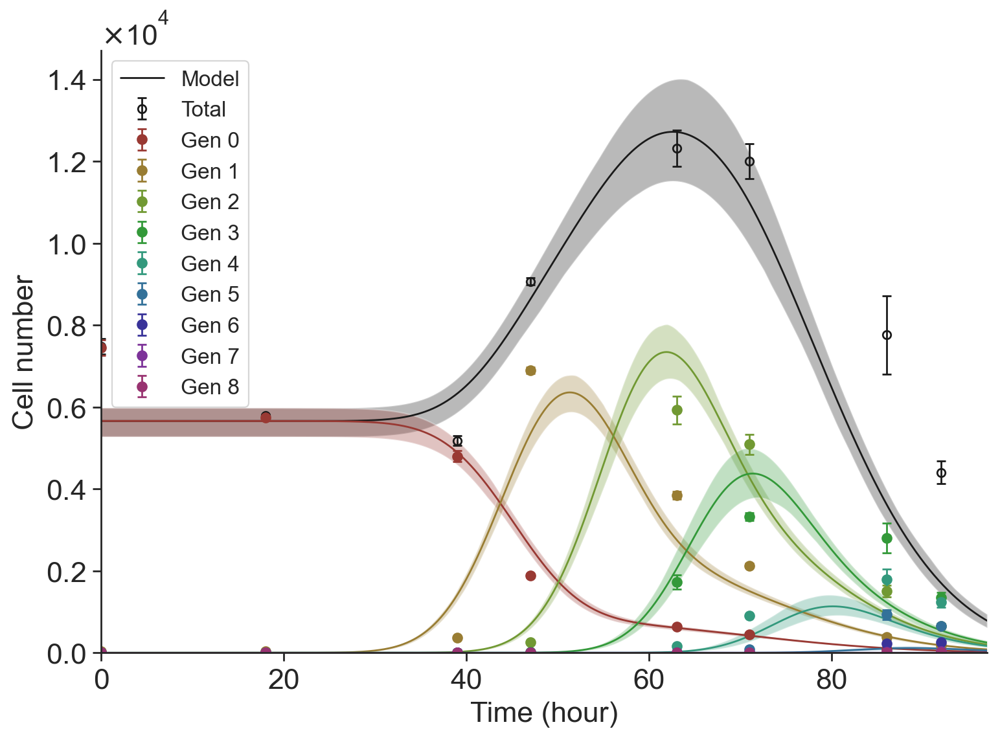

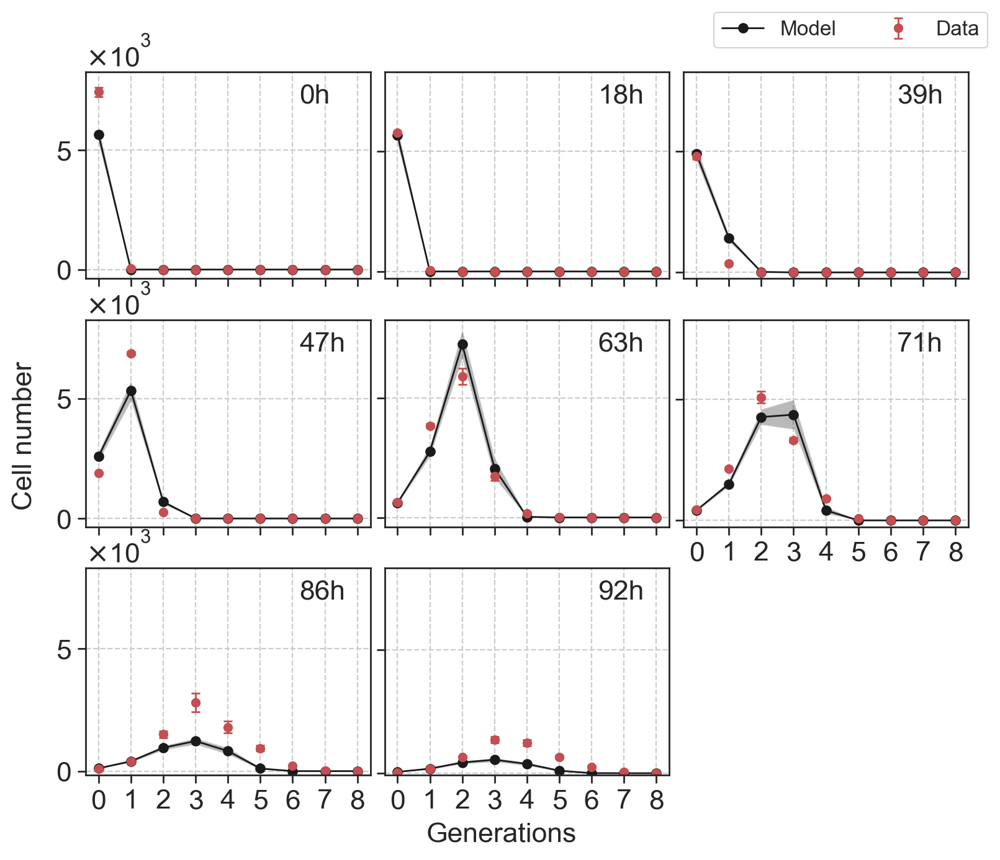

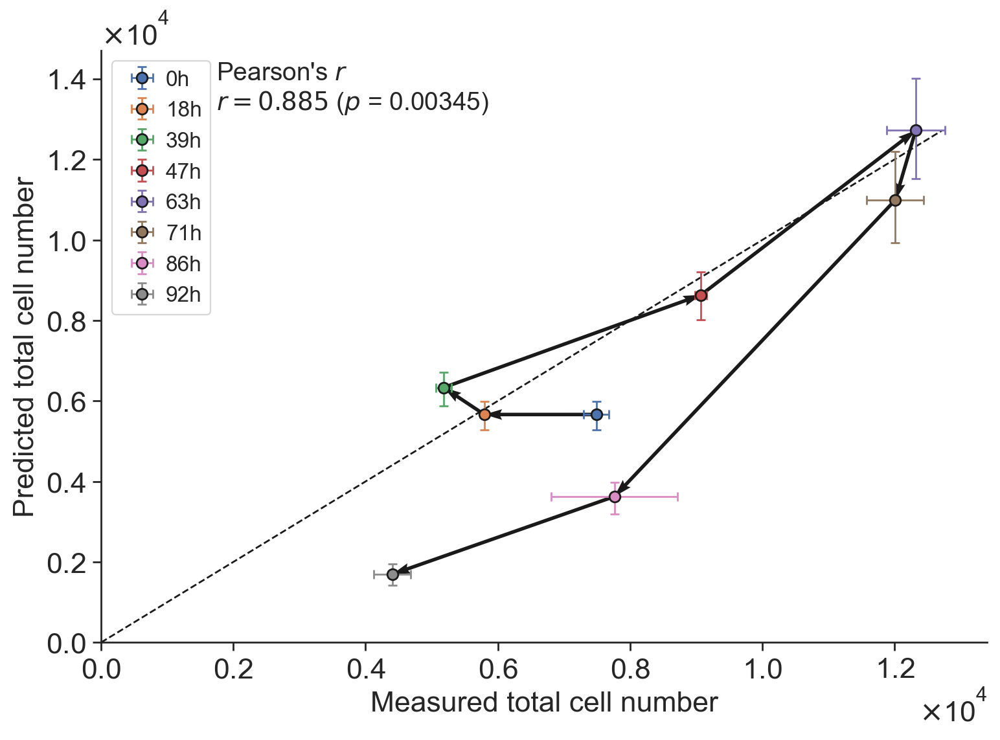

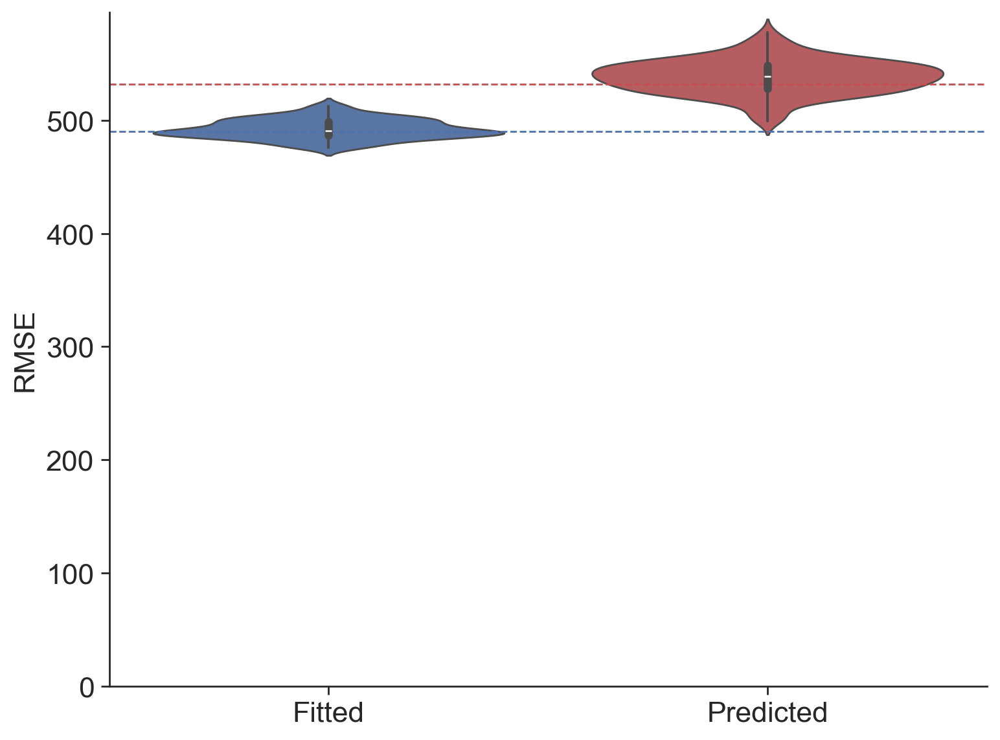

In [18]:
parsDEX1MPA100 = pd.read_excel(f'{fitpath}/{key}_MPA 100ngmL DEX 1ngmL_result.xlsx', sheet_name=f'pars_MPA 100ngmL DEX 1ngmL', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX1MPA100.copy() 
bootDEX1MPA100 = pd.read_excel(f'{fitpath}/{key}_MPA 100ngmL DEX 1ngmL_result.xlsx', sheet_name=f'boot_MPA 100ngmL DEX 1ngmL', index_col=0)
fittedBoot = bootDEX1MPA100.copy()

icnd = 9
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsMPA100, bootMPA100, parsDEX1, bootDEX1)
times, ext, curvesCI = predict(dfDEX_MPA, icnd, predPars, predBoot, bootDEX1MPA100)

path = "./out/Predictions/1. Different Timers/DEX + MPA/DV24_001/DEX 1 + MPA 100"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_MPA, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 3.16 + MPA 50

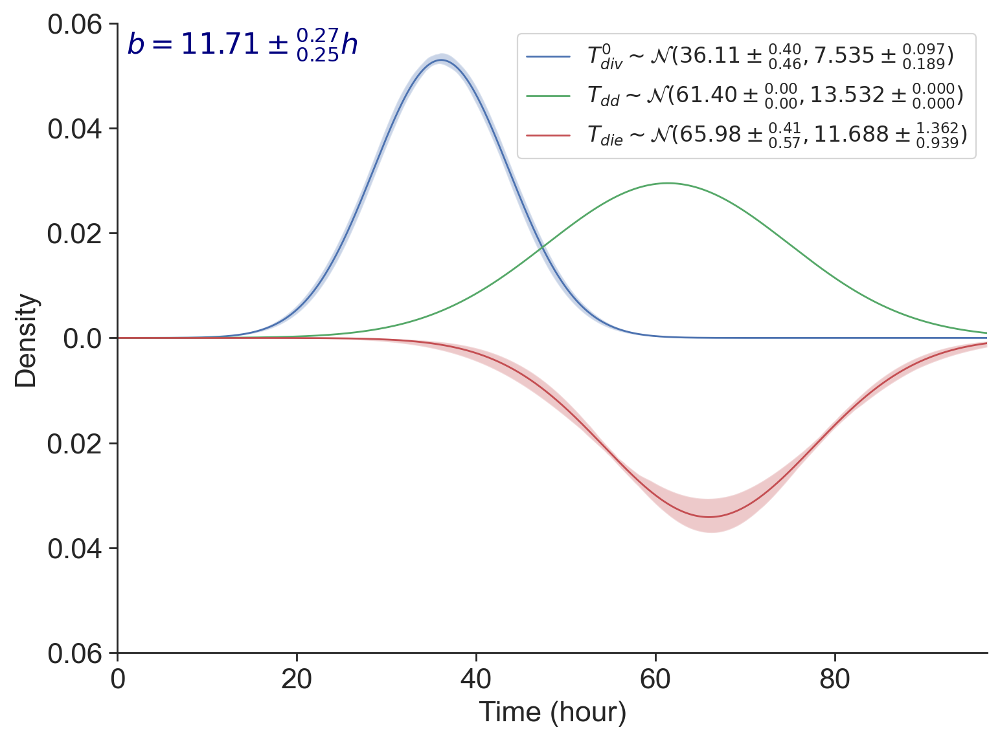

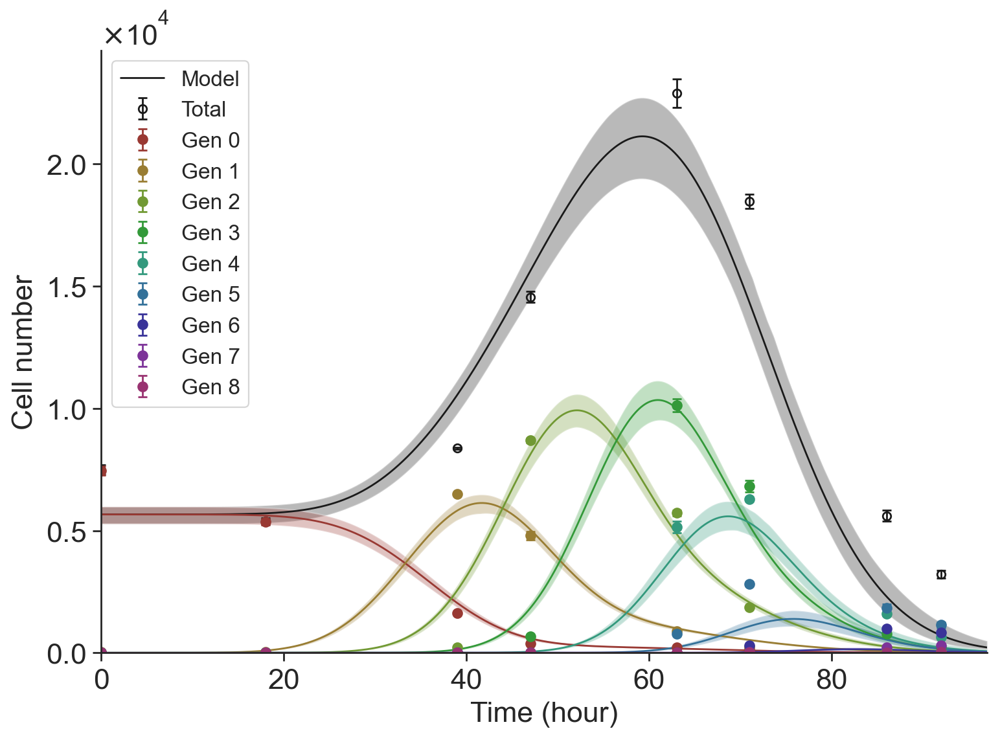

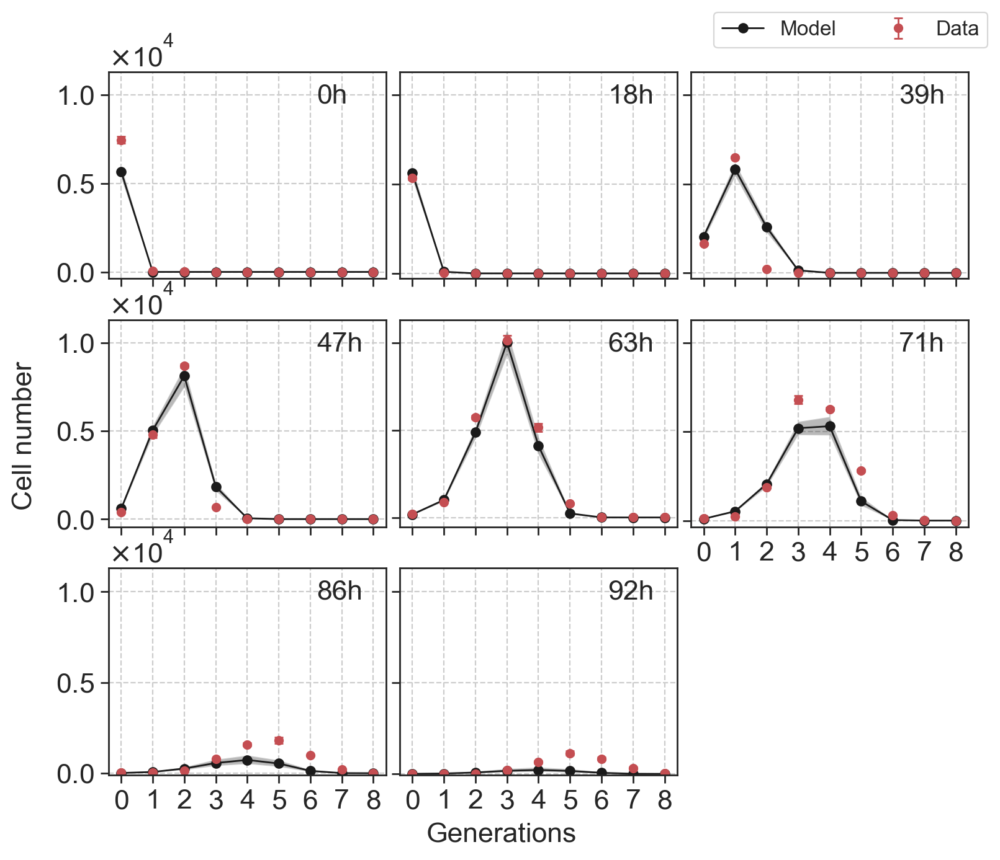

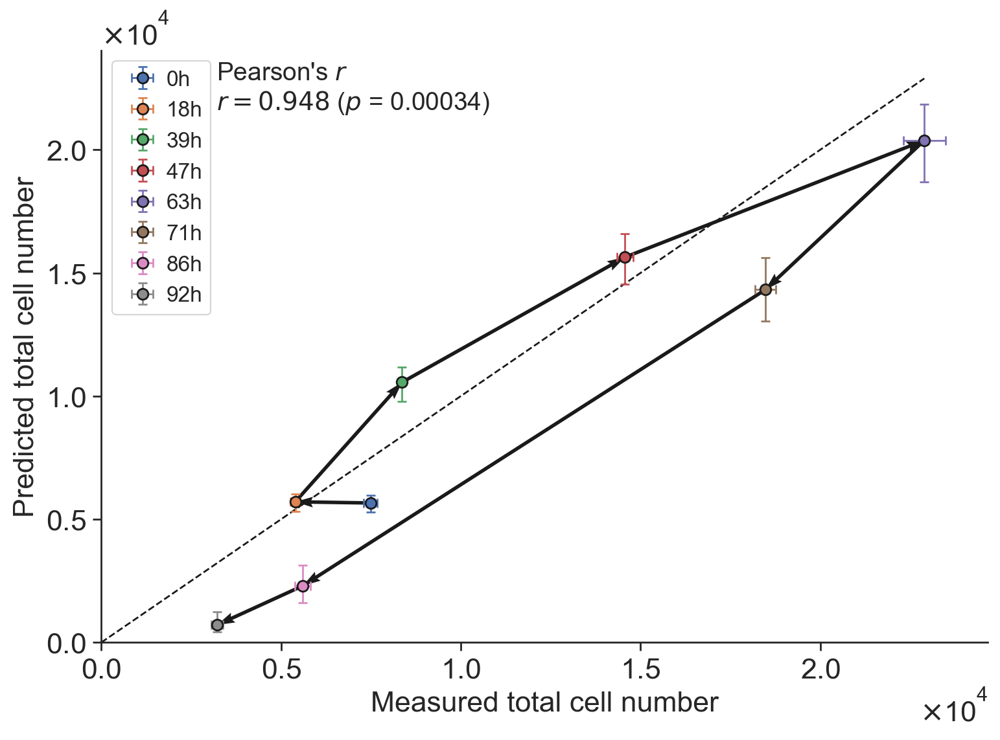

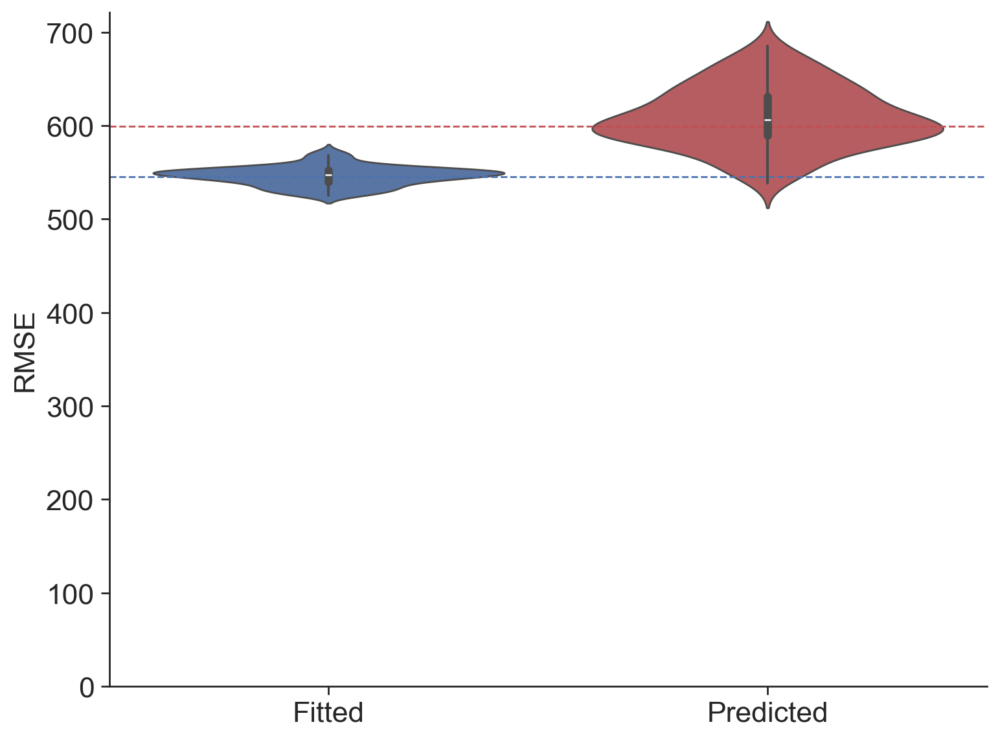

In [19]:
parsDEX3_16MPA50 = pd.read_excel(f'{fitpath}/{key}_MPA 50ngmL DEX 3.16ngmL_result.xlsx', sheet_name=f'pars_MPA 50ngmL DEX 3.16ngmL', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX3_16MPA50.copy() 
bootDEX3_16MPA50 = pd.read_excel(f'{fitpath}/{key}_MPA 50ngmL DEX 3.16ngmL_result.xlsx', sheet_name=f'boot_MPA 50ngmL DEX 3.16ngmL', index_col=0)
fittedBoot = bootDEX3_16MPA50.copy()

icnd = 6
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsMPA50, bootMPA50, parsDEX3_16, bootDEX3_16)
times, ext, curvesCI = predict(dfDEX_MPA, icnd, predPars, predBoot, bootDEX3_16MPA50)

path = "./out/Predictions/1. Different Timers/DEX + MPA/DV24_001/DEX 3.16 + MPA 50"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_MPA, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 3.16 + MPA 100

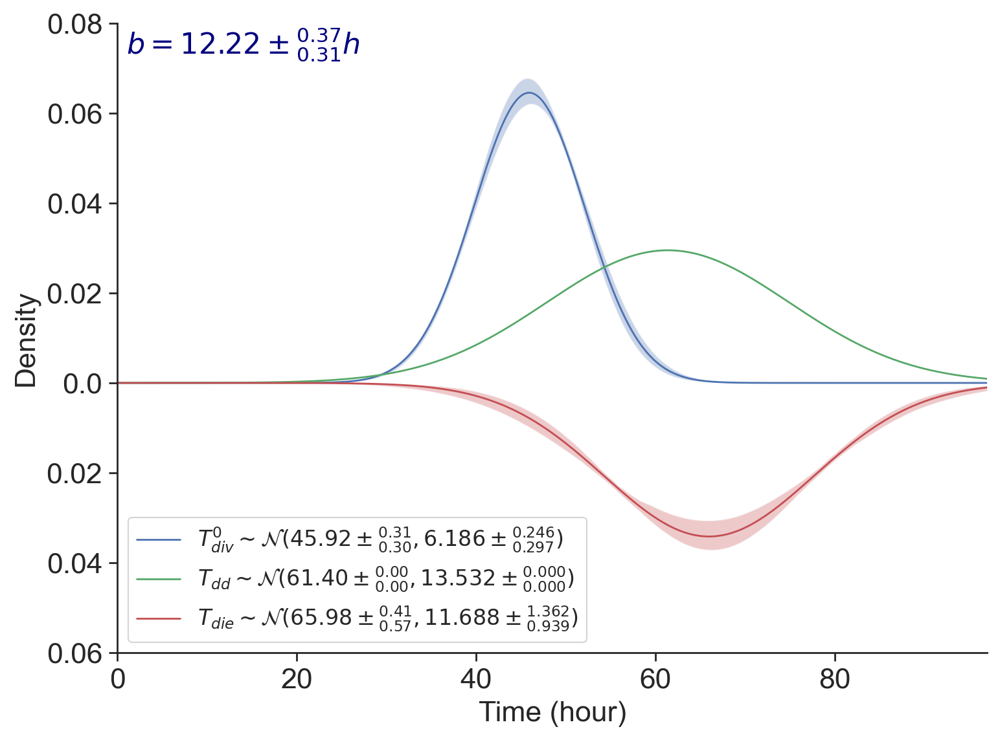

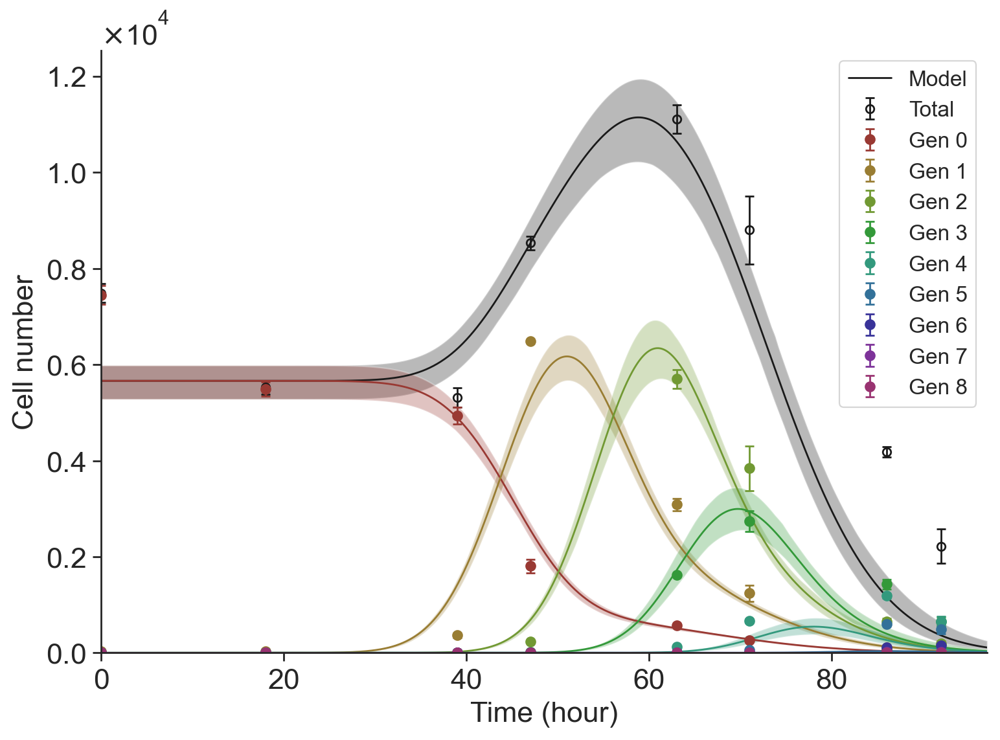

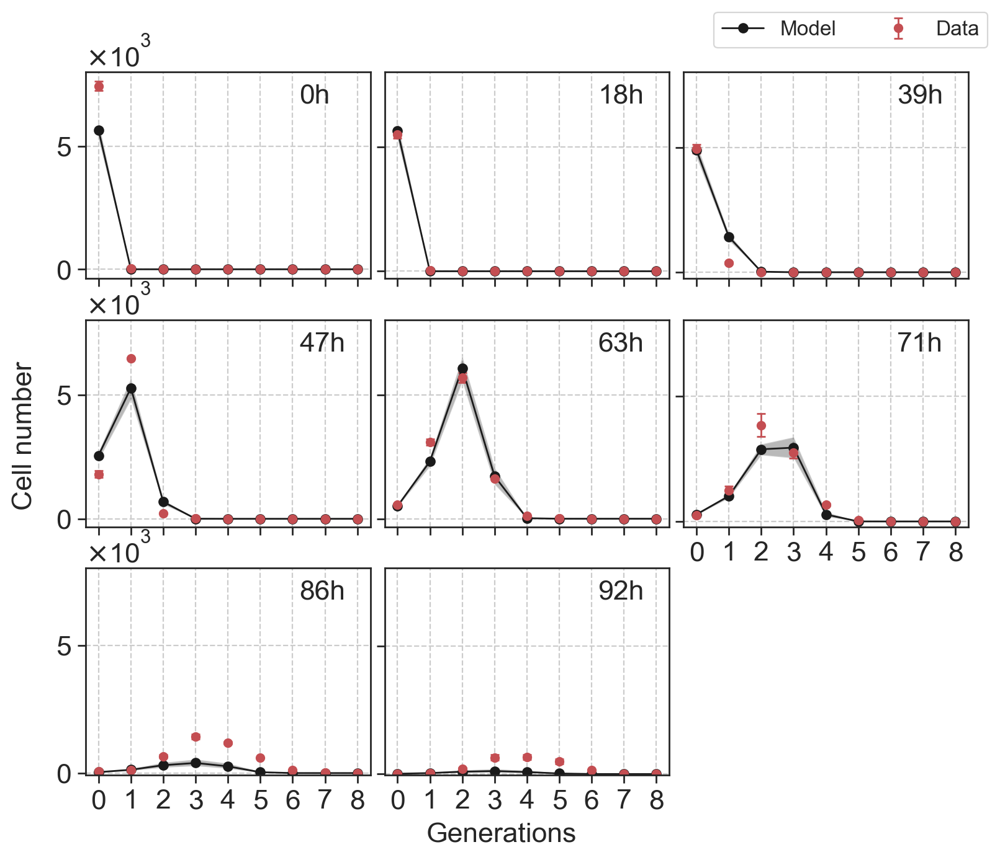

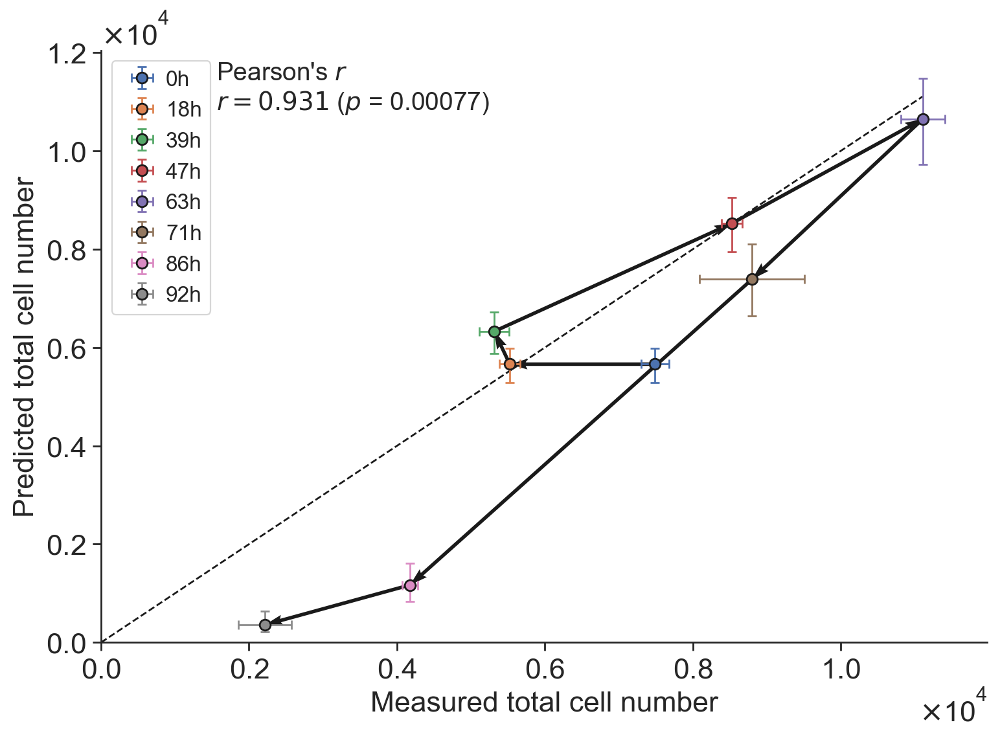

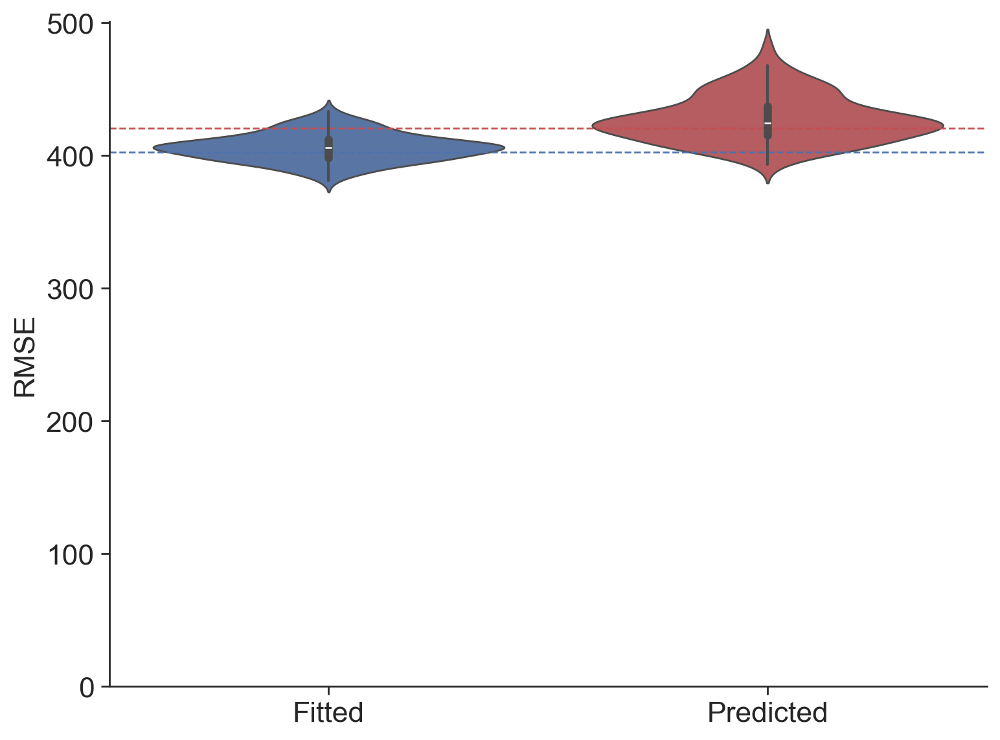

In [20]:
parsDEX3_16MPA100 = pd.read_excel(f'{fitpath}/{key}_MPA 100ngmL DEX 3.16ngmL_result.xlsx', sheet_name=f'pars_MPA 100ngmL DEX 3.16ngmL', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX3_16MPA100.copy() 
bootDEX3_16MPA100 = pd.read_excel(f'{fitpath}/{key}_MPA 100ngmL DEX 3.16ngmL_result.xlsx', sheet_name=f'boot_MPA 100ngmL DEX 3.16ngmL', index_col=0)
fittedBoot = bootDEX3_16MPA100.copy()

icnd = 10
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsMPA100, bootMPA100, parsDEX3_16, bootDEX3_16)
times, ext, curvesCI = predict(dfDEX_MPA, icnd, predPars, predBoot, bootDEX3_16MPA100)

path = "./out/Predictions/1. Different Timers/DEX + MPA/DV24_001/DEX 3.16 + MPA 100"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_MPA, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 10 + MPA 50

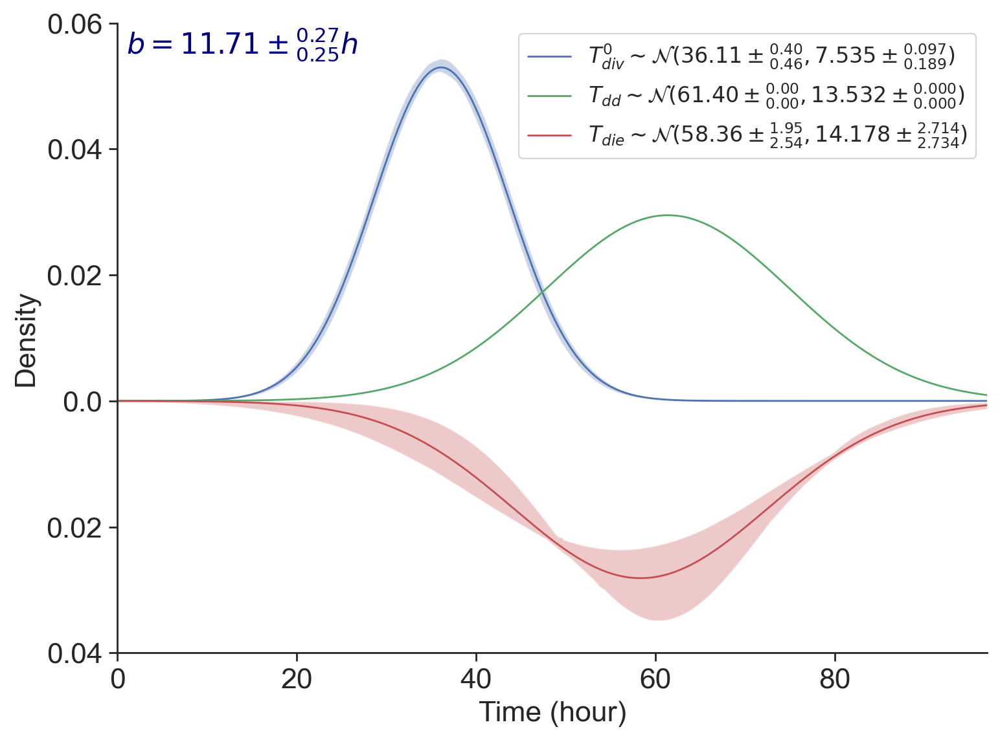

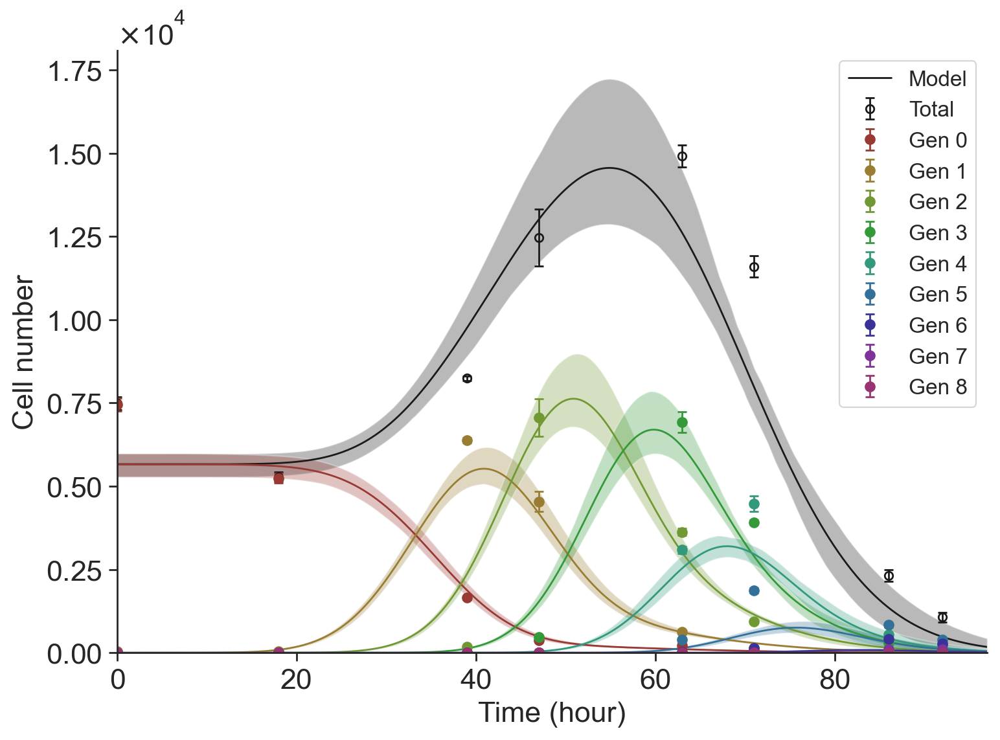

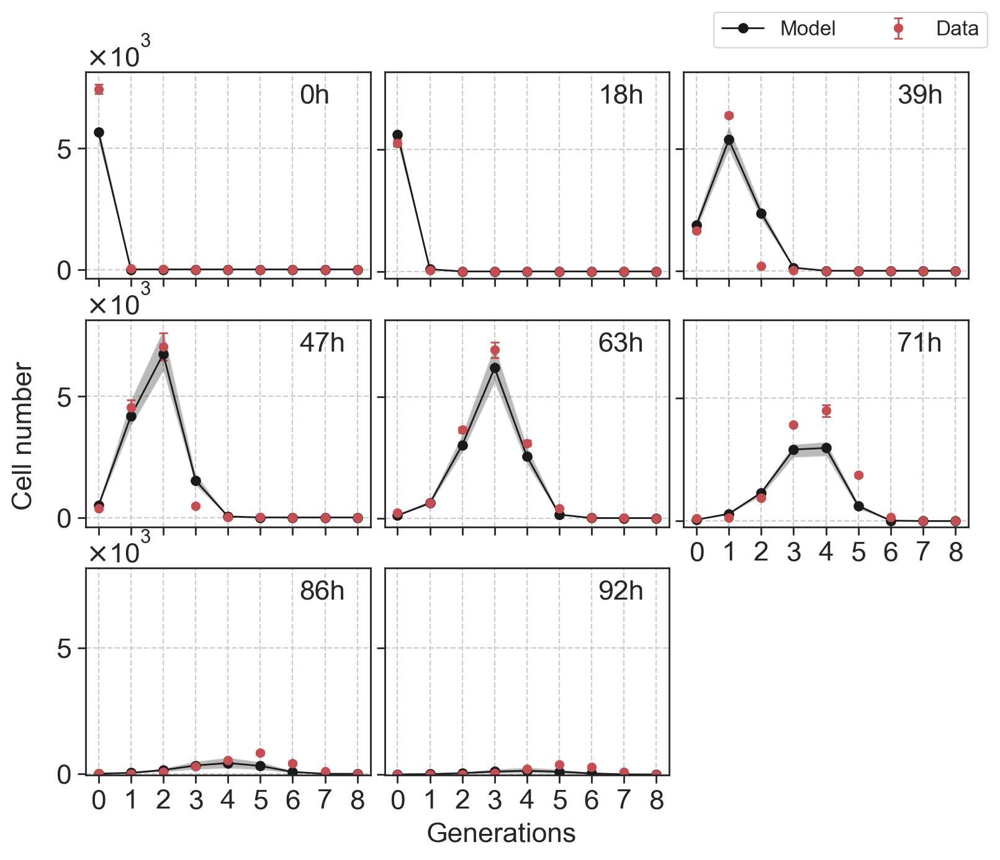

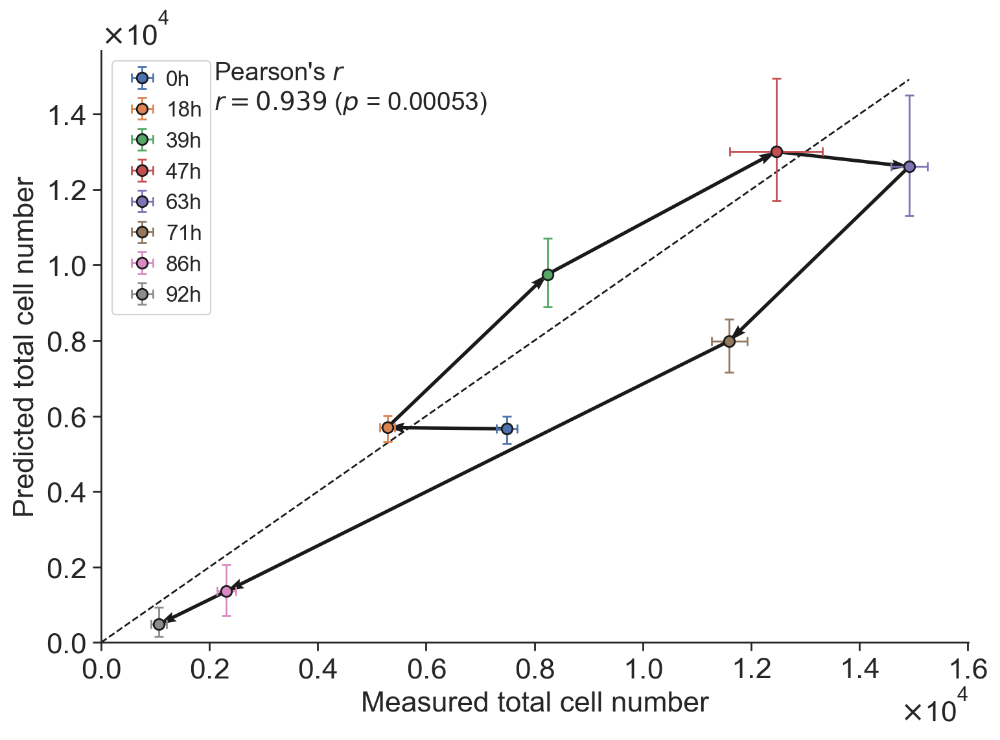

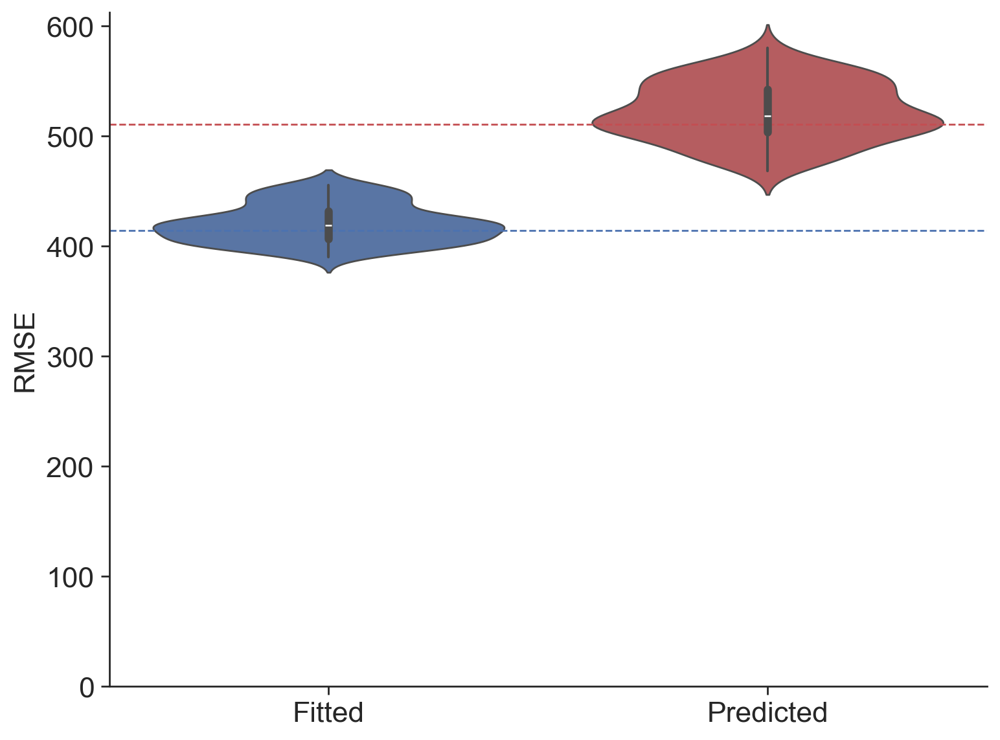

In [21]:
parsDEX10MPA50 = pd.read_excel(f'{fitpath}/{key}_MPA 50ngmL DEX 10ngmL_result.xlsx', sheet_name=f'pars_MPA 50ngmL DEX 10ngmL', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX10MPA50.copy() 
bootDEX10MPA50 = pd.read_excel(f'{fitpath}/{key}_MPA 50ngmL DEX 10ngmL_result.xlsx', sheet_name=f'boot_MPA 50ngmL DEX 10ngmL', index_col=0)
fittedBoot = bootDEX10MPA50.copy()

icnd = 7
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsMPA50, bootMPA50, parsDEX10, bootDEX10)
times, ext, curvesCI = predict(dfDEX_MPA, icnd, predPars, predBoot, bootDEX10MPA50)

path = "./out/Predictions/1. Different Timers/DEX + MPA/DV24_001/DEX 10 + MPA 50"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_MPA, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 10 + MPA 100

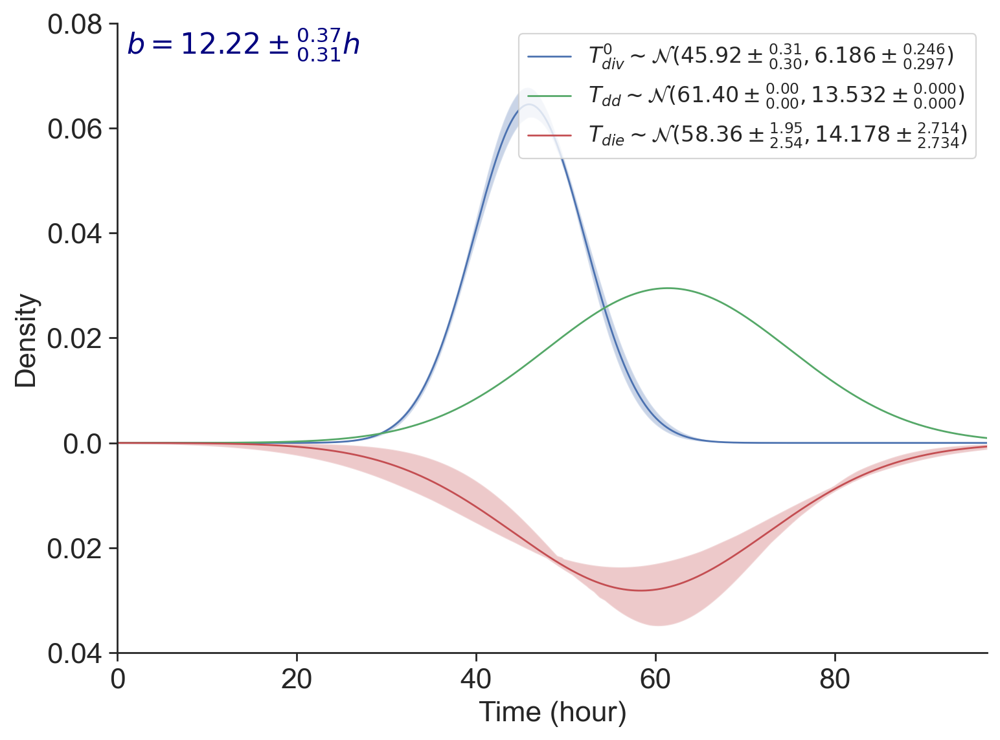

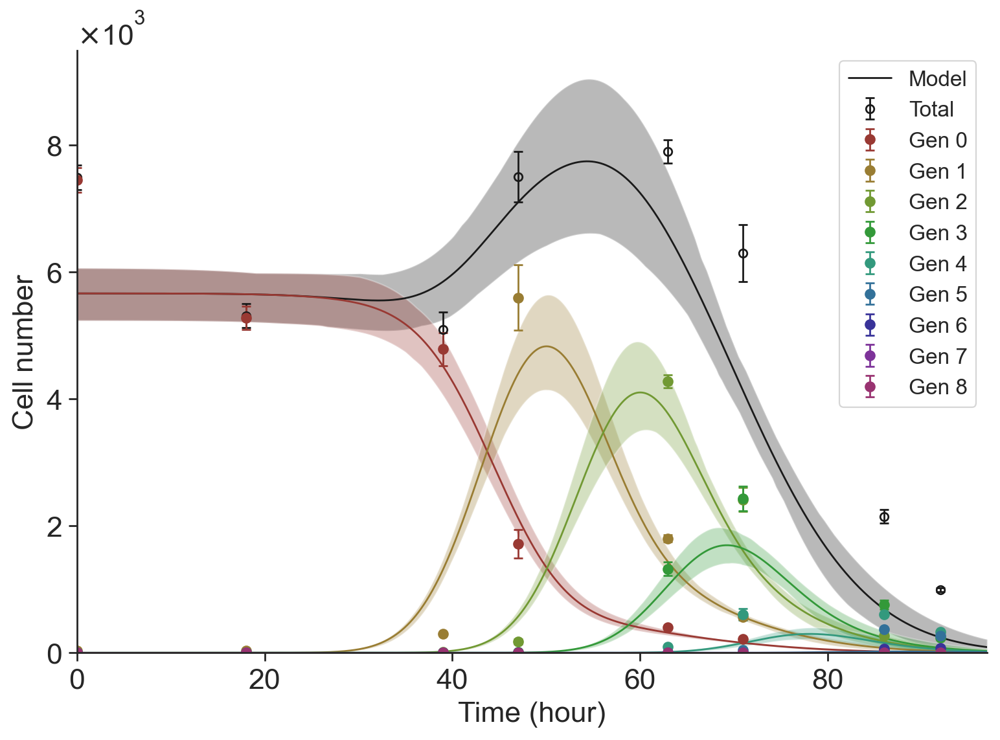

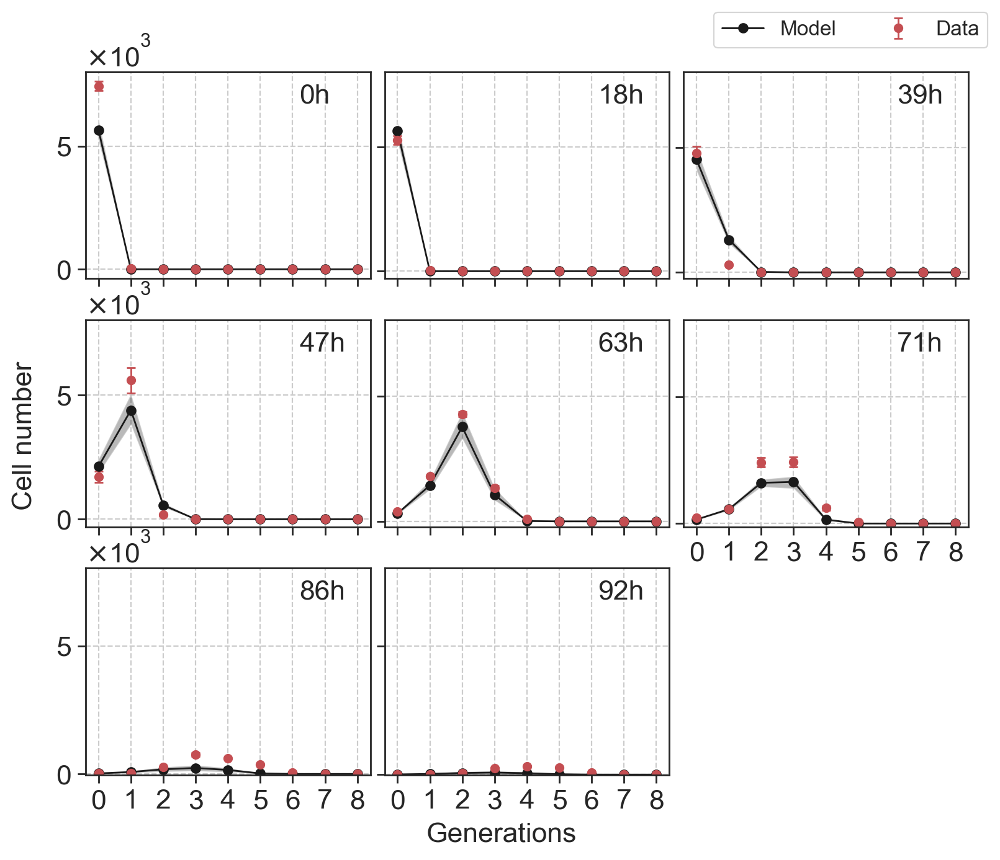

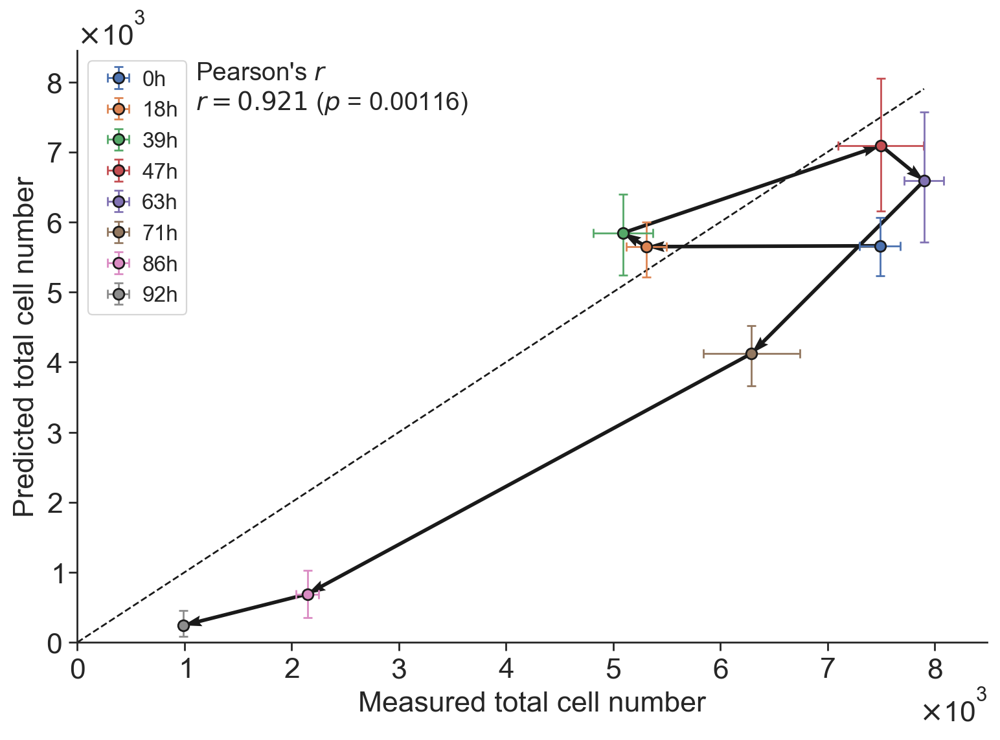

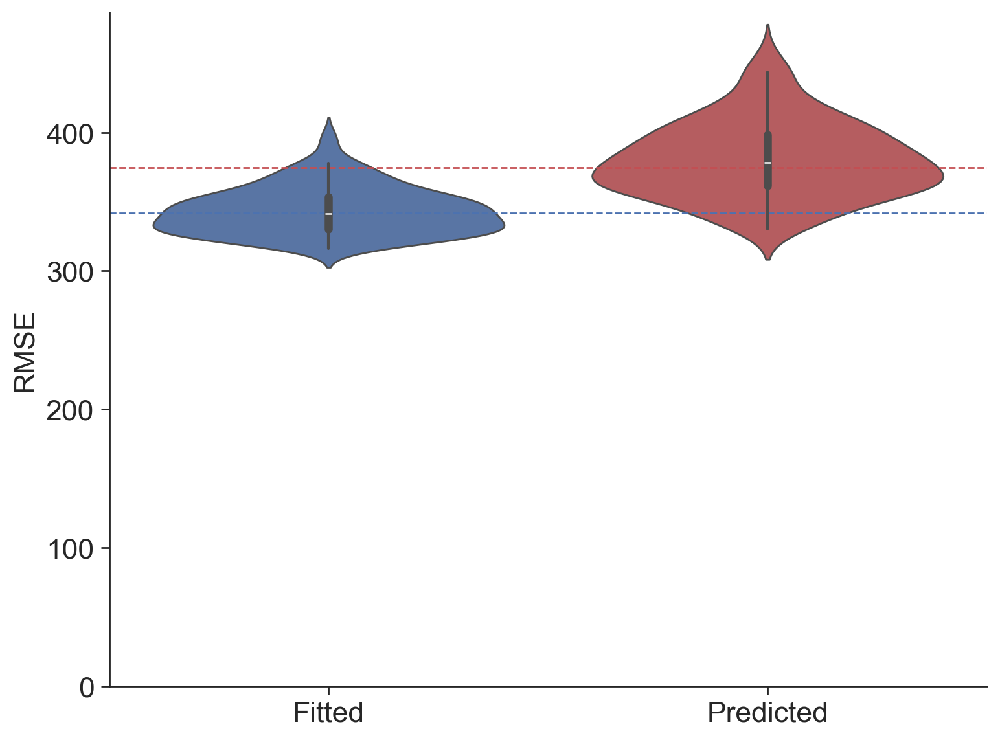

In [22]:
parsDEX10MPA100 = pd.read_excel(f'{fitpath}/{key}_MPA 100ngmL DEX 10ngmL_result.xlsx', sheet_name=f'pars_MPA 100ngmL DEX 10ngmL', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX10MPA100.copy() 
bootDEX10MPA100 = pd.read_excel(f'{fitpath}/{key}_MPA 100ngmL DEX 10ngmL_result.xlsx', sheet_name=f'boot_MPA 100ngmL DEX 10ngmL', index_col=0)
fittedBoot = bootDEX10MPA100.copy()

icnd = 11
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsMPA100, bootMPA100, parsDEX10, bootDEX10)
times, ext, curvesCI = predict(dfDEX_MPA, icnd, predPars, predBoot, bootDEX10MPA100)

path = "./out/Predictions/1. Different Timers/DEX + MPA/DV24_001/DEX 10 + MPA 100"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_MPA, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

# [DV24_003] Dex + Rapa (Repeat)

In [23]:
dfDEX_Rapa = parse_data('./data', ['DV24_003 Rapa+DEX.xlsx'])['DV24_003 Rapa+DEX']
dfDEX_Rapa['reader'].condition_names

['No drug',
 'Rapa 158pgmL',
 'Rapa 500pgmL',
 'DEX 1ngmL',
 'Rapa 158pgmL + DEX 1ngmL',
 'Rapa 500pgmL + DEX 1ngmL',
 'DEX 10ngmL',
 'Rapa 158pgmL + DEX 10ngmL',
 'Rapa 500pgmL + DEX 10ngmL',
 'unstimulated']

In [24]:
# Extract and define key variables
key = 'DV24_003 Rapa+DEX'
fitpath = './out/Best-fit Parameters/2. Different Timers/DV24_003 Rapa + DEX (Fixed Tdd)'

# Import No drug parameters
parsCTRL = pd.read_excel(f'{fitpath}/{key}_No drug_result.xlsx', sheet_name=f'pars_No drug', index_col=0)['best-fit'].to_dict()
bootCTRL = pd.read_excel(f'{fitpath}/{key}_No drug_result.xlsx', sheet_name=f'boot_No drug', index_col=0)

# Import Dex titrations
parsDEX1 = pd.read_excel(f'{fitpath}/{key}_DEX 1ngmL_result.xlsx', sheet_name=f'pars_DEX 1ngmL', index_col=0)['best-fit'].to_dict()
bootDEX1 = pd.read_excel(f'{fitpath}/{key}_DEX 1ngmL_result.xlsx', sheet_name=f'boot_DEX 1ngmL', index_col=0)

parsDEX10 = pd.read_excel(f'{fitpath}/{key}_DEX 10ngmL_result.xlsx', sheet_name=f'pars_DEX 10ngmL', index_col=0)['best-fit'].to_dict()
bootDEX10 = pd.read_excel(f'{fitpath}/{key}_DEX 10ngmL_result.xlsx', sheet_name=f'boot_DEX 10ngmL', index_col=0)

# Import Rapa titrations
parsRAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 158pgmL_result.xlsx', sheet_name=f'pars_Rapamycin 158pgmL', index_col=0)['best-fit'].to_dict()
bootRAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 158pgmL_result.xlsx', sheet_name=f'boot_Rapamycin 158pgmL', index_col=0)

parsRAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 500pgmL_result.xlsx', sheet_name=f'pars_Rapamycin 500pgmL', index_col=0)['best-fit'].to_dict()
bootRAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 500pgmL_result.xlsx', sheet_name=f'boot_Rapamycin 500pgmL', index_col=0)

## Dex 1 + Rapa 158

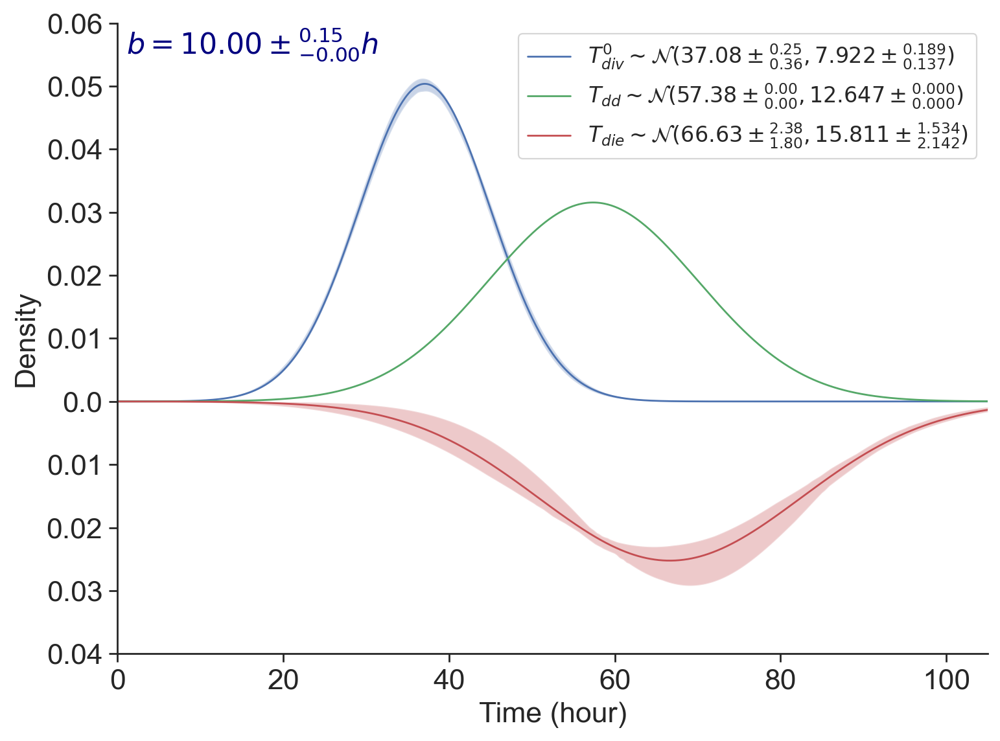

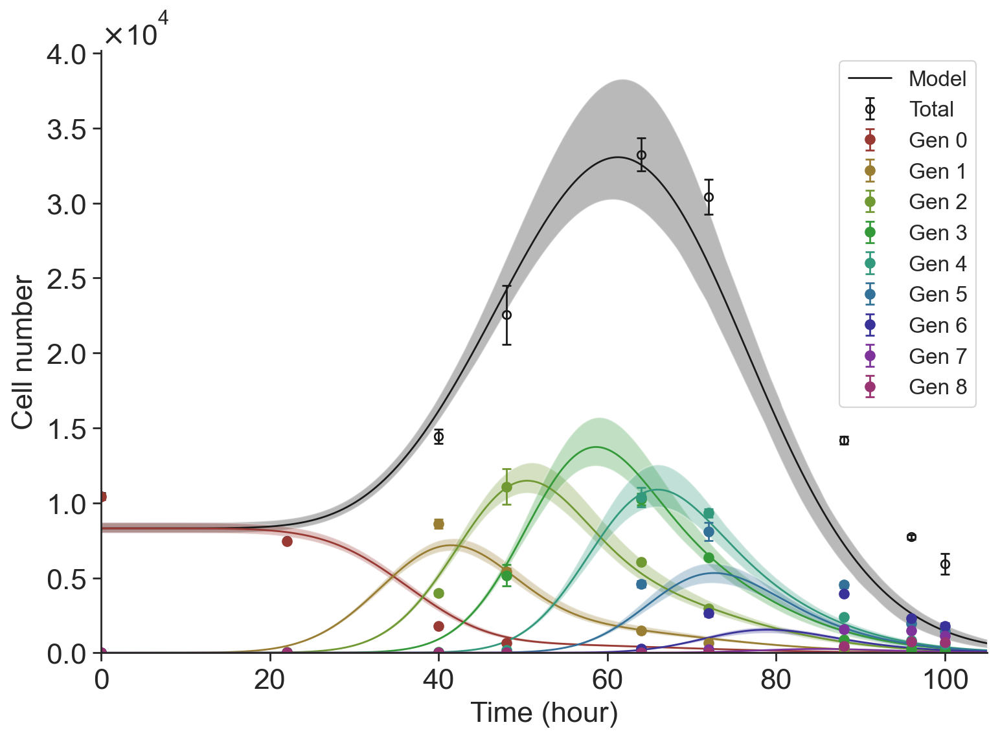

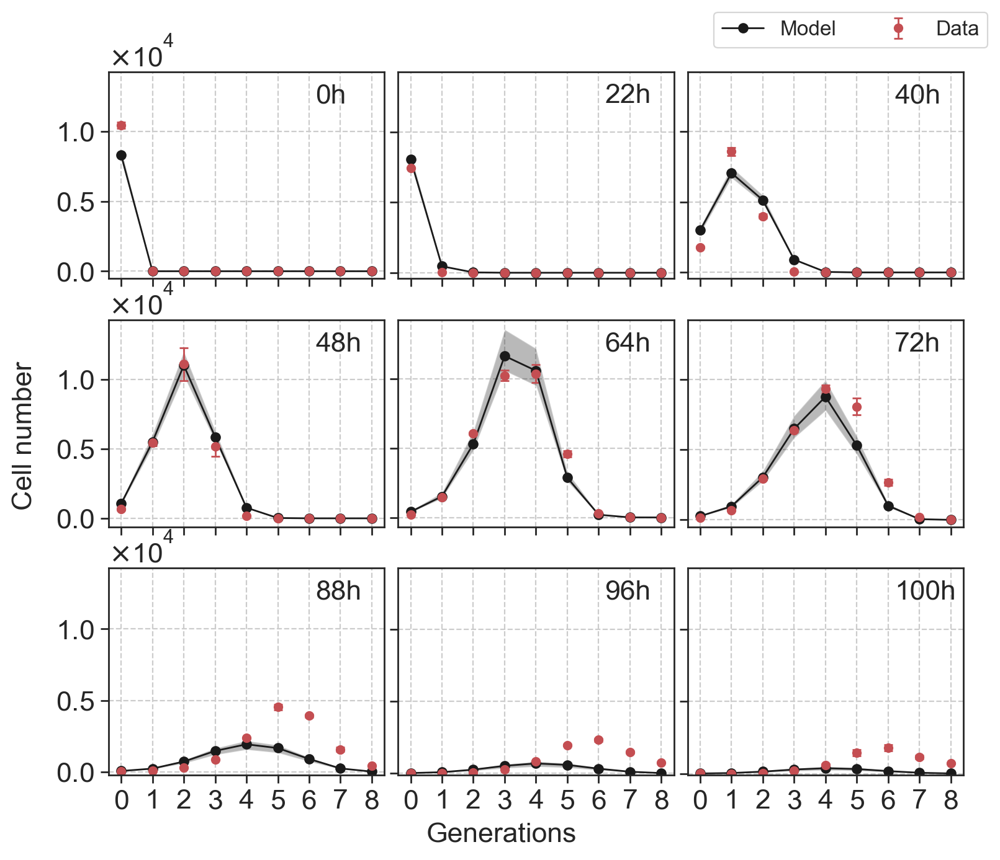

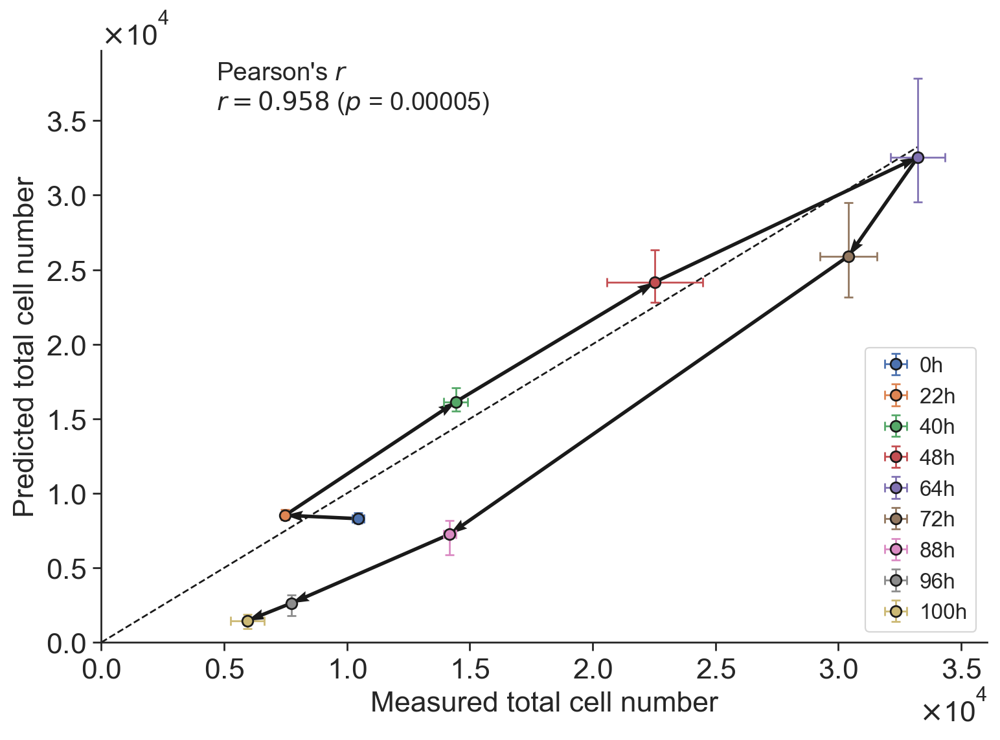

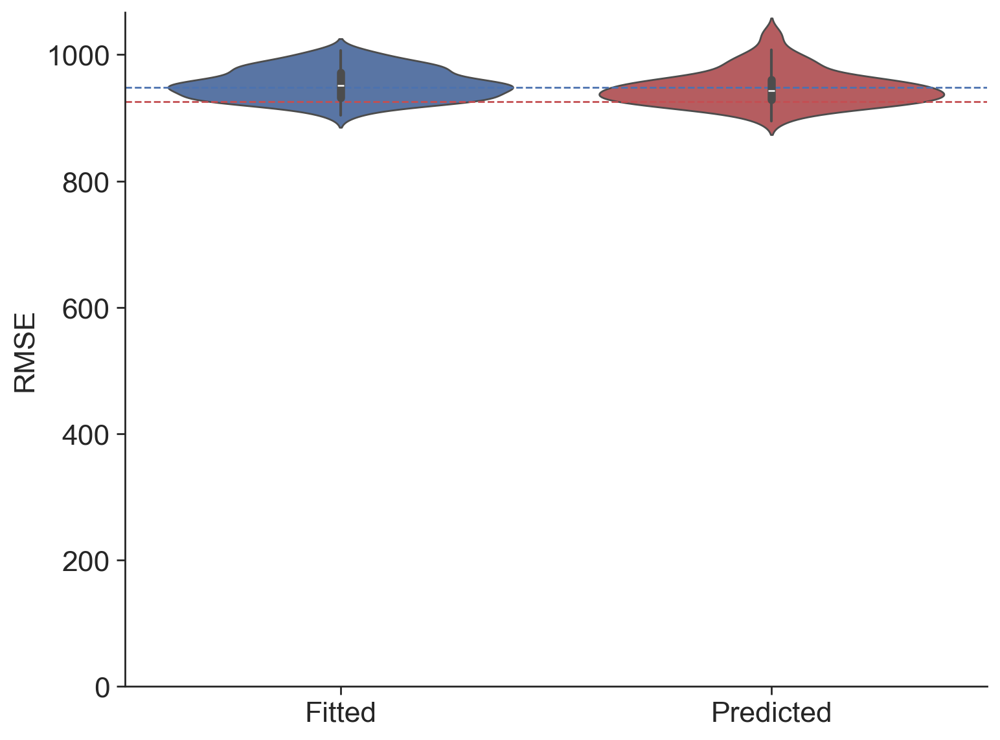

In [25]:
parsDEX1RAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 158pgmL + DEX 1ngmL_result.xlsx', sheet_name=f'pars_Rapamycin 158pgmL + DEX 1', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX1RAPA158.copy() 
bootDEX1RAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 158pgmL + DEX 1ngmL_result.xlsx', sheet_name=f'boot_Rapamycin 158pgmL + DEX 1', index_col=0)
fittedBoot = bootDEX1RAPA158.copy()

icnd = 4
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA158, bootRAPA158, parsDEX1, bootDEX1)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX1RAPA158)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV24_003/DEX 1 + RAPA 158"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 1 + Rapa 500

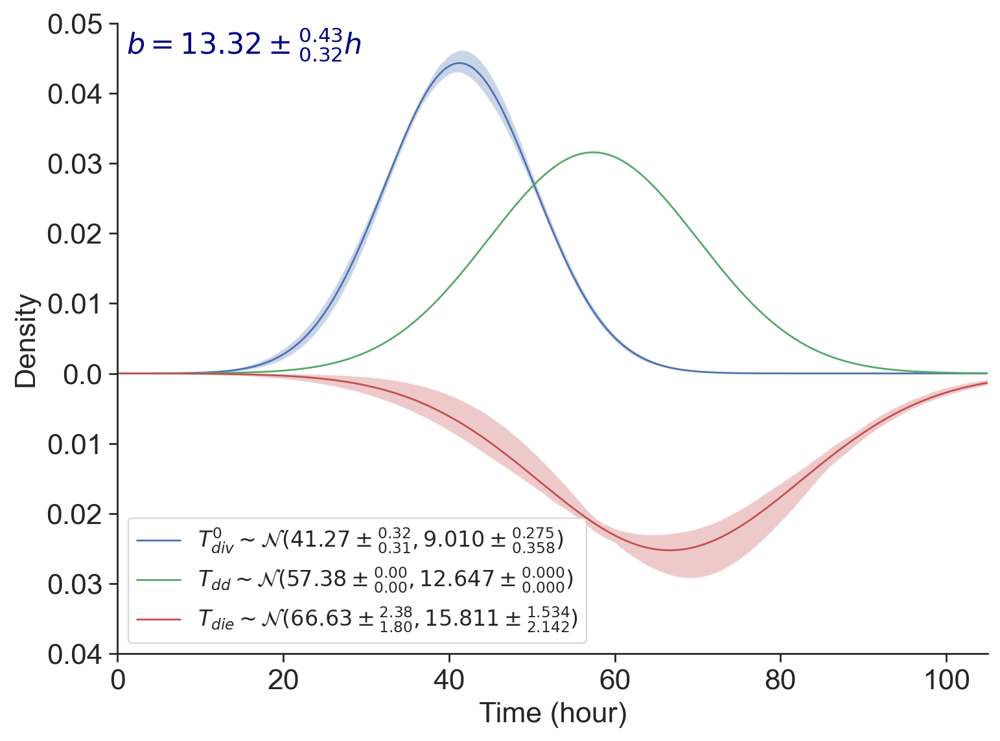

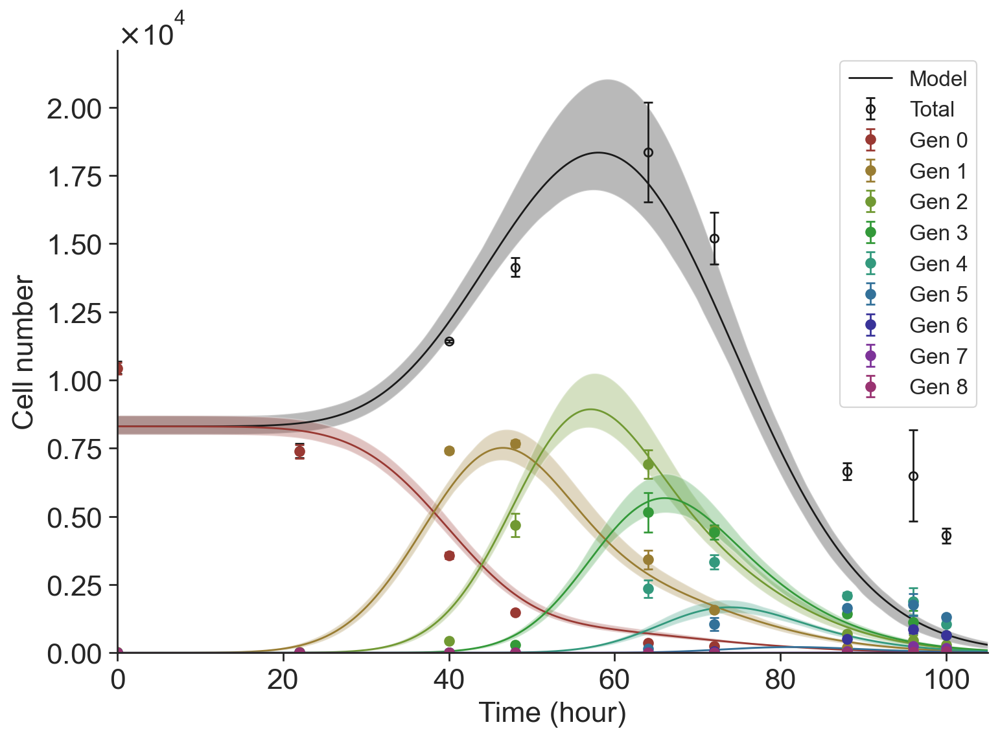

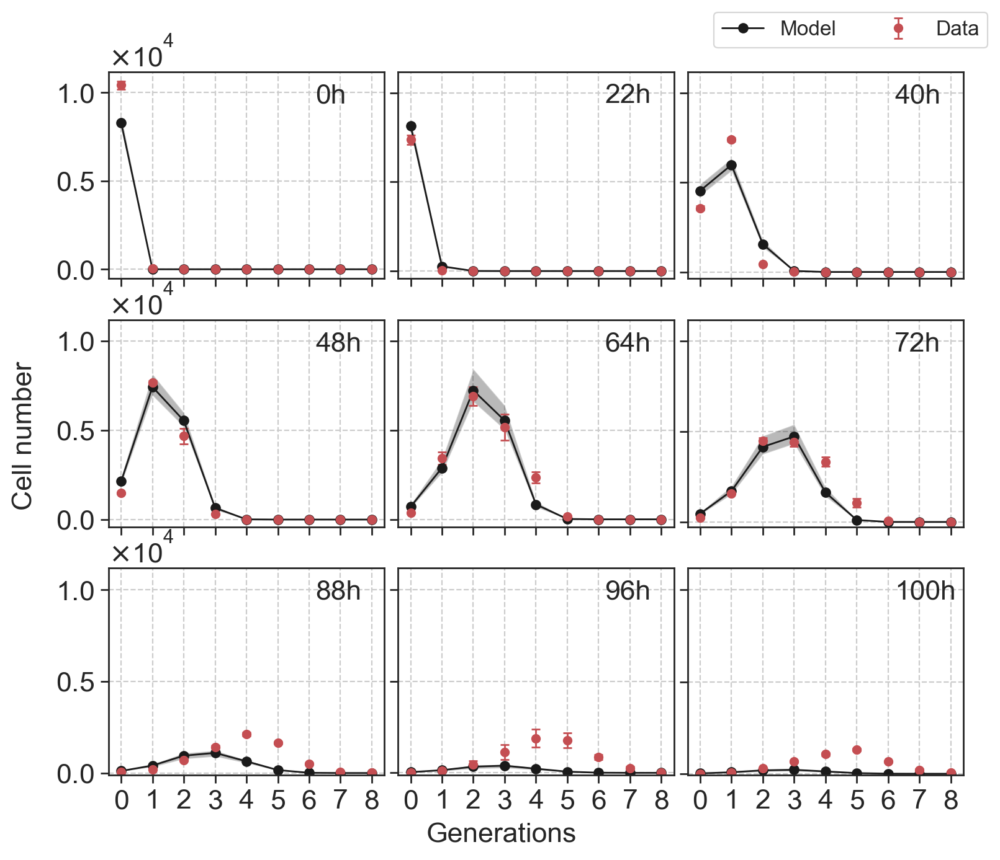

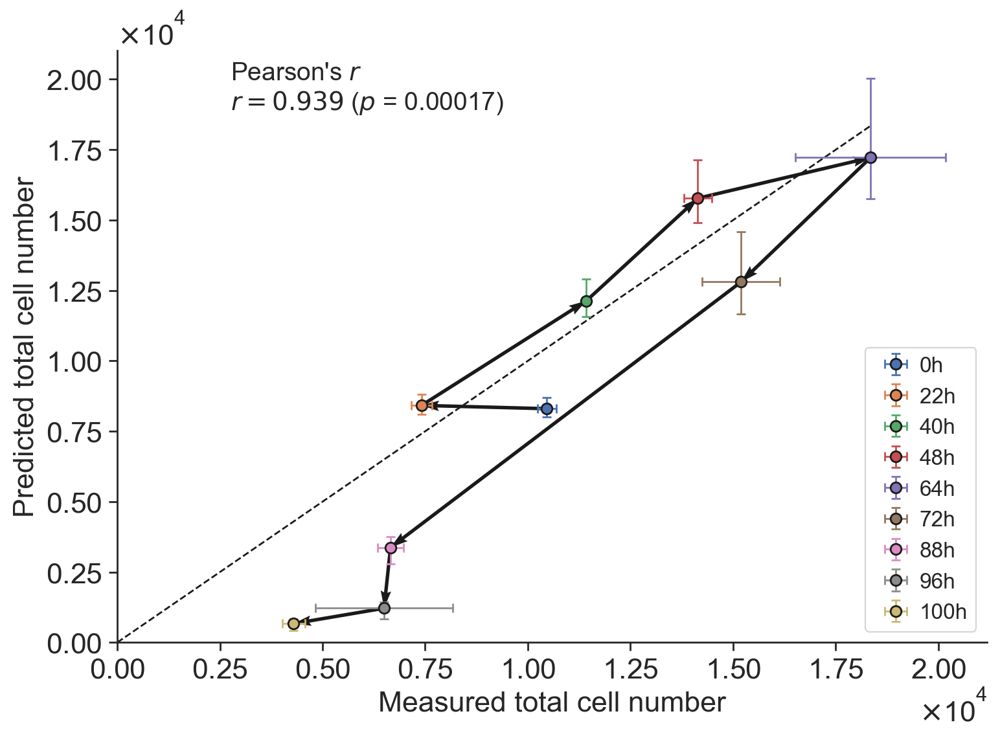

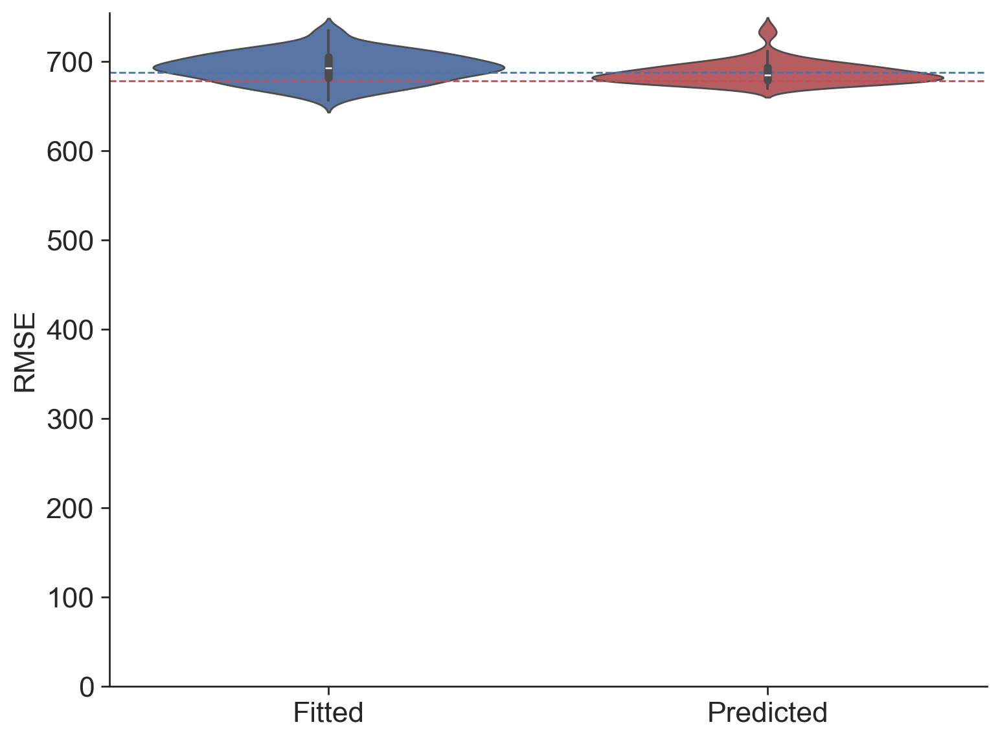

In [26]:
parsDEX1RAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 500pgmL + DEX 1ngmL_result.xlsx', sheet_name=f'pars_Rapamycin 500pgmL + DEX 1', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX1RAPA500.copy() 
bootDEX1RAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 500pgmL + DEX 1ngmL_result.xlsx', sheet_name=f'boot_Rapamycin 500pgmL + DEX 1', index_col=0)
fittedBoot = bootDEX1RAPA500.copy()

icnd = 5
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA500, bootRAPA500, parsDEX1, bootDEX1)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX1RAPA500)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV24_003/DEX 1 + RAPA 500"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 10 + Rapa 158

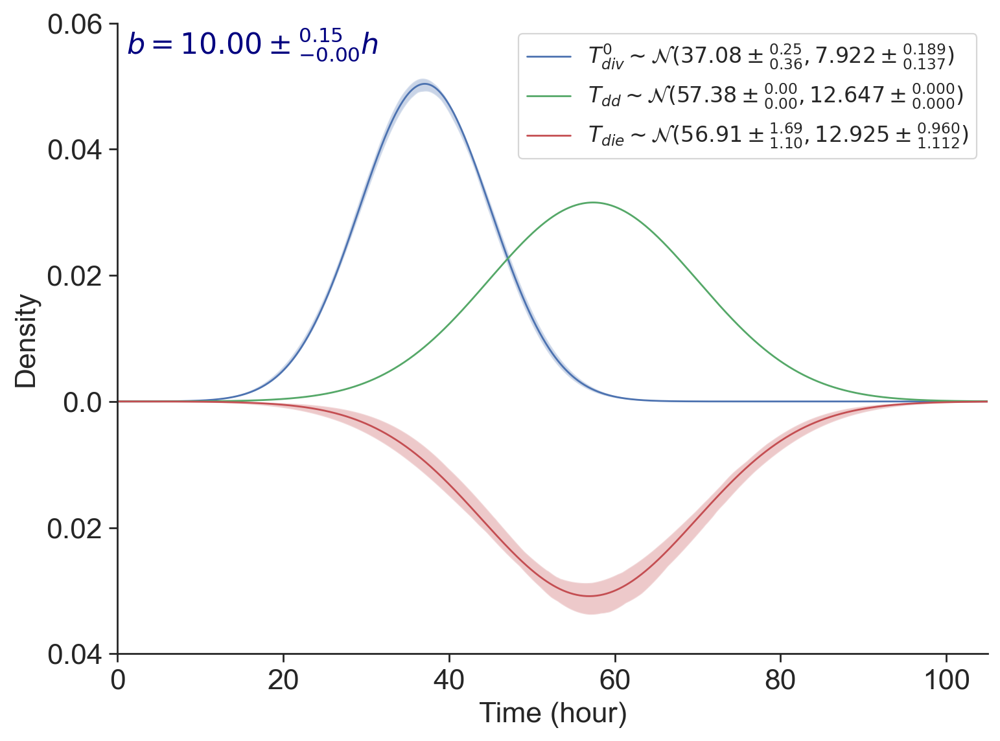

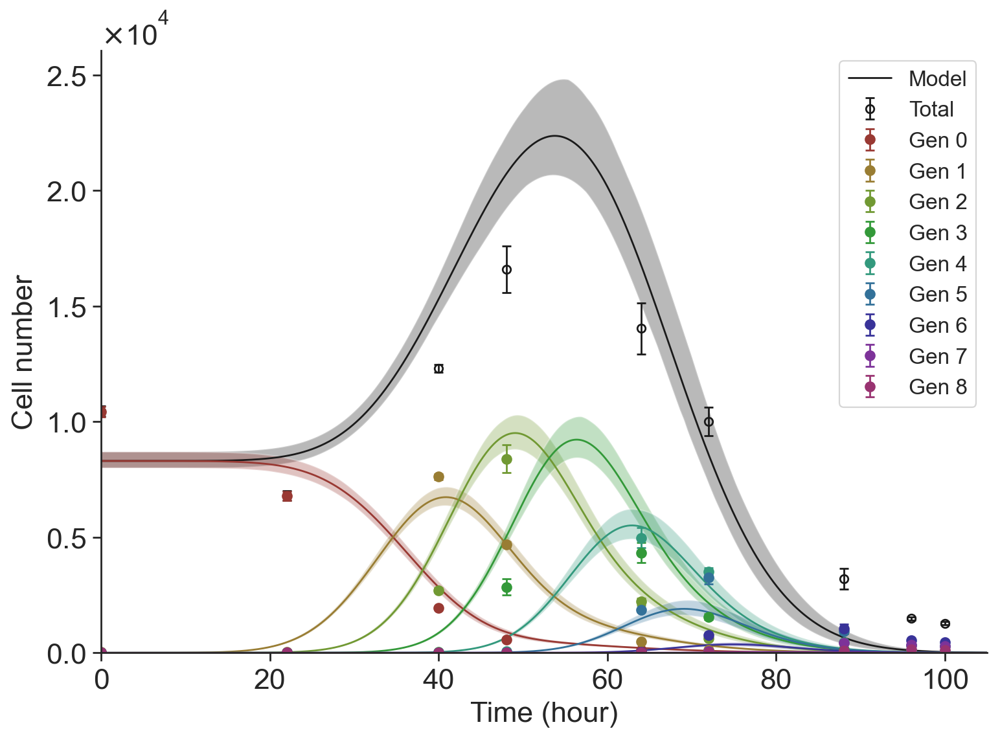

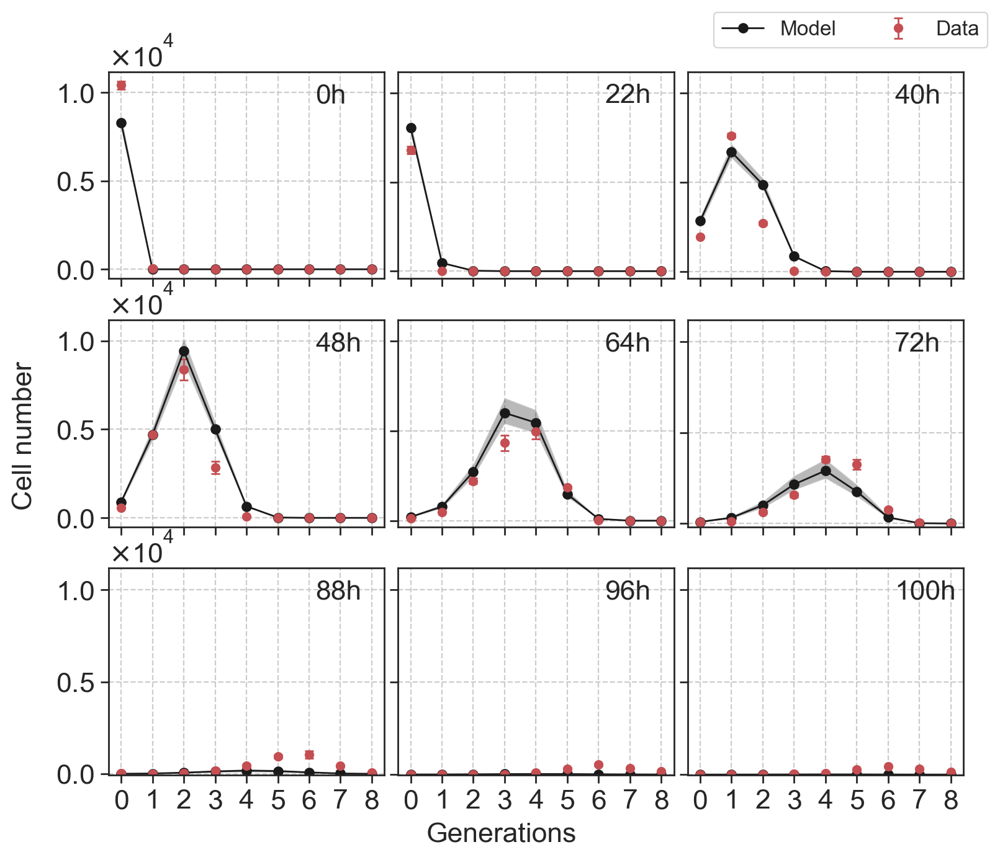

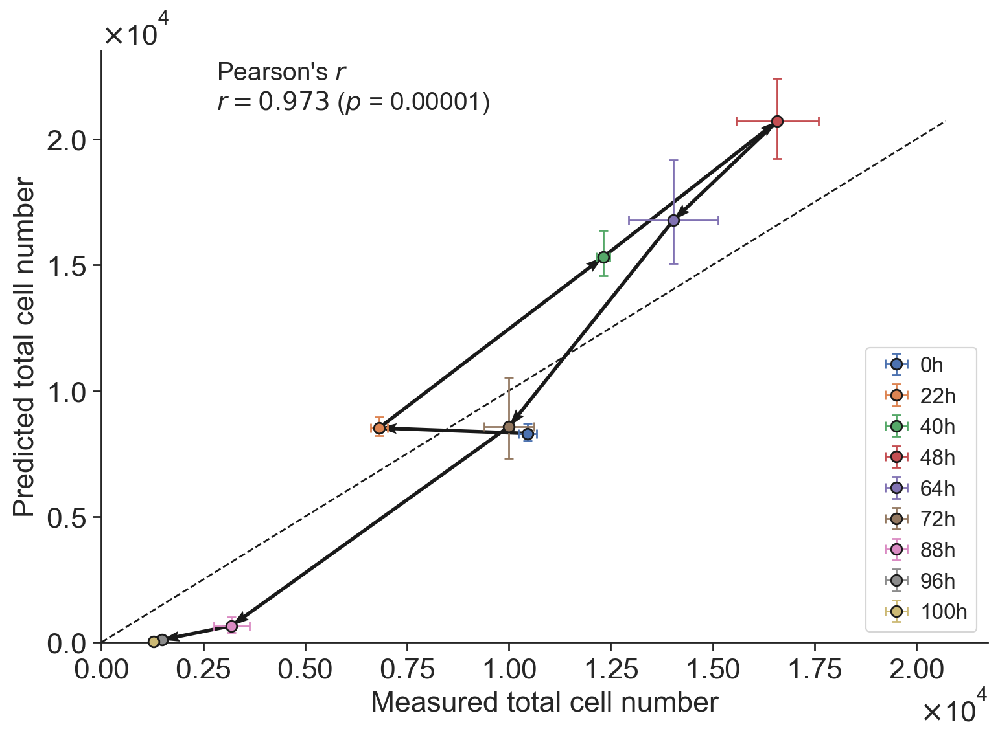

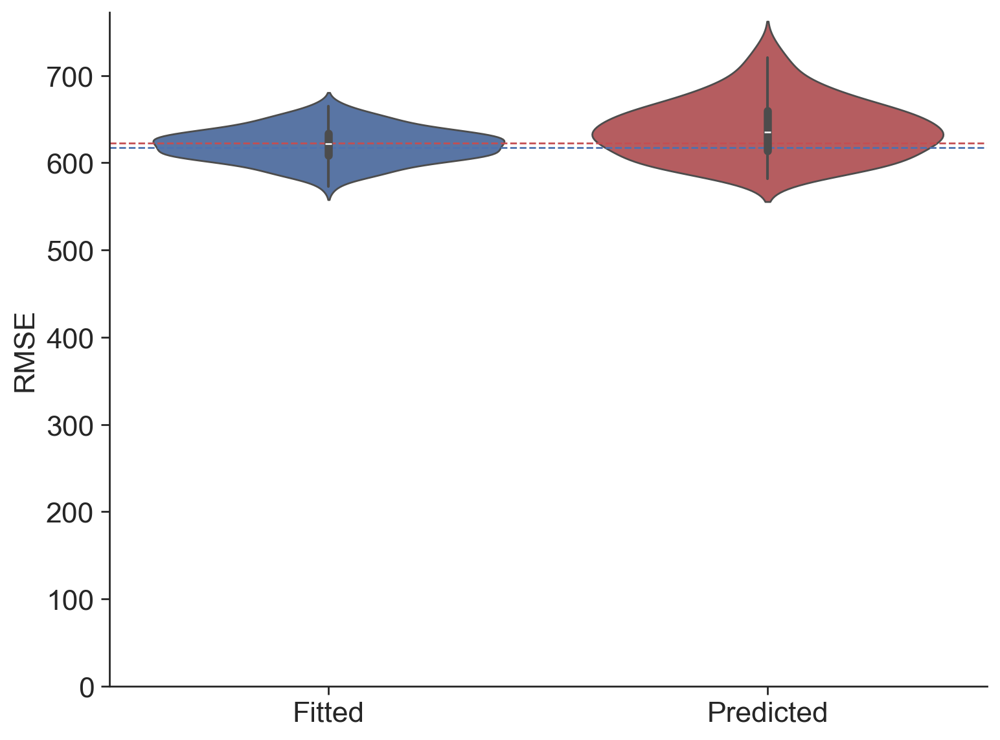

In [27]:
parsDEX10RAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 158pgmL + DEX 10ngmL_result.xlsx', sheet_name=f'pars_Rapamycin 158pgmL + DEX 10', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX10RAPA158.copy() 
bootDEX10RAPA158 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 158pgmL + DEX 10ngmL_result.xlsx', sheet_name=f'boot_Rapamycin 158pgmL + DEX 10', index_col=0)
fittedBoot = bootDEX10RAPA158.copy()

icnd = 7
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA158, bootRAPA158, parsDEX10, bootDEX10)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX10RAPA158)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV24_003/DEX 10 + RAPA 158"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()

## Dex 10 + Rapa 500

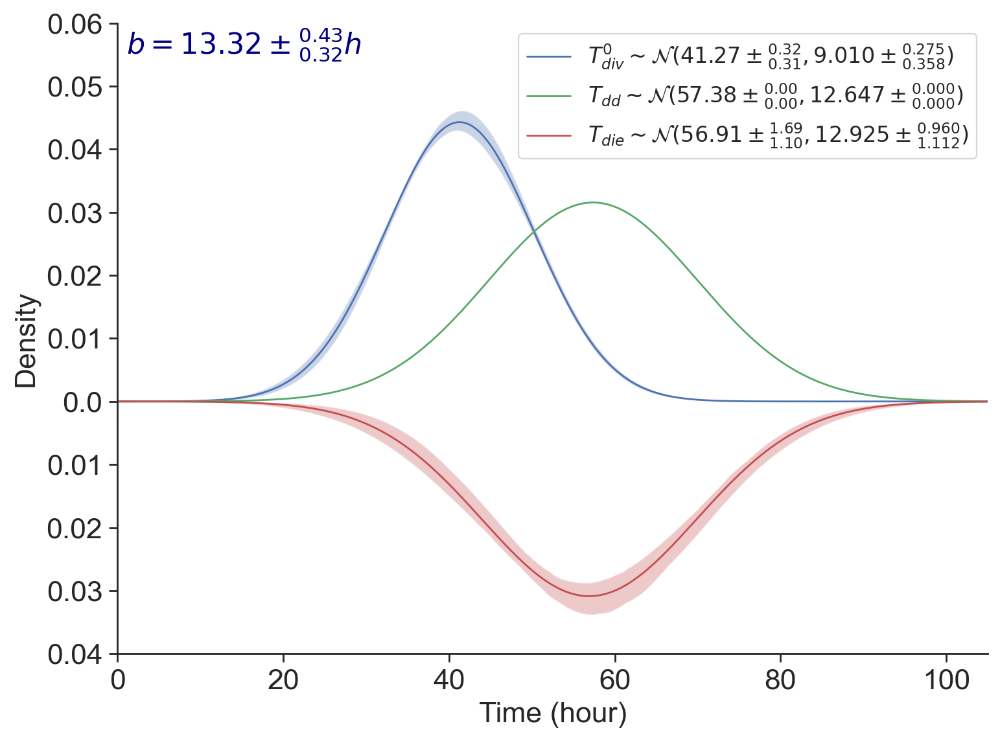

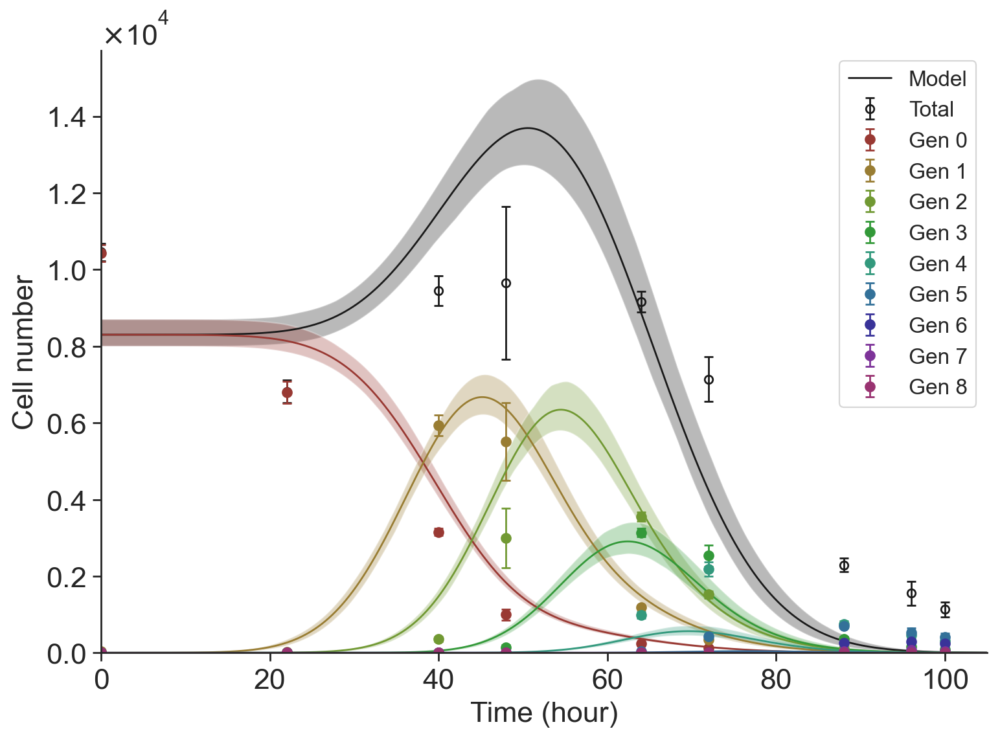

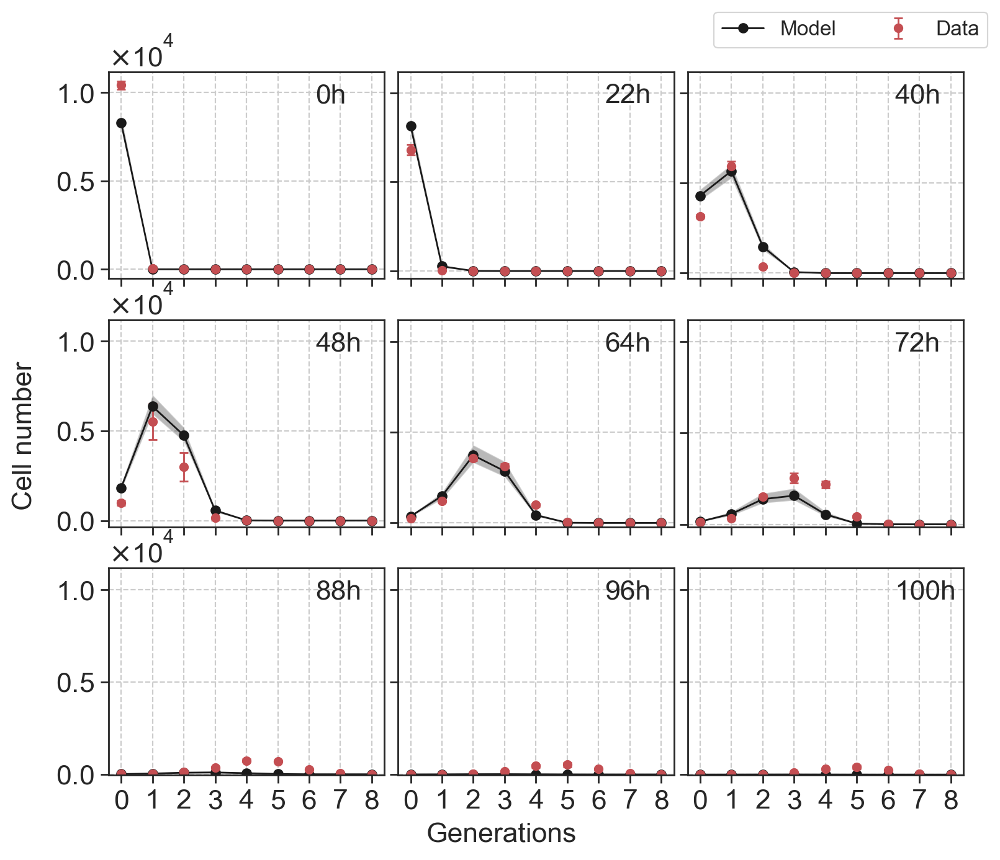

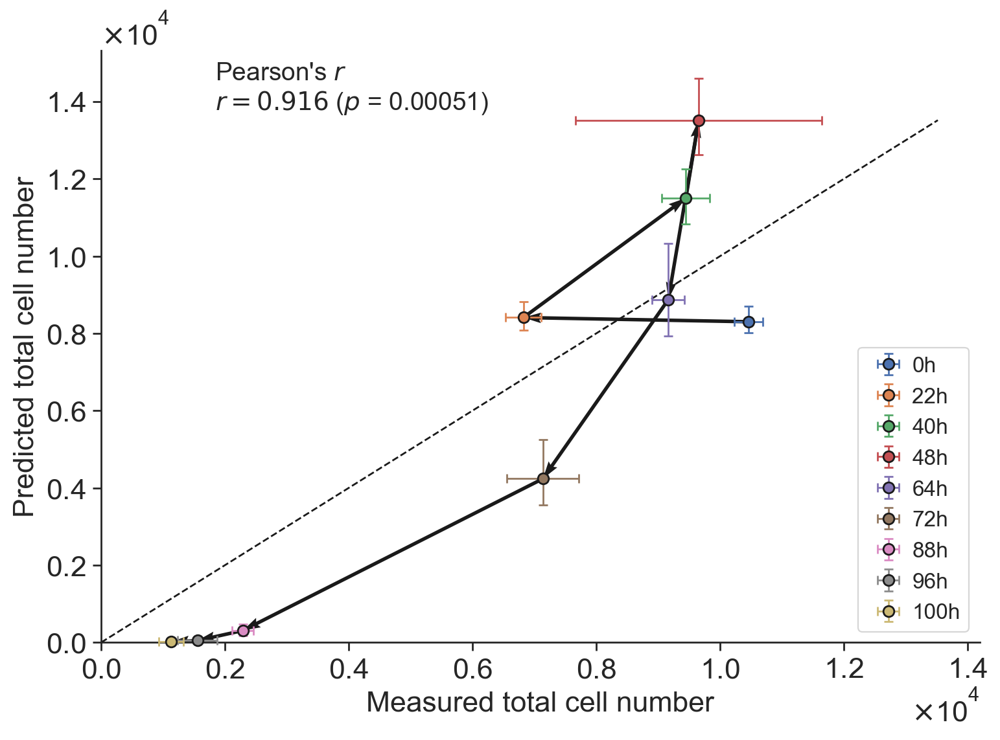

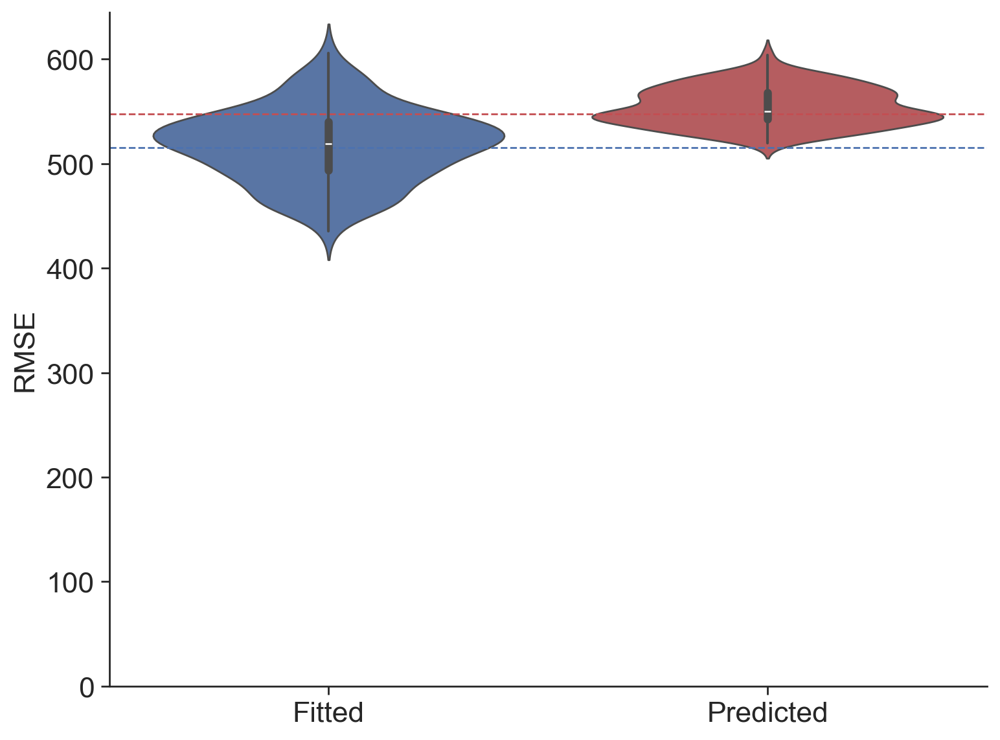

In [28]:
parsDEX10RAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 500pgmL + DEX 10ngmL_result.xlsx', sheet_name=f'pars_Rapamycin 500pgmL + DEX 10', index_col=0)['best-fit'].to_dict()
fittedPars = parsDEX10RAPA500.copy() 
bootDEX10RAPA500 = pd.read_excel(f'{fitpath}/{key}_Rapamycin 500pgmL + DEX 10ngmL_result.xlsx', sheet_name=f'boot_Rapamycin 500pgmL + DEX 10', index_col=0)
fittedBoot = bootDEX10RAPA500.copy()

icnd = 8
predPars, predBoot = signalAddReplace(parsCTRL, bootCTRL, parsRAPA500, bootRAPA500, parsDEX10, bootDEX10)
times, ext, curvesCI = predict(dfDEX_Rapa, icnd, predPars, predBoot, bootDEX10RAPA500)

path = "./out/Predictions/1. Different Timers/DEX + RAPA/DV24_003/DEX 10 + RAPA 500"
fig1, fig2, fig3, fig4, fig5 = check_prediction(dfDEX_Rapa, icnd, times, fittedPars, fittedBoot, predPars, predBoot, curvesCI, ext, path)
fig1.savefig(f"{path}/f1_predicted_PDFs.pdf", dpi=300)
fig2.savefig(f"{path}/f2_predicted_Cells.pdf", dpi=300)
fig3.savefig(f"{path}/f3_predicted_CellsGens.pdf", dpi=300)
fig4.savefig(f"{path}/f4_ModelvsData.pdf", dpi=300)
fig5.savefig(f"{path}/f5_RMSE.pdf", dpi=300)
plt.show()